# L4 BMD & Microarchitecture — *Clinician-Facing Pipeline v17 (YOLO26-seg, AP + LA)*

### *"The measurement of spinal bone architecture following hip surgery using X-ray datasets"*

The L4 vertebra is segmented with a **YOLO26-seg** instance model, and on top of it sits a
**measurement layer designed to be read by a clinician, not by a computer-vision engineer**:
one primary number with a unit, a percentile, a category, a quality-control verdict, and a
threshold that says whether a change between two visits is real.

- **BAR — Bone Attenuation Ratio** *(primary density index)*. The extra X-ray absorption of L4
  trabecular bone, expressed **in units of the patient's own paraspinal soft tissue**. Dimensionless,
  and provably invariant to exposure / gain / window-level drift.
- **Microarchitecture** — GLCM (contrast, correlation, energy, homogeneity, **entropy**),
  **box-counting fractal dimension**, and a **TBS-like log–log variogram slope**.
- **BHI — Bone Health Index (0–100)** — one composite percentile that fuses density + texture.
- **QC gate** — every measurement is stamped `PASS / WARN / FAIL` with the reason, so a clinician
  knows when *not* to trust the number.
- **LSC — Least Significant Change** — the measured precision error of this pipeline, so a
  follow-up change can be called *real bone loss* rather than *noise*.
- **One-page clinical report card** per study + a `report.json` for the `bmd-viewer` web project.

> ⚠️ **Clinical caveat.** Planar-radiograph "density" is an *uncorrected radiological proxy*, **not**
> areal BMD (g/cm²). `bar_z` and the categories below are **cohort-relative**, computed against *this
> dataset*, and are **not DXA T-scores**. Absolute BMD needs DXA/QCT or an in-image calibration
> phantom. Everything here is a methodological demonstration pending DXA validation.

---

---

### What changed in **v17** — the *explanation* now speaks the same language as the *measurement*

**Background-based normalization, applied end-to-end.** v16 already reported a
background-referenced density index (BAR, §1.2), but the **XAI heatmaps were still drawn from raw
pixel intensity** — so the picture explained a number the pipeline no longer reports.

> **Clinical rationale.** An orthopaedic trauma specialist (University of Edinburgh) notes that
> radiographs are read by the **relative density contrast between bone and the surrounding
> background**, *not* by absolute grayscale values. Absolute intensity moves with exposure, gain and
> window/level; the bone-to-soft-tissue *contrast* is what carries the clinical signal.

1. **Per-pixel BAR map replaces the raw-intensity heatmap.** Every pixel is now shown as
   $$\mathrm{BAR}(x,y)=\frac{A(x,y)-A_\text{soft}}{A_\text{soft}-A_\text{air}},$$
   i.e. *how many times more attenuating than the patient's own paraspinal soft tissue* that pixel is.
   `0` = indistinguishable from background soft tissue; `1` = one soft-tissue-contrast unit above it.
2. **Provably faithful.** BAR$(x,y)$ is an **affine** function of $A$, and percentile trimming is
   order-preserving, so the 10–90% trimmed mean of the BAR map over the trabecular ROI equals the
   reported scalar BAR **exactly**. The notebook asserts this numerically (`max |Δ|`), so the heatmap
   is a verified decomposition of the reported number rather than a decorative picture.
3. **Colour scale always anchored at 0** (= soft-tissue level): diverging (`RdBu_r`) when the ROI
   straddles background, otherwise sequential (`inferno`) from 0. Trabecular bone is usually denser
   than soft tissue, so the all-positive case is the common one and a diverging map would place its
   white midpoint at an arbitrary value rather than at the reference.
4. **Histograms in BAR units**, with the soft-tissue baseline (0) and the reported BAR marked.
5. Applies to **XAI 2** and the **XAI 2b measurement walkthrough**; the stale claim that the index is
   the "mean linear intensity" is corrected.

*Unchanged:* the density/texture maths of v16. v17 changes only what is **displayed**, so BAR values,
CSVs and `report.json` stay numerically identical to v16.

### What changed in **v17.1** — the soft-tissue reference is now view-agnostic

`soft_tissue_ref()` merged the left and right paraspinal bands. On a **lateral** view that is wrong:
one side is abdomen (soft tissue) but the other is the **posterior elements** (spinous process,
facets) — bone that is *not* part of the L1–L5 segmentation and so is never removed by `exclude`.
The merged median was therefore pulled up, $A_\text{soft}$ was over-estimated, and BAR collapsed —
in the viewer it produced a **negative BMD**, which is physically impossible (bone cannot attenuate
less than the soft tissue surrounding it).

v17.1 measures each band separately and keeps the **lower-median** side. On AP both bands are soft
tissue so the choice is harmless; on lateral it automatically avoids the posterior elements, without
needing a `ViewPosition` tag and without assuming which side the patient was imaged from.

### What changed in **v16** — the measurement is now clinically legible

1. **Physically-grounded density index (BAR).** X-ray attenuation is *additive in the log domain*
   (Beer–Lambert), so the soft-tissue correction must be a **subtraction**, not v15's **division**.
   v16 maps every pixel into an attenuation domain (auto-detected from the DICOM
   `PixelIntensityRelationship` tag: `LOG` → identity, `LIN` → $-\ln(1-I)$) and reports
   $$\mathrm{BAR}=\frac{A_\text{trabecular}-A_\text{soft}}{A_\text{soft}-A_\text{air}},$$
   which is **exactly invariant** under any affine re-scaling $A\mapsto aA+b$ of the image — i.e. under
   exposure, gain, and window/level changes. (Verified numerically in Step 3.)
2. **A number a doctor can place.** Every study gets `bar_z` (cohort z-score), `bar_pct` (percentile),
   and a **proxy category** — *Within reference / Low (osteopenia-like) / Very low (osteoporosis-like)* —
   using the WHO-style −1 / −2.5 cut-points applied to the **cohort** z, explicitly *not* to a T-score.
3. **Quality-control gate.** `PASS / WARN / FAIL` + human-readable reasons (ROI too small, saturated
   pixels, unusable soft-tissue reference, L4 picked by fallback, too few vertebrae).
4. **Least Significant Change (LSC).** Precision is *measured*, not assumed: each image is re-measured
   under small rotations/shifts/scalings, giving RMS-CV% and $\mathrm{LSC}=2.77\times\mathrm{RMS\text-CV}\%$
   (ISCD convention). `interpret_change()` then labels a follow-up delta as real loss / gain / noise.
5. **Richer, honestly-oriented microarchitecture.** Adds GLCM **entropy**, **fractal dimension**
   (box-counting) and a **TBS-like variogram slope**. Their "healthy" polarity is **learned from the
   cohort** against BAR rather than assumed from literature — the published sign convention for the
   variogram slope is easy to get backwards, and a wrong sign would silently invert the index.
6. **Composite Bone Health Index (BHI, 0–100)** = normal-CDF of a weighted mean of oriented z-scores.
7. **One-page report card + `report.json`** per study, and a cohort dashboard.
8. **Better soft-tissue reference.** The paraspinal bands now exclude *all* detected vertebrae and are
   trimmed to their 20–80% core, so adjacent bone / collimation air can no longer contaminate the
   denominator of BAR.
9. **Single entry point.** `measure_l4(path)` returns the complete record (density + texture + spine +
   QC); every downstream step (CSV, report, web JSON, precision) consumes that one function.

### What changed in **v15**
1. **Much faster Step 2 training.** `workers=0` → `WORKERS`; no cache → `CACHE="ram"`; `batch=-1` → `BATCH=0.85`.
2. **Faster dataset prep.** `build_yolo_dataset` skips the rebuild if the dataset exists, reads image
   sizes from headers, and copies in parallel.

### What changed in **v14**
1. **Clinical L1~L4 averaged spine BMD**, matching the DXA lumbar convention.

### What changed in **v13**
1. **Robust BMD normalization** (0.5/99.5-percentile window). 2. **Trabecular ROI** (cortical rim +
endplates removed). 3. **Trimmed mean + soft-tissue-relative index.**

### v12 / v11 / v9 / v8 / v7 (unchanged)
Spine-wide Seg-Grad-CAM over L1~L5 with per-vertebra colours; ONNX export; multi-view AP+LA training
on `yolo26m-seg.pt`.

> *Fallbacks if your GPU runs out of memory:* `yolo26s-seg.pt` → `yolo26n-seg.pt`.


## 1. Clinical Definitions & Mathematical Formulation

### 1.1 From pixels to attenuation
A radiograph pixel is not a density. Let $I\in[0,1]$ be the robustly-windowed image (bright bone).
The **detector response** decides how $I$ relates to attenuation $A=\mu t$ (Beer–Lambert):

| DICOM `PixelIntensityRelationship` | meaning | attenuation map used |
|---|---|---|
| `LIN` | pixel $\propto$ transmitted beam intensity | $A=-\ln(1-I)$ |
| `LOG` (default for processed CR/DX) | pixel $\propto \log$ of intensity | $A=I$ (affine in $\mu t$) |

Along a ray through the vertebra, attenuations **add**:
$$A_\text{trabecular}=\underbrace{\mu_\text{soft}t_\text{soft}}_{\text{body}}+\underbrace{\mu_\text{bone}t_\text{bone}}_{\text{what we want}},
\qquad A_\text{soft}=\mu_\text{soft}t'_\text{soft}.$$
With $t_\text{soft}\approx t'_\text{soft}$ (the paraspinal band is sampled at the same height),
$A_\text{trabecular}-A_\text{soft}\approx\mu_\text{bone}t_\text{bone}$ — an **areal bone-mass proxy**.

### 1.2 BAR — Bone Attenuation Ratio (primary index)
$$\boxed{\ \mathrm{BAR}=\frac{A_\text{trabecular}-A_\text{soft}}{A_\text{soft}-A_\text{air}}\ }$$
**Read it as:** *"L4 trabecular bone absorbs BAR times as much extra radiation as the surrounding
soft tissue does."* Higher BAR = more mineralized bone.

*Why the ratio?* Any detector/exposure change acts as an affine map $A\mapsto aA+b$. Both the numerator
and the denominator are **differences**, so $b$ cancels; the shared factor $a$ cancels in the quotient.
BAR is therefore invariant to exposure, gain, and window/level — the property v15's
$\mathrm{BMD}_\text{rel}=\bar I_\text{trab}/\bar I_\text{soft}$ did **not** have (a ratio only cancels
gain if the offset is exactly zero, and in the log domain the tissue term is additive, not multiplicative).

$A_\text{trabecular}$ is the **10–90% trimmed mean** over the trabecular ROI; $A_\text{soft}$ is the
median of the trimmed paraspinal bands; $A_\text{air}$ is the direct-exposure background (Otsu).

### 1.2b The BAR map — background-normalized *per pixel*
The same background normalization applies pixel-wise, which is what the XAI heatmaps display:
$$\mathrm{BAR}(x,y)=\frac{A(x,y)-A_\text{soft}}{A_\text{soft}-A_\text{air}}.$$
**Read a pixel as:** *"this point absorbs BAR$(x,y)$ times as much extra radiation as the surrounding
soft tissue."* $\mathrm{BAR}=0$ means indistinguishable from background soft tissue.

Because $A\mapsto(A-A_\text{soft})/(A_\text{soft}-A_\text{air})$ is **affine** (fixed references) and
percentile trimming is order-preserving, the 10–90% trimmed mean of the BAR map over
$\Omega_\text{trab}$ is **identically** the scalar BAR of §1.2. The heatmap is therefore an exact
decomposition of the reported index, not an illustration of it.

*Why not raw intensity?* Absolute grayscale drifts with exposure, gain and window/level, so two
visits of the same patient can differ in raw intensity while the bone is unchanged. The bone-to-soft-
tissue contrast — how radiographs are actually read clinically — is invariant to that drift.

### 1.3 Trabecular ROI
$\Omega_\text{trab}$ = L4 mask $\ominus$ cortical rim (erosion, $10\%$ of body height) $-$ superior/inferior
endplate bands ($18\%$ each). Cortical bone, endplates and projection edges are excluded, so intensity
and texture describe **cancellous** bone.

### 1.4 Microarchitecture
GLCM at $d=1$, $L=32$ levels, averaged over $\theta\in\{0,45,90,135^\circ\}$:
$$\textbf{Contrast}=\sum_{i,j}(i-j)^2P_{ij},\quad \textbf{Energy}=\sum_{i,j}P_{ij}^2,\quad
\textbf{Homogeneity}=\sum_{i,j}\frac{P_{ij}}{1+|i-j|},$$
$$\textbf{Correlation}=\sum_{i,j}\frac{(i-\mu_i)(j-\mu_j)P_{ij}}{\sigma_i\sigma_j},\qquad
\textbf{Entropy}=-\sum_{i,j}P_{ij}\log_2 P_{ij}.$$

**Fractal dimension** $D$ — box-counting on the locally-thresholded trabecular network:
$N(\varepsilon)\propto\varepsilon^{-D}$, $D$ = slope of $\log N$ vs $\log(1/\varepsilon)$.

**TBS-like variogram slope** $s$ — Pothuaud-style: the experimental variogram
$\gamma(k)=\mathbb{E}\big[(I(x+k)-I(x))^2\big]$ over lags $k=1..8$, and $s$ = slope of
$\log\gamma$ vs $\log k$. Fine, densely-packed trabeculae decorrelate quickly ⇒ $\gamma$ saturates ⇒
**small** $s$; coarse, sparse trabeculae ⇒ **large** $s$.

> **Polarity is learned, not assumed.** The published sign convention for the variogram slope is a
> classic source of error. v16 estimates each texture feature's healthy direction as
> $\mathrm{sign}\big(\mathrm{corr}(\text{feature},\ \mathrm{BAR})\big)$ over the cohort, stores it in
> `bmd_reference.json`, and re-fits it the moment DXA labels arrive.

### 1.5 Turning numbers into a judgement
With a reference cohort $(\mu_f,\sigma_f,\mathrm{sign}_f)$ per feature $f$:
$$z_f=\mathrm{sign}_f\cdot\frac{x_f-\mu_f}{\sigma_f},\qquad
\mathrm{BHI}=100\cdot\Phi\!\Big(\textstyle\sum_f w_f z_f\Big/\textstyle\sum_f w_f\Big)\in[0,100].$$
**Proxy category** from $z_\mathrm{BAR}$, using the WHO-style cut-points:
$z\ge-1$ → *Within reference*; $-2.5<z<-1$ → *Low (osteopenia-like)*; $z\le-2.5$ → *Very low
(osteoporosis-like)*. **These are cohort z-scores, not DXA T-scores.**

### 1.6 Is a change real? — Least Significant Change
Re-measure each study under small geometric perturbations, get the per-study CV, then (ISCD):
$$\mathrm{RMS\text-CV}\%=\sqrt{\tfrac1n\textstyle\sum_i \mathrm{CV}_i^2},\qquad
\mathrm{LSC}\%=2.77\times\mathrm{RMS\text-CV}\%\quad(95\%\ \text{confidence}).$$
A follow-up change smaller than LSC% is **measurement noise**, not bone loss.


## 0. Environment & Imports

Target: **Windows + RTX 5060 Laptop (CUDA)**. Requires `ultralytics` (YOLO26) and, for Step 7,
`onnxruntime`. Uncomment to install.

In [1]:
# !pip install ultralytics onnxruntime pydicom pylibjpeg pylibjpeg-libjpeg pylibjpeg-openjpeg \
# !             opencv-python-headless scikit-image scikit-learn matplotlib seaborn pandas

import os, glob, re, random, warnings, json, math
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from skimage.feature import graycomatrix, graycoprops
from ultralytics import YOLO

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid", context="notebook")
random.seed(42); np.random.seed(42)
print("OpenCV:", cv2.__version__)


OpenCV: 4.13.0


## 2. Configuration & Paths

All outputs land in a single organized tree (`OUT_DIR`), and a small `savefig()` helper writes every
figure into `figures/` so each cell leaves a saved artifact behind.

In [ ]:
# -------------------- Data paths (multi-view: AP frontal + LA lateral) --------------------
BUU_ROOT = "./BUU-LSPINE-2000"
VIEWS    = ["AP", "LA"]                    # views to train on: ["AP"], ["LA"], or both
def view_dirs(view):
    base = os.path.join(BUU_ROOT, view)
    return os.path.join(base, "images"), os.path.join(base, "labels")

#TEST_DCM_DIR  = "./dataset-dcm/test/gather"
#TEST_MASK_DIR = "./dataset-dcm/test/gather_mask/SegmentationClass"   # L4 ground-truth (PNG, AP)
TEST_DCM_DIR  = "./BUU-LSPINE_400/AP/images"
TEST_MASK_DIR = "./BUU-LSPINE_400/AP/labels"   # L4 ground-truth (PNG, AP)

# -------------------- Output tree --------------------
OUT_DIR     = "./l4_v7_output"
FIG_DIR     = os.path.join(OUT_DIR, "figures")        # every cell's visualization
SEG_DIR     = os.path.join(OUT_DIR, "segmentation")   # per-image overlays + masks
METRICS_DIR = os.path.join(OUT_DIR, "metrics")        # CSVs
EXPORT_DIR  = os.path.join(OUT_DIR, "export")         # ONNX model for the web project
REPORT_DIR  = os.path.join(OUT_DIR, "reports")        # v16: per-study clinical report card + JSON
for _d in (OUT_DIR, FIG_DIR, SEG_DIR, METRICS_DIR, EXPORT_DIR, REPORT_DIR):
    os.makedirs(_d, exist_ok=True)

def savefig(fig, name, dpi=150):
    '''Save a figure into FIG_DIR and return its path (call right before plt.show()).'''
    path = os.path.join(FIG_DIR, name)
    fig.savefig(path, dpi=dpi, bbox_inches="tight")
    return path

# -------------------- Model / Training --------------------
YOLO_BASE      = "yolo26m-seg.pt"          # YOLO26 medium SEG backbone (fallback: -s / -n)
# IMPORTANT: pass an ABSOLUTE project path. In ultralytics 8.4.x, a *relative* `project` is
# re-nested under RUNS_DIR/<task>/, so project="runs/segment/ap_seg" would be written to
# runs/segment/runs/segment/ap_seg/... An absolute path is used verbatim.
YOLO_PROJECT   = os.path.abspath(os.path.join("runs", "segment", "ap_seg"))
YOLO_NAME      = "l1_l5_yolo26m_" + "_".join(v.lower() for v in VIEWS)  # e.g. l1_l5_yolo26m_ap_la
YOLO_WEIGHTS   = os.path.join(YOLO_PROJECT, YOLO_NAME, "weights", "best.pt")
YOLO_DATA_ROOT = os.path.abspath("yolo_ap_la_seg")     # converted multi-view YOLO-seg dataset
CONF           = 0.25

# Training controls. The 42 DICOMs are TEST-ONLY.
RETRAIN   = False     # True -> force retrain from YOLO_BASE; else reuse best.pt if present
EPOCHS    = 100
IMGSZ     = 640
VAL_RATIO = 0.15
SEED      = 42
# ---- Training speed / hardware (v15) ----
BATCH   = 8                  # EXPLICIT integer batch. Do NOT use the float form here.
                             #   The old BATCH=0.85 (AutoBatch "use 85% of VRAM") mis-estimated to
                             #   batch=2 on this RTX 5060 + torch-nightly, leaving the GPU half idle.
                             #
                             #   Benchmarked on this box (yolo26m-seg, imgsz=640, cache="ram"):
                             #     batch  img/s   peak VRAM
                             #       2    12.4      2.3 G   <- what 0.85 actually picked
                             #       8    18.6      6.4 G   <- 1.5x faster; the sweet spot
                             #      10     9.5      7.3 G   <- SLOWER: too close to the 8151 MiB card,
                             #                                Windows WDDM spills to shared system
                             #                                memory instead of raising CUDA OOM.
                             #   So 8 is the ceiling, not a floor -- raising it silently backfires.
                             #   Close other GPU apps (e.g. LM Studio) before training; they steal VRAM.
WORKERS = 8                  # dataloader workers. If training HANGS at start on Windows, set 0.
                             #   Swept 4/8/12 at batch=8: 19.2 / 18.6 / 18.8 img/s -- the loader is
                             #   not the bottleneck (GPU-bound), so there is nothing to win here.
CACHE   = "ram"              # cache decoded images once: "ram" | "disk" | False.
                             #   Measured ~0.3 GB per 340 images -> ~3 GB for the 3400-image train
                             #   split. Cheap; keep it. (The 88% system-RAM reading seen during an
                             #   earlier run came from other processes, not this cache.)
FORCE_REBUILD_DATA = False   # rebuild the YOLO-seg dataset even if it already exists on disk

random.seed(SEED); np.random.seed(SEED)

# -------------------- Task --------------------
CLASS_NAMES = ["L1", "L2", "L3", "L4", "L5"]
L4_IDX      = CLASS_NAMES.index("L4")     # = 3
GLCM_LEVELS = 32
ROI_SHRINK  = 0.85                        # legacy centroid shrink (fallback only)

# ======================= v16 — clinician-facing measurement config =======================
# ---- (a) Detector response: how a pixel value relates to X-ray attenuation ----
#   "auto"   -> read DICOM (0028,1040) PixelIntensityRelationship: LIN -> "linear", LOG -> "log"
#   "log"    -> pixel is already affine in attenuation (most processed CR/DX)  => A = I
#   "linear" -> pixel is proportional to transmitted intensity                 => A = -ln(1 - I)
DETECTOR_RESPONSE = "auto"
DEFAULT_RESPONSE  = "log"     # used when the DICOM tag is absent (JPG/PNG, anonymised headers)

# ---- (b) Trabecular ROI geometry ----
ERODE_FRAC    = 0.10          # erosion kernel = 10% of vertebral body height (cortical rim)
ENDPLATE_FRAC = 0.18          # strip 18% off the top and bottom (endplates)

# ---- (c) Microarchitecture ----
VARIO_MAX_LAG = 8             # lags 1..8 px for the TBS-like log-log variogram slope
FRACTAL_BLOCK = 31            # adaptive-threshold window for box-counting fractal dimension

# ---- (d) Quality-control gate (a doctor must know when NOT to trust a number) ----
QC_MIN_ROI_PX      = 300      # trabecular ROI smaller than this -> FAIL
QC_MAX_SATURATED   = 0.02     # >2% clipped (0 or 1) pixels in the ROI -> WARN
QC_MIN_SOFT_MARGIN = 0.02     # A_soft - A_air below this -> soft-tissue reference unusable -> FAIL
QC_MIN_VERT        = 3        # fewer than 3 lumbar vertebrae detected -> WARN

# ---- (e) Composite Bone Health Index: feature -> weight (renormalized over available features) ----
BHI_WEIGHTS = {"bar": 0.50, "vario_slope": 0.20, "fractal_dim": 0.15,
               "glcm_homogeneity": 0.075, "glcm_entropy": 0.075}

# ---- (f) Proxy categories on the cohort z of BAR. NOT DXA T-scores. ----
CAT_LOW, CAT_VERYLOW = -1.0, -2.5           # WHO-style cut-points, applied to a cohort z-score
CAT_LABELS = {"normal":   "Within reference range",
              "low":      "Low (osteopenia-like)",
              "very_low": "Very low (osteoporosis-like)"}

# ---- (g) Precision / Least Significant Change (ISCD: LSC = 2.77 x RMS-CV%) ----
LSC_REPEATS   = 5             # perturbed re-measurements per study
LSC_N_STUDIES = 12            # studies used for the precision experiment (keep small: it re-runs YOLO)
LSC_JITTER    = {"deg": 2.0, "shift_frac": 0.01, "scale": 0.02}   # +/- rotation, translation, scale

REFERENCE_JSON = os.path.join(METRICS_DIR, "bmd_reference.json")

print(f"Backbone     : {YOLO_BASE}")
print(f"Views        : {VIEWS}")
print(f"Weights path : {YOLO_WEIGHTS}")
print("Status       :", "found (reuse)" if os.path.exists(YOLO_WEIGHTS)
      else "absent -> Step 2 will train on BUU-LSPINE-2000")
print(f"Output tree  : {OUT_DIR}/  (figures, segmentation, metrics, export, reports)")
print(f"v16 measure  : response={DETECTOR_RESPONSE!r} (default {DEFAULT_RESPONSE!r}) | "
      f"BHI weights={BHI_WEIGHTS} | categories at z={CAT_LOW}/{CAT_VERYLOW}")


Backbone     : yolo26m-seg.pt
Views        : ['AP', 'LA']
Weights path : c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.pt
Status       : found (reuse)
Output tree  : ./l4_v7_output/  (figures, segmentation, metrics, export, reports)
v16 measure  : response='auto' (default 'log') | BHI weights={'bar': 0.5, 'vario_slope': 0.2, 'fractal_dim': 0.15, 'glcm_homogeneity': 0.075, 'glcm_entropy': 0.075} | categories at z=-1.0/-2.5


### Image loaders (JPG / DICOM)

Each loader returns **two views** of one X-ray:
- `rgb_uint8` — a display-normalized 3-channel image **fed to YOLO** (bright bone, percentile-windowed;
  MONOCHROME1 DICOMs are inverted).
- `gray_lin` — a **linear** min–max normalized grayscale used for **BMD/GLCM** (no CLAHE, so the
  density meaning is preserved).

In [3]:
# ---- DICOM file discovery: some cohorts use ".dicom" instead of ".dcm" ----
# (e.g. the lateral dataset ships 176 x ".dicom"). Extension is only a naming
# convention, not part of the DICOM standard, so we accept both everywhere.
DICOM_EXTS = (".dcm", ".dicom")

def is_dicom(path):
    """True if the path looks like a DICOM file (.dcm or .dicom, case-insensitive)."""
    return os.path.splitext(str(path))[1].lower() in DICOM_EXTS

def dicom_files(dirpath):
    """Sorted DICOM files in a directory, regardless of which extension is used."""
    out = []
    for ext in DICOM_EXTS:
        out += glob.glob(os.path.join(dirpath, "*" + ext))
        out += glob.glob(os.path.join(dirpath, "*" + ext.upper()))
    return sorted(set(out))

def load_xray(path):
    '''Return (rgb_uint8 for YOLO, gray_lin float[0,1] for BMD/GLCM, H, W).
       gray_lin uses a robust 0.5/99.5-percentile window (v13), so a single hot/dead
       pixel no longer skews the normalization. Bone is bright in both outputs.'''
    if is_dicom(path):
        import pydicom
        ds  = pydicom.dcmread(path)
        raw = ds.pixel_array.astype(np.float32)
        raw = raw * float(getattr(ds, "RescaleSlope", 1.0)) + float(getattr(ds, "RescaleIntercept", 0.0))
        if str(getattr(ds, "PhotometricInterpretation", "")).upper() == "MONOCHROME1":
            raw = raw.max() - raw                       # bright bone, linear
        lo, hi = np.percentile(raw, 0.5), np.percentile(raw, 99.5)
        if hi <= lo:
            lo, hi = raw.min(), raw.max() + 1e-6
        gray_lin = np.clip((raw - lo) / (hi - lo), 0, 1).astype(np.float32)
        # Some DICOMs hand back (H, W, 1); every downstream consumer (masks, GLCM,
        # boolean indexing such as img_norm[roi > 0]) assumes a plain 2-D array, so
        # collapse the trailing singleton here rather than defending in each caller.
        gray_lin = np.squeeze(gray_lin)
        rgb = cv2.cvtColor((gray_lin * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
        return rgb, gray_lin, gray_lin.shape[0], gray_lin.shape[1]
    g = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if g is None:
        raise FileNotFoundError(path)
    rgb = cv2.cvtColor(g, cv2.COLOR_GRAY2RGB)
    lo, hi = np.percentile(g, 0.5), np.percentile(g, 99.5)
    if hi <= lo:
        lo, hi = float(g.min()), float(g.max()) + 1e-6
    gray_lin = np.squeeze(np.clip((g.astype(np.float32) - lo) / (hi - lo), 0, 1)).astype(np.float32)
    return rgb, gray_lin, gray_lin.shape[0], gray_lin.shape[1]

# ---- v16: read the detector response + pixel spacing from the DICOM header (no pixel decode) ----
_META_CACHE = {}

def xray_meta(path):
    '''Header-only metadata that the *measurement* depends on.

       response          : "log" | "linear"  -> which attenuation map to use (see Section 1.1)
       response_source   : where that decision came from (audit trail)
       pixel_spacing_mm  : physical pixel size, when the header provides it
    '''
    if path in _META_CACHE:
        return _META_CACHE[path]
    meta = {"response": DEFAULT_RESPONSE, "response_source": "default (no DICOM tag)",
            "pixel_spacing_mm": None}
    if is_dicom(path):
        try:
            import pydicom
            ds = pydicom.dcmread(path, stop_before_pixels=True)
            pir = str(getattr(ds, "PixelIntensityRelationship", "")).strip().upper()
            if pir in ("LIN", "LOG"):
                meta["response"] = "linear" if pir == "LIN" else "log"
                meta["response_source"] = f"DICOM PixelIntensityRelationship={pir}"
            ps = getattr(ds, "ImagerPixelSpacing", None) or getattr(ds, "PixelSpacing", None)
            if ps is not None:
                meta["pixel_spacing_mm"] = float(ps[0])
        except Exception as e:                      # unreadable header -> fall back, but say so
            meta["response_source"] = f"default (header unreadable: {type(e).__name__})"
    if DETECTOR_RESPONSE != "auto":                 # explicit config always wins
        meta["response"] = DETECTOR_RESPONSE
        meta["response_source"] = f"config override DETECTOR_RESPONSE={DETECTOR_RESPONSE!r}"
    _META_CACHE[path] = meta
    return meta

def list_pairs(views=VIEWS):
    '''Images (across the given views) that have a matching label file.'''
    pairs = []
    for view in views:
        img_dir, lbl_dir = view_dirs(view)
        for lp in sorted(glob.glob(os.path.join(lbl_dir, "*"))):
            stem = os.path.splitext(os.path.basename(lp))[0]
            for ext in (".jpg", ".jpeg", ".png"):
                ip = os.path.join(img_dir, stem + ext)
                if os.path.exists(ip):
                    pairs.append(ip); break
    return pairs

buu_by_view    = {v: list_pairs([v]) for v in VIEWS}     # per-view samples (for visualization)
buu_imgs       = [p for v in VIEWS for p in buu_by_view[v]]
test_dcm_files = dicom_files(TEST_DCM_DIR)
eval_items     = [p for p in test_dcm_files
                  if os.path.exists(os.path.join(TEST_MASK_DIR,
                     os.path.splitext(os.path.basename(p))[0] + ".png"))]
print("BUU images per view:", {v: len(buu_by_view[v]) for v in VIEWS},
      f"| total {len(buu_imgs)}")
print(f"DICOM test: {len(test_dcm_files)} ({len(eval_items)} with L4 ground truth)")
if test_dcm_files:
    _m = xray_meta(test_dcm_files[0])
    print(f"Detector response of {os.path.basename(test_dcm_files[0])}: "
          f"{_m['response']!r}  <- {_m['response_source']}")


BUU images per view: {'AP': 2000, 'LA': 2000} | total 4000
DICOM test: 42 (42 with L4 ground truth)
Detector response of 1.2.826.0.1.3680043.8.498.10406657579016312201439626146133412368-c.dcm: 'log'  <- default (no DICOM tag)


## Step 1 — Data Loading (visualization)

Sample raw X-rays with their intensity histograms. Saved to `figures/step1_*`.

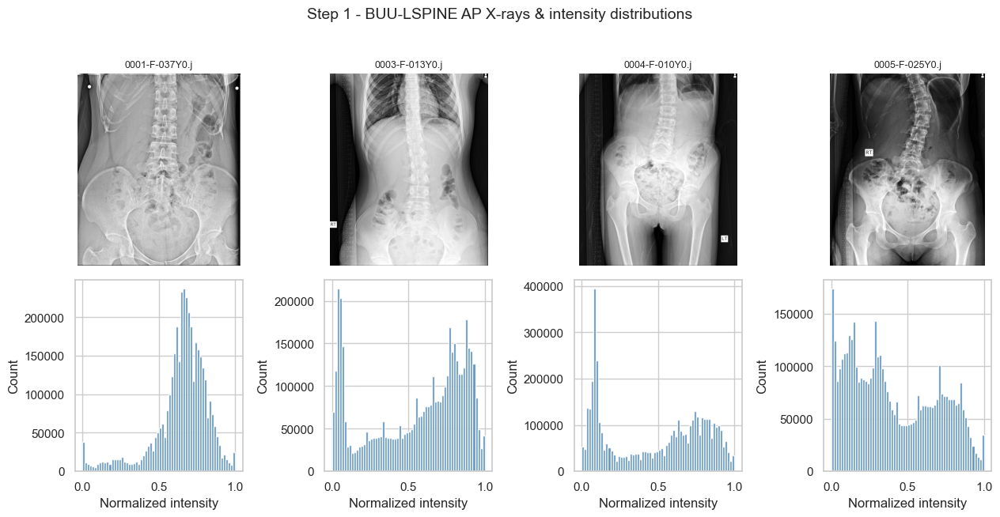

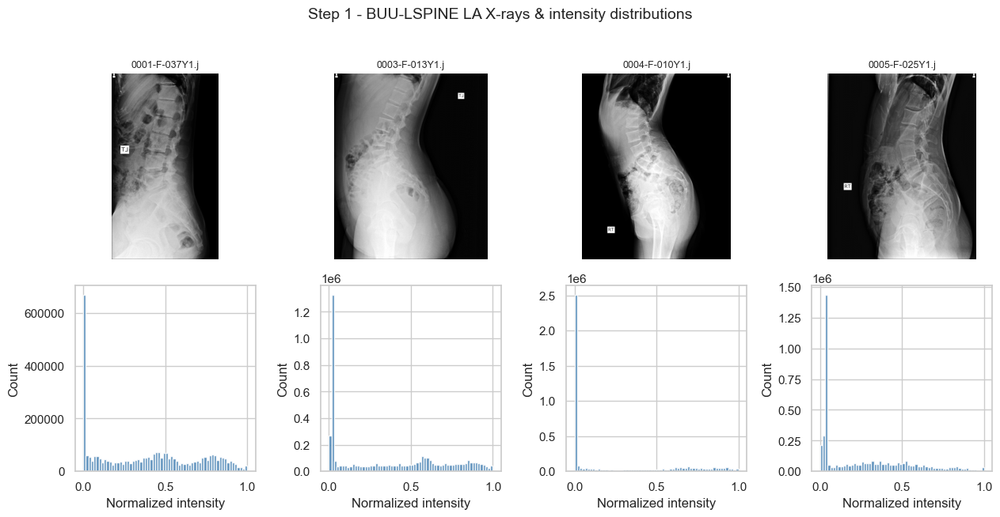

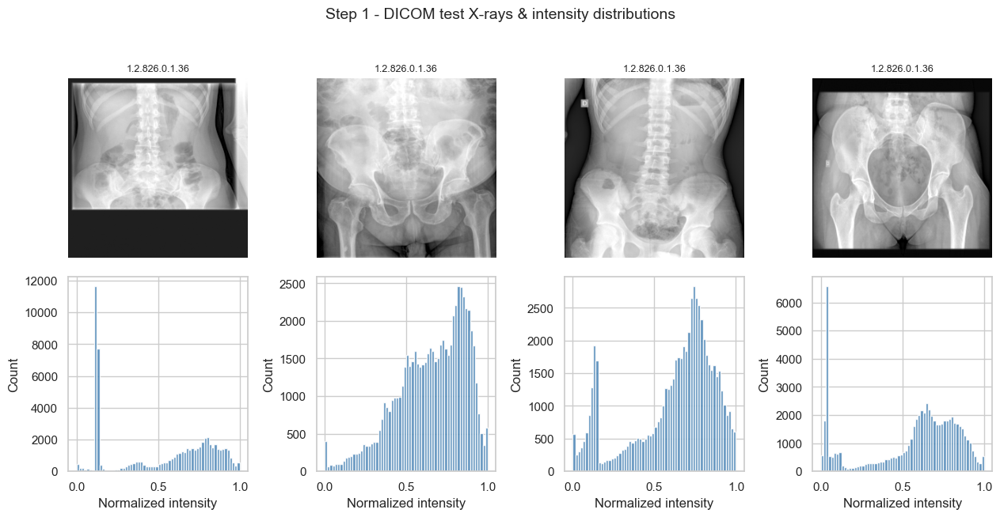

In [4]:
def show_raw_with_histograms(paths, title, savename):
    n = len(paths)
    fig, axes = plt.subplots(2, n, figsize=(3.2 * n, 6.4))
    for k, p in enumerate(paths):
        _, g, _, _ = load_xray(p)
        axes[0, k].imshow(g, cmap="gray"); axes[0, k].set_title(os.path.basename(p)[:14], fontsize=9)
        axes[0, k].axis("off")
        axes[1, k].hist(g.ravel(), bins=64, color="steelblue", alpha=0.85)
        axes[1, k].set_xlabel("Normalized intensity"); axes[1, k].set_ylabel("Count")
    fig.suptitle(title, fontsize=14, y=1.02); plt.tight_layout()
    savefig(fig, savename); plt.show()

# One panel per training view (AP frontal vs LA lateral look very different)
for view in VIEWS:
    if buu_by_view[view]:
        show_raw_with_histograms(buu_by_view[view][:4],
            f"Step 1 - BUU-LSPINE {view} X-rays & intensity distributions",
            f"step1_buu_{view.lower()}.png")
if eval_items:
    show_raw_with_histograms(eval_items[:4],
        "Step 1 - DICOM test X-rays & intensity distributions", "step1_dicom_samples.png")

## Step 2 — Train (or load) the YOLO26-seg model on **BUU-LSPINE-2000 (AP + LA)**

The L4 extractor is a **YOLO26-seg** instance model trained on **BUU-LSPINE-2000** across the views in
`VIEWS` — **AP (frontal)** and **LA (lateral)** by default (2000 + 2000 = 4000 X-rays, 5 vertebra
classes L1..L5). The 4-corner CSV labels are converted to YOLO-seg polygons and trained with a
deterministic train/val split that mixes both views.

- **`RETRAIN=False`** (default): reuse `best.pt` if present.
- **`RETRAIN=True`** *or* missing weights (e.g. first run on a new `VIEWS` set): (re)train from
  `YOLO_BASE` and write to `runs/segment/ap_seg/<YOLO_NAME>/weights/best.pt`.

> **LA label note.** AP CSVs have 10 rows (5 vertebrae × 2 endplate lines). LA CSVs have **11 rows**
> — the extra bottom-most line is an S1/sacrum endplate; the parser keeps the **top 10 rows** = L1..L5.

> The **42 DICOMs are a held-out test set** and never enter training or validation here.

In [5]:
import shutil
from concurrent.futures import ThreadPoolExecutor

# ---- CSV (4-corner quads) -> ordered L1..L5 polygons --------------------------
def _csv_rows(path):
    out = []
    for line in open(path):
        nums = re.findall(r"-?\d+\.?\d*", line)
        if len(nums) >= 4:
            out.append([float(v) for v in nums[:4]])    # xL, yL, xR, yR
    return out

def order_quad(pts):
    '''4 points -> [TL, TR, BR, BL] (clockwise, non-self-intersecting).'''
    pts = sorted(pts, key=lambda p: p[1])
    top = sorted(pts[:2], key=lambda p: p[0])
    bot = sorted(pts[2:], key=lambda p: p[0])
    return [top[0], top[1], bot[1], bot[0]]

def parse_polys(path, n_vert=len(CLASS_NAMES), lines_per=2):
    '''Return n_vert quads ordered L1..L5 (top->bottom), or [] if malformed.
       AP has exactly 10 rows; LA has 11 (extra bottom S1 line) -> we use the top
       n_vert*lines_per rows, which are the L1..L5 endplates in both views.'''
    rows = _csv_rows(path)
    if len(rows) < lines_per * n_vert:
        return []
    rows = rows[:lines_per * n_vert]                     # keep top L1..L5 endplates, drop extras
    verts = []
    for i in range(n_vert):
        pts = []
        for j in range(lines_per):
            xL, yL, xR, yR = rows[i * lines_per + j]
            pts += [(xL, yL), (xR, yR)]
        q = order_quad(pts)
        verts.append((sum(p[1] for p in q) / 4.0, q))
    verts.sort(key=lambda v: v[0])                       # top -> bottom => L1..L5
    return [q for _, q in verts]

def _img_wh(path):
    '''(W, H) from the image header only - no full decode (fast; was cv2.imread ×4000).'''
    from PIL import Image
    with Image.open(path) as im:
        return im.size                                   # (W, H)

def _dataset_ready(root):
    '''True if the YOLO-seg dataset already looks built (data.yaml + non-empty splits).'''
    if not os.path.exists(os.path.join(root, "data.yaml")):
        return False
    ntr = len(glob.glob(os.path.join(root, "images", "train", "*")))
    nva = len(glob.glob(os.path.join(root, "images", "val", "*")))
    return ntr > 0 and nva > 0

def build_yolo_dataset(root=YOLO_DATA_ROOT, views=VIEWS, val_ratio=VAL_RATIO, seed=SEED,
                       force=FORCE_REBUILD_DATA):
    '''Convert BUU-LSPINE labels (all `views`) to one YOLO-seg dataset.
       Skips the rebuild if the dataset already exists (set force=True to rebuild).
       Copies are parallelized and sizes read from headers -> much faster prep.'''
    if not force and _dataset_ready(root):
        ntr = len(glob.glob(os.path.join(root, "images", "train", "*")))
        nva = len(glob.glob(os.path.join(root, "images", "val", "*")))
        print(f"  [skip] reusing existing dataset at {root}  (train={ntr}, val={nva}); "
              f"set FORCE_REBUILD_DATA=True to rebuild.")
        return os.path.join(root, "data.yaml"), ntr, nva

    pairs = []
    for view in views:
        img_dir, lbl_dir = view_dirs(view)
        for lp in sorted(glob.glob(os.path.join(lbl_dir, "*.csv"))):
            stem = os.path.splitext(os.path.basename(lp))[0]
            ip = next((os.path.join(img_dir, stem + e) for e in (".jpg", ".jpeg", ".png")
                       if os.path.exists(os.path.join(img_dir, stem + e))), None)
            if ip and len(parse_polys(lp)) == len(CLASS_NAMES):
                pairs.append((view, ip, lp))
    random.Random(seed).shuffle(pairs)
    n_val = int(len(pairs) * val_ratio)
    split = {"val": pairs[:n_val], "train": pairs[n_val:]}
    for sub in ["images/train", "images/val", "labels/train", "labels/val"]:
        d = os.path.join(root, sub)
        if os.path.exists(d):
            shutil.rmtree(d)
        os.makedirs(d, exist_ok=True)

    def _emit(item):
        sp, view, ip, lp = item
        ext  = os.path.splitext(ip)[1]
        stem = f"{view}_" + os.path.splitext(os.path.basename(ip))[0]      # view prefix -> unique
        W, H = _img_wh(ip)                                                 # header-only size
        shutil.copy(ip, os.path.join(root, "images", sp, stem + ext))
        with open(os.path.join(root, "labels", sp, stem + ".txt"), "w") as f:
            for cid, q in enumerate(parse_polys(lp)):
                coords = " ".join(f"{x / W:.6f} {y / H:.6f}" for x, y in q)
                f.write(f"{cid} {coords}\n")

    tasks = [(sp, view, ip, lp) for sp, plist in split.items() for (view, ip, lp) in plist]
    with ThreadPoolExecutor(max_workers=min(16, (os.cpu_count() or 4) * 2)) as ex:
        list(ex.map(_emit, tasks))                                        # parallel copy + label write

    yaml_path = os.path.join(root, "data.yaml")
    with open(yaml_path, "w") as f:
        f.write(f"path: {os.path.abspath(root)}\ntrain: images/train\nval: images/val\n")
        f.write(f"nc: {len(CLASS_NAMES)}\nnames: {CLASS_NAMES}\n")
    return yaml_path, len(split["train"]), len(split["val"])

# ---- Train (guarded) or reuse existing weights --------------------------------
if RETRAIN or not os.path.exists(YOLO_WEIGHTS):
    import torch
    if torch.cuda.is_available():
        _p = torch.cuda.get_device_properties(0)
        print(f"Device: {_p.name} ({_p.total_memory / 1e9:.1f} GB VRAM)")
    else:
        print("Device: CPU (no CUDA -> training will be slow; a GPU is strongly recommended)")
    print(f"Preparing YOLO-seg dataset from BUU-LSPINE-2000 views={VIEWS} ...")
    data_yaml, n_tr, n_va = build_yolo_dataset()
    print(f"  train={n_tr}  val={n_va}  | test DICOMs held out: {len(test_dcm_files)}")
    print(f"Training {YOLO_BASE} for {EPOCHS} epochs @ imgsz={IMGSZ} "
          f"(batch={BATCH}, cache={CACHE!r}, workers={WORKERS}) ...")
    YOLO(YOLO_BASE).train(data=data_yaml, epochs=EPOCHS, imgsz=IMGSZ,
                          batch=BATCH,        # explicit int (AutoBatch float mis-picked batch=2 here)
                          cache=CACHE,        # decode images once -> no per-epoch re-decode (huge speedup)
                          workers=WORKERS,    # parallel data loading -> GPU no longer starved (was 0)
                          project=YOLO_PROJECT, name=YOLO_NAME, patience=20,
                          seed=SEED, exist_ok=True)
else:
    print(f"Reusing existing weights -> {YOLO_WEIGHTS}  (set RETRAIN=True to retrain).")

print(os.path.exists(YOLO_WEIGHTS), f"Training did not produce weights at {YOLO_WEIGHTS}")
seg = YOLO(YOLO_WEIGHTS)
print("Loaded YOLO26-seg:", YOLO_WEIGHTS)

Reusing existing weights -> c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.pt  (set RETRAIN=True to retrain).
True Training did not produce weights at c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.pt
Loaded YOLO26-seg: c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.pt


### Step 2b — Training & Validation diagnostics (BUU-LSPINE val set)

These are the **in-domain** results on the BUU-LSPINE validation split, recovered from the saved run
directory. With `RETRAIN=False` the training cell only reloads `best.pt`, so Ultralytics never
re-emits its plots — we surface them here (training curves, confusion matrix, PR curve, val-batch
predictions) so the validation result is always visible. Figures copied to `figures/step2b_*`.

Running live seg.val() on the held-out BUU val split (computed now) ...
Ultralytics 8.4.60  Python-3.12.13 torch-2.12.0.dev20260408+cu128 CUDA:0 (NVIDIA GeForce RTX 5060 Laptop GPU, 8151MiB)
YOLO26m-seg summary (fused): 149 layers, 23,511,323 parameters, 0 gradients, 121.2 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 1743.8582.5 MB/s, size: 1023.3 KB)
val: Scanning C:\Users\csm02\Desktop\edward\bmd\src\BMD\model\yolo_ap_la_seg\labels\val.cache... 600 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 600/600  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 38/38 3.0it/s 12.9s0.3s
                   all        600       3000      0.979      0.977      0.992      0.871      0.978      0.977      0.992      0.825
Speed: 0.9ms preprocess, 16.2ms inference, 0.0ms loss, 0.7ms postprocess per image


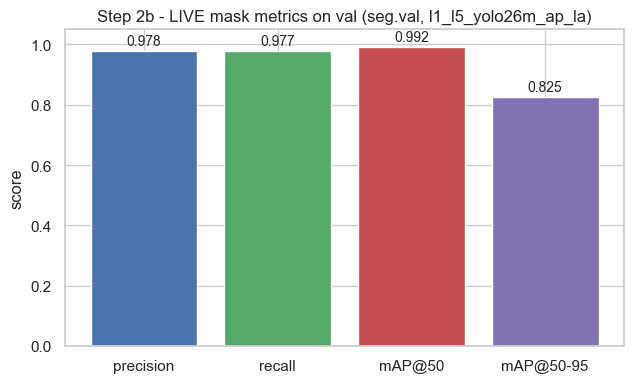

  live mask metrics: {'precision': 0.9783, 'recall': 0.9771, 'mAP@50': 0.9919, 'mAP@50-95': 0.8254}


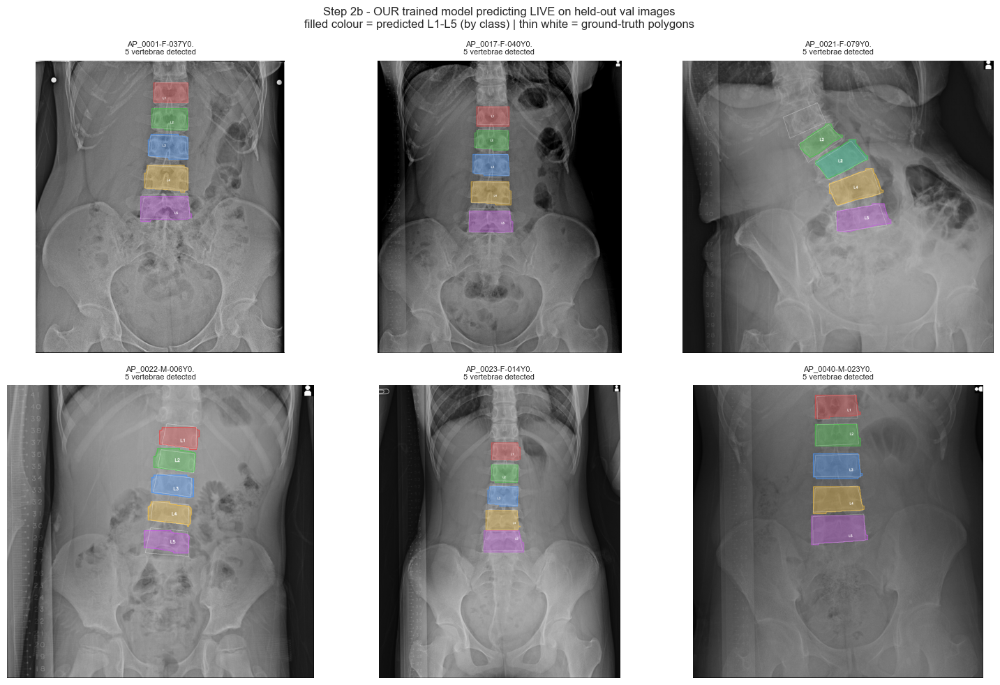

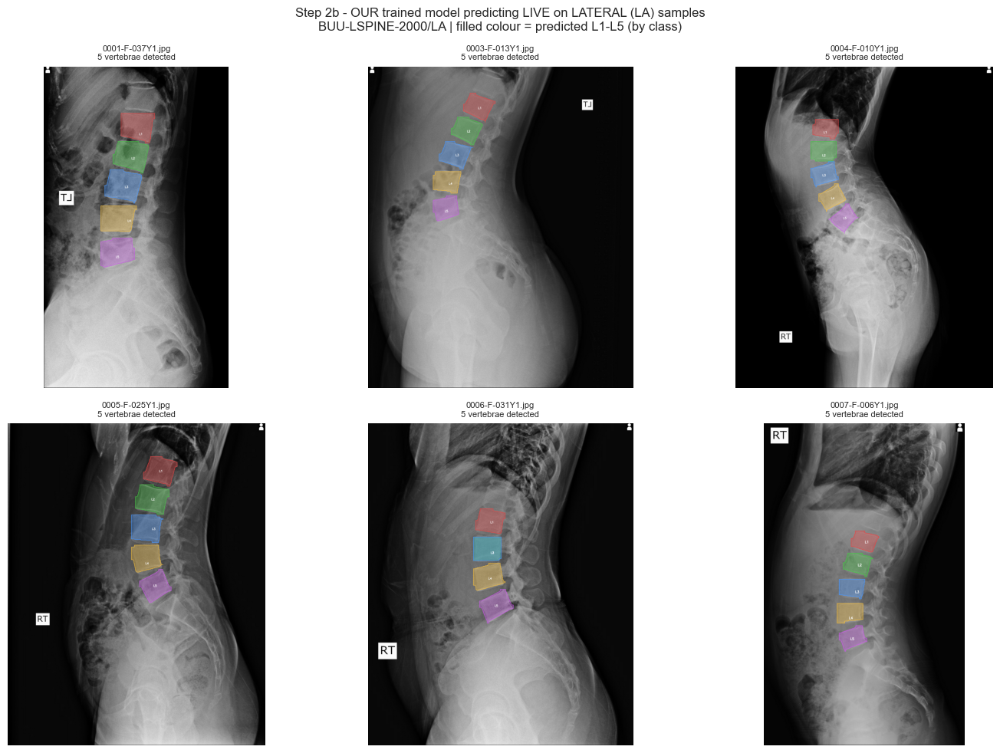

[note] c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\results.csv not found -> learning-curve plot skipped (live metrics above still valid).


In [6]:
# Step 2b rebuilt to be *trustworthy*: instead of only displaying cached PNGs, we (1) compute the
# validation metrics LIVE with seg.val() on the held-out split right now, and (2) run OUR trained
# model LIVE on held-out val images and overlay predictions vs ground-truth. If a results.csv from
# training exists we also parse it and plot the learning curves ourselves.
RUN_DIR   = os.path.join(YOLO_PROJECT, YOLO_NAME)
data_yaml = os.path.join(YOLO_DATA_ROOT, "data.yaml")

# ---- (1) LIVE validation metrics (computed now, not read from a saved image) ----
if os.path.exists(data_yaml):
    print("Running live seg.val() on the held-out BUU val split (computed now) ...")
    vm = seg.val(data=data_yaml, split="val", project=YOLO_PROJECT, name="val_live",
                 exist_ok=True, plots=False, verbose=False)
    live = {"precision": float(vm.seg.mp), "recall": float(vm.seg.mr),
            "mAP@50": float(vm.seg.map50), "mAP@50-95": float(vm.seg.map)}
    fig, ax = plt.subplots(figsize=(6.5, 4))
    bars = ax.bar(list(live), list(live.values()),
                  color=["#4C72B0", "#55A868", "#C44E52", "#8172B3"])
    ax.set_ylim(0, 1.05); ax.set_ylabel("score")
    ax.set_title(f"Step 2b - LIVE mask metrics on val (seg.val, {os.path.basename(YOLO_NAME)})")
    for b, v in zip(bars, live.values()):
        ax.text(b.get_x() + b.get_width()/2, v + 0.02, f"{v:.3f}", ha="center", fontsize=10)
    plt.tight_layout(); savefig(fig, "step2b_live_val_metrics.png"); plt.show()
    print("  live mask metrics:", {k: round(v, 4) for k, v in live.items()})
else:
    print(f"[note] {data_yaml} absent (dataset not rebuilt this session) -> skipping live metrics.")

# ---- (2) LIVE predictions of OUR model on held-out val images vs ground truth ----
val_img_dir = os.path.join(YOLO_DATA_ROOT, "images", "val")
val_lbl_dir = os.path.join(YOLO_DATA_ROOT, "labels", "val")
val_imgs = sorted(glob.glob(os.path.join(val_img_dir, "*")))[:6]
if val_imgs:
    palette = [(230, 70, 70), (70, 200, 70), (70, 150, 255), (245, 190, 60), (200, 90, 230)]
    ncol = 3; nrow = int(np.ceil(len(val_imgs) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow)); axes = np.atleast_1d(axes).ravel()
    for a in axes: a.axis("off")
    for a, ip in zip(axes, val_imgs):
        img = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2RGB); H, W = img.shape[:2]
        r = seg.predict(img, conf=CONF, verbose=False)[0]
        vis = img.copy()
        if r.masks is not None:
            cls = r.boxes.cls.cpu().numpy().astype(int)
            for poly, c in zip(r.masks.xy, cls):
                col = palette[int(c) % len(palette)]
                ov = vis.copy(); cv2.fillPoly(ov, [poly.astype(np.int32)], col)
                vis = cv2.addWeighted(ov, 0.35, vis, 0.65, 0)
                cv2.polylines(vis, [poly.astype(np.int32)], True, col, 2)
                cx, cy = poly.mean(0).astype(int)
                cv2.putText(vis, CLASS_NAMES[int(c)], (cx-14, cy+5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        lp = os.path.join(val_lbl_dir, os.path.splitext(os.path.basename(ip))[0] + ".txt")
        if os.path.exists(lp):
            for line in open(lp):
                v = line.split()
                if len(v) >= 7:
                    pts = (np.array(v[1:], float).reshape(-1, 2) * [W, H]).astype(np.int32)
                    cv2.polylines(vis, [pts], True, (255, 255, 255), 1)
        a.imshow(vis); a.set_title(f"{os.path.basename(ip)[:16]}\n{len(r.boxes)} vertebrae detected", fontsize=8)
    fig.suptitle("Step 2b - OUR trained model predicting LIVE on held-out val images\n"
                 "filled colour = predicted L1-L5 (by class) | thin white = ground-truth polygons",
                 fontsize=12)
    plt.tight_layout(); savefig(fig, "step2b_live_val_predictions.png"); plt.show()
else:
    print(f"[note] no val images in {val_img_dir} (dataset not rebuilt this session).")

# ---- (2-LA) LIVE predictions on 6 LATERAL (LA) samples from BUU-LSPINE-2000/LA ----
la_imgs = buu_by_view.get("LA", [])[:6]
if not la_imgs:                                    # fallback: glob the LA images folder directly
    la_dir = view_dirs("LA")[0]
    la_imgs = [p for p in sorted(glob.glob(os.path.join(la_dir, "*")))
               if os.path.splitext(p)[1].lower() in (".jpg", ".jpeg", ".png")][:6]
if la_imgs:
    palette = [(230, 70, 70), (70, 200, 70), (70, 150, 255), (245, 190, 60), (200, 90, 230)]
    ncol = 3; nrow = int(np.ceil(len(la_imgs) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(5*ncol, 5*nrow)); axes = np.atleast_1d(axes).ravel()
    for a in axes: a.axis("off")
    for a, ip in zip(axes, la_imgs):
        img = cv2.cvtColor(cv2.imread(ip), cv2.COLOR_BGR2RGB); H, W = img.shape[:2]
        r = seg.predict(img, conf=CONF, verbose=False)[0]
        vis = img.copy()
        if r.masks is not None:
            cls = r.boxes.cls.cpu().numpy().astype(int)
            for poly, c in zip(r.masks.xy, cls):
                col = palette[int(c) % len(palette)]
                ov = vis.copy(); cv2.fillPoly(ov, [poly.astype(np.int32)], col)
                vis = cv2.addWeighted(ov, 0.35, vis, 0.65, 0)
                cv2.polylines(vis, [poly.astype(np.int32)], True, col, 2)
                cx, cy = poly.mean(0).astype(int)
                cv2.putText(vis, CLASS_NAMES[int(c)], (cx-14, cy+5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        a.imshow(vis); a.set_title(f"{os.path.basename(ip)[:16]}\n{len(r.boxes)} vertebrae detected", fontsize=8)
    fig.suptitle("Step 2b - OUR trained model predicting LIVE on LATERAL (LA) samples\n"
                 "BUU-LSPINE-2000/LA | filled colour = predicted L1-L5 (by class)", fontsize=12)
    plt.tight_layout(); savefig(fig, "step2b_live_la_predictions.png"); plt.show()
else:
    print("[note] no LA images found under BUU-LSPINE-2000/LA -> lateral panel skipped.")

# ---- (3) If a training results.csv exists, plot the learning curves ourselves ----
rc_path = os.path.join(RUN_DIR, "results.csv")
if os.path.exists(rc_path):
    rdf = pd.read_csv(rc_path); rdf.columns = [c.strip() for c in rdf.columns]
    ep = rdf["epoch"]
    fig, ax = plt.subplots(1, 3, figsize=(18, 4.6))
    for col, lab in [("train/seg_loss", "train seg"), ("val/seg_loss", "val seg"),
                     ("train/box_loss", "train box"), ("val/box_loss", "val box")]:
        if col in rdf: ax[0].plot(ep, rdf[col], label=lab)
    ax[0].set_title("Losses"); ax[0].set_xlabel("epoch"); ax[0].legend(); ax[0].grid(alpha=.3)
    for col, lab in [("metrics/mAP50(M)", "mask mAP@50"), ("metrics/mAP50-95(M)", "mask mAP@50-95")]:
        if col in rdf: ax[1].plot(ep, rdf[col], marker=".", label=lab)
    ax[1].set_title("Mask mAP"); ax[1].set_xlabel("epoch"); ax[1].set_ylim(0, 1); ax[1].legend(); ax[1].grid(alpha=.3)
    for col, lab in [("metrics/precision(M)", "precision"), ("metrics/recall(M)", "recall")]:
        if col in rdf: ax[2].plot(ep, rdf[col], marker=".", label=lab)
    ax[2].set_title("Mask precision / recall"); ax[2].set_xlabel("epoch"); ax[2].set_ylim(0, 1)
    ax[2].legend(); ax[2].grid(alpha=.3)
    fig.suptitle(f"Step 2b - training curves parsed from results.csv ({len(rdf)} epochs)", fontsize=13)
    plt.tight_layout(); savefig(fig, "step2b_training_curves.png"); plt.show()
else:
    print(f"[note] {rc_path} not found -> learning-curve plot skipped (live metrics above still valid).")

### L4 extraction & visualization

The trained model detects L1–L5 as instances. The L4 mask is chosen by **class** when available, else
by the **4th-from-top** rule (vertebrae ordered by vertical centroid). A single `yolo_l4()` helper
returns the selected L4 mask, the status, **all** instance masks, and the raw result — every later
step reuses it (no duplicated inference helpers).

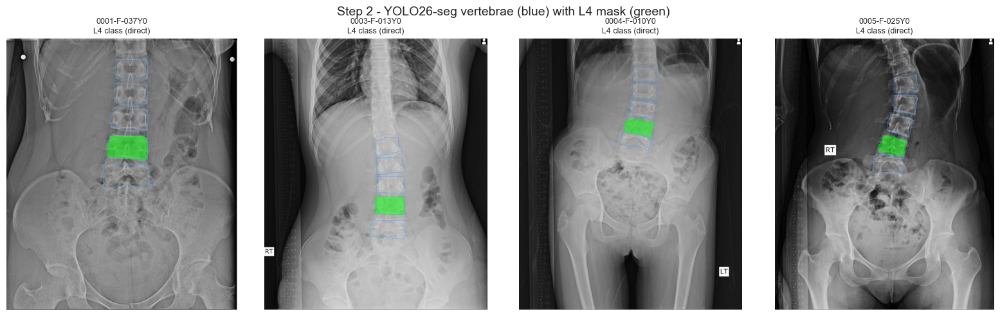

In [7]:
def poly_to_mask(poly_xy, H, W, shrink=1.0):
    poly = np.asarray(poly_xy, np.float32)
    if shrink != 1.0 and len(poly):
        ctr = poly.mean(0); poly = ctr + shrink * (poly - ctr)
    m = np.zeros((H, W), np.uint8)
    if len(poly):
        cv2.fillPoly(m, [poly.astype(np.int32)], 1)
    return m

def pick_l4_index(boxes_xyxy, classes, confs):
    '''Choose the L4 instance: direct class, else 4th vertebra from the top (fallback).'''
    if len(boxes_xyxy) == 0:
        return None, "no detection"
    idx = [i for i, c in enumerate(classes) if c == L4_IDX]
    if idx:
        return max(idx, key=lambda i: confs[i]), "L4 class (direct)"
    order = sorted(range(len(boxes_xyxy)), key=lambda i: (boxes_xyxy[i][1] + boxes_xyxy[i][3]) / 2)
    if len(order) >= 4:
        return order[3], "4th-from-top (fallback)"
    return None, f"only {len(boxes_xyxy)} vertebrae"

def yolo_l4(rgb, conf=CONF, shrink=1.0):
    '''Run YOLO once. Return (l4_mask|None, status, all_instance_masks, result).'''
    r = seg.predict(rgb, conf=conf, verbose=False)[0]
    H, W = rgb.shape[:2]
    if r.masks is None or len(r.boxes) == 0:
        return None, "no detection", [], r
    boxes   = r.boxes.xyxy.cpu().numpy()
    classes = r.boxes.cls.cpu().numpy().astype(int)
    confs   = r.boxes.conf.cpu().numpy()
    inst = [poly_to_mask(r.masks.xy[i], H, W, shrink) for i in range(len(r.masks.xy))]
    i, status = pick_l4_index(boxes, classes, confs)
    return (inst[i] if i is not None else None), status, inst, r

# ---- Visualization: YOLO segmentation with L4 highlighted ----
fig, axes = plt.subplots(1, 4, figsize=(16, 5))
for k, p in enumerate(buu_imgs[:4]):
    rgb, _, H, W = load_xray(p)
    m, status, inst, r = yolo_l4(rgb)
    vis = rgb.copy()
    if r.masks is not None:
        for poly in r.masks.xy:
            cv2.polylines(vis, [poly.astype(np.int32)], True, (80, 160, 255), 2)
    if m is not None:
        vis[m > 0] = (0.5 * vis[m > 0] + 0.5 * np.array([0, 255, 0])).astype(np.uint8)
    axes[k].imshow(vis); axes[k].set_title(f"{os.path.basename(p)[:12]}\n{status}", fontsize=9)
    axes[k].axis("off")
fig.suptitle("Step 2 - YOLO26-seg vertebrae (blue) with L4 mask (green)", fontsize=14)
plt.tight_layout(); savefig(fig, "step2_l4_extraction.png"); plt.show()

## Step 3 — The Measurement Core

Five short cells, in the order a clinician would ask about them:

| cell | question it answers |
|---|---|
| **3a** | *Where exactly do you measure?* — trabecular ROI, soft-tissue reference, air reference |
| **3b** | *What number do you report?* — the attenuation domain and **BAR**, plus microarchitecture |
| **3c** | *How do I run it, and can I trust this one?* — `measure_l4()` and the **QC gate** |
| **3d** | *What does the number mean?* — cohort reference, z-score, **BHI**, category, plain English |
| **3e** | *Is a change between visits real?* — precision and **Least Significant Change** |


In [8]:
# ===== Step 3a — WHERE we measure: trabecular ROI, soft-tissue reference, air reference =====

def shrink_mask(mask, shrink=ROI_SHRINK):
    """Scale the mask toward its centroid (kept as a robust fallback for trabecular_roi)."""
    if shrink >= 1.0:
        return mask
    ys, xs = np.where(mask > 0)
    if len(xs) == 0:
        return mask
    cx, cy = xs.mean(), ys.mean()
    out = np.zeros_like(mask)
    nx = np.clip((cx + shrink * (xs - cx)).astype(int), 0, mask.shape[1] - 1)
    ny = np.clip((cy + shrink * (ys - cy)).astype(int), 0, mask.shape[0] - 1)
    out[ny, nx] = 1
    return cv2.morphologyEx(out, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8))

def trabecular_roi(mask, erode_frac=ERODE_FRAC, endplate_frac=ENDPLATE_FRAC):
    """Central *trabecular* ROI: (1) erode away the dense cortical rim, then (2) drop the
       superior & inferior endplate bands (the brightest, most-contaminated rows). What
       remains is cancellous bone: no cortex, no endplate, no projection edge.
       Falls back to shrink_mask if the erosion is degenerate."""
    m = (mask > 0).astype(np.uint8)
    ys, xs = np.where(m)
    if len(xs) == 0:
        return mask
    y0, y1 = ys.min(), ys.max(); h = y1 - y0 + 1
    k = max(3, int(round(erode_frac * h)))
    er = cv2.erode(m, np.ones((k, k), np.uint8))
    cut = int(round(endplate_frac * h))                  # strip top & bottom endplate bands
    er[:y0 + cut] = 0
    er[y1 - cut + 1:] = 0
    if er.sum() < 10:                                    # too aggressive -> safe fallback
        return shrink_mask(mask)
    return er

# ---------------------------------------------------------------------------
# v16: the attenuation domain. A radiograph pixel is not a density -- the map from pixel to
# attenuation depends on the detector response (Section 1.1).
#   "log"    : the stored value is already affine in mu*t  ->  A = I
#   "linear" : the stored value tracks transmitted intensity; with bone bright, transmission
#              is (1 - I), so Beer-Lambert gives A = -ln(1 - I).
# Both are monotone increasing in attenuation, so bright still means dense.
# ---------------------------------------------------------------------------
def to_attenuation(gray, response=None):
    """Map a robustly-windowed [0,1] bright-bone image into an attenuation-proportional domain."""
    response = response or DEFAULT_RESPONSE
    if response == "log":
        return np.asarray(gray, np.float32)
    if response == "linear":
        g = np.clip(np.asarray(gray, np.float32), 0.0, 1.0 - 1e-4)
        return (-np.log1p(-g)).astype(np.float32)        # -ln(1 - g), numerically stable
    raise ValueError(f"unknown detector response {response!r} (expected 'log' or 'linear')")

def air_reference(gray):
    """Direct-exposure (unattenuated) background level, in *gray* units.

       Otsu splits body from background; we take the 25th percentile of the background so
       collimation borders and scattered soft tissue cannot pull the estimate up. Falls back
       to the 1st percentile when the field is tightly collimated (almost no visible air)."""
    u8 = (np.clip(gray, 0, 1) * 255).astype(np.uint8)
    thr, _ = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    bg = gray[u8 < thr]
    if bg.size < 0.005 * gray.size:
        return float(np.percentile(gray, 1))
    return float(np.percentile(bg, 25))

SOFT_TISSUE_PCT = 25   # lower-quantile anchor for the soft-tissue reference (see below)

def soft_tissue_ref(img_norm, full_mask, exclude=None):
    """Median intensity of the paraspinal soft tissue just lateral to the vertebra -- the
       patient's own internal reference for BAR's denominator.

       Sampled left & right at mid-height (away from endplates); v17.1 keeps only the
       LOWER-median side so a lateral view cannot sample the posterior elements.
       v16 hardening:
         * every OTHER detected vertebra is removed via `exclude` (no adjacent bone leaks in),
         * the band is trimmed to its 20-80% core, so collimation air (dark) and residual
           bone / bowel gas (bright) cannot drag the median.
       Returns None when no usable band exists (-> BAR is reported as None, and QC fails)."""
    ys, xs = np.where(full_mask > 0)
    if len(xs) == 0:
        return None
    y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    Hh, Ww = img_norm.shape[:2]
    h, w = y1 - y0 + 1, x1 - x0 + 1
    ym0, ym1 = y0 + h // 4, y1 - h // 4
    gap = max(3, int(0.15 * w)); wid = max(5, int(0.5 * w))
    band = np.zeros((Hh, Ww), bool)
    band[ym0:ym1, max(0, x0 - gap - wid):max(0, x0 - gap)] = True
    band[ym0:ym1, min(Ww, x1 + gap):min(Ww, x1 + gap + wid)] = True
    band &= (full_mask == 0)
    if exclude is not None:
        band &= (exclude == 0)

    v = img_norm[band]
    if v.size < 50:
        return None

    # ---- v17.2: lower-quantile estimator (replaces the band-median heuristics) ----
    # Whatever contaminates this band -- posterior elements on a lateral view, ribs,
    # ilium, transverse processes -- can only ADD attenuation. There is no
    # contamination that subtracts. The bias is therefore strictly one-sided, and a
    # MEDIAN is the wrong statistic: it assumes contamination stays below 50%, which
    # lateral projections violate. Measured consequence: A_soft came out ABOVE
    # A_trabecular on 2 of 25 lateral studies, i.e. bone appearing to attenuate less
    # than the soft tissue around it -- physically impossible, and it surfaced as a
    # negative BMD in the viewer.
    #
    # Under one-sided contamination the robust estimator of the clean population is a
    # LOW-ORDER statistic, so we take the SOFT_TISSUE_PCT-th percentile of the band.
    # This assumes nothing about view, patient orientation, or band geometry.
    return float(np.percentile(v, SOFT_TISSUE_PCT))

def soft_tissue_bands(full_mask, shape):
    """The two rectangles soft_tissue_ref() samples -- returned so the report card can draw them."""
    ys, xs = np.where(full_mask > 0)
    if len(xs) == 0:
        return []
    y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    Hh, Ww = shape[:2]
    h, w = y1 - y0 + 1, x1 - x0 + 1
    ym0, ym1 = y0 + h // 4, y1 - h // 4
    gap = max(3, int(0.15 * w)); wid = max(5, int(0.5 * w))
    return [(max(0, x0 - gap - wid), ym0, max(0, x0 - gap), ym1),
            (min(Ww, x1 + gap), ym0, min(Ww, x1 + gap + wid), ym1)]

print("Step 3a ready: trabecular_roi / to_attenuation / air_reference / soft_tissue_ref")


Step 3a ready: trabecular_roi / to_attenuation / air_reference / soft_tissue_ref


### Step 3a-viz — Is `air_reference()` actually looking at air?

`A_air` is the **denominator anchor** of BAR, so a wrong air estimate rescales every reported value.
It is picked by an Otsu split (background = below threshold, then its 25th percentile), but nothing
so far showed *which pixels* that actually selects. A measured air level that drifts by 10x across a
cohort is a red flag, so this cell makes the decision auditable:

1. the **background mask** Otsu produced (red = counted as air),
2. the **histogram** with the Otsu threshold and the resulting `A_air` marked,
3. a printed table with the background fraction and whether the **fallback**
   (`< 0.5%` background → 1st percentile of the whole image) was taken.

**What to look for:** the red region should be the collimation border / open field only. If it eats
into the patient, `A_air` is too high and BAR is compressed; if almost nothing is red, the fallback
fired and `A_air` is not really an air measurement at all.

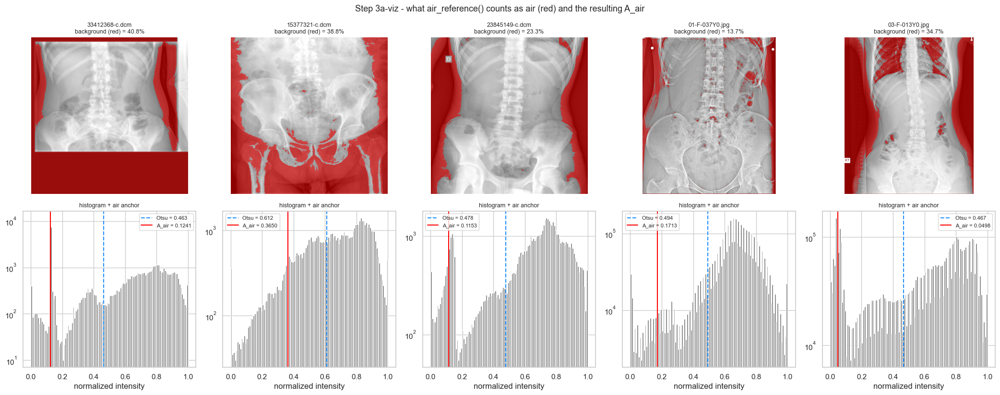

,file,bg_frac,otsu,air,fallback
0,6133412368-c.dcm,0.4080,0.4627,0.1241,False
1,5615377321-c.dcm,0.3884,0.6118,0.3650,False
2,7223845149-c.dcm,0.2328,0.4784,0.1153,False
3,0001-F-037Y0.jpg,0.1374,0.4941,0.1713,False
4,0003-F-013Y0.jpg,0.3470,0.4667,0.0498,False


A_air spread across these studies: 0.3152  (BAR's denominator is A_soft - A_air, so this directly rescales BAR)


In [9]:
# ===== Step 3a-viz - audit the Otsu background split used by air_reference() =====
_viz = (eval_items[:3] if eval_items else []) + buu_imgs[:2]
_rows = []
fig, axes = plt.subplots(2, len(_viz), figsize=(4.2 * len(_viz), 8.4))
axes = np.atleast_2d(axes)
for k, p in enumerate(_viz):
    _, gray, H, W = load_xray(p)
    gray = np.squeeze(gray)          # defensive: keep the mask strictly 2-D
    u8 = (np.clip(gray, 0, 1) * 255).astype(np.uint8)
    thr, _ = cv2.threshold(u8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    bg = u8 < thr                                   # exactly what air_reference() uses
    frac = float(bg.mean())
    fallback = bg.sum() < 0.005 * gray.size         # the guard inside air_reference()
    air = air_reference(gray)                       # the value that ends up in BAR's denominator

    rgb = cv2.cvtColor(u8, cv2.COLOR_GRAY2RGB)
    rgb[bg] = (0.45 * rgb[bg] + 0.55 * np.array([255, 0, 0])).astype(np.uint8)
    axes[0, k].imshow(rgb); axes[0, k].axis("off")
    axes[0, k].set_title(f"{os.path.basename(p)[-14:]}\nbackground (red) = {frac*100:.1f}%"
                         + ("  [FALLBACK]" if fallback else ""), fontsize=9)

    axes[1, k].hist(gray.ravel(), bins=120, color="#777777"); axes[1, k].set_yscale("log")
    axes[1, k].axvline(thr / 255.0, color="dodgerblue", ls="--", label=f"Otsu = {thr/255:.3f}")
    axes[1, k].axvline(air, color="red", ls="-", label=f"A_air = {air:.4f}")
    axes[1, k].set_xlabel("normalized intensity"); axes[1, k].legend(fontsize=8)
    axes[1, k].set_title("histogram + air anchor", fontsize=9)
    _rows.append({"file": os.path.basename(p)[-16:], "bg_frac": round(frac, 4),
                  "otsu": round(thr / 255.0, 4), "air": round(air, 4), "fallback": fallback})

fig.suptitle("Step 3a-viz - what air_reference() counts as air (red) and the resulting A_air",
             fontsize=13)
plt.tight_layout(); savefig(fig, "step3a_air_reference_audit.png"); plt.show()

_df = pd.DataFrame(_rows)
display(_df)
if _df["fallback"].any():
    print("[warn] fallback fired: <0.5% of the image was classified as background, so A_air is the "
          "1st percentile of the WHOLE image - not a true air measurement.")
_spread = _df["air"].max() - _df["air"].min()
print(f"A_air spread across these studies: {_spread:.4f}  "
      f"(BAR's denominator is A_soft - A_air, so this directly rescales BAR)")


In [10]:
# ===== Step 3b — WHAT we report: BAR (density) + microarchitecture =====

def _trimmed_mean(v, lo=10, hi=90):
    """Mean of the central 80% -- immune to residual endplate, vessel shadow and hot pixels."""
    if v.size == 0:
        return None
    p_lo, p_hi = np.percentile(v, [lo, hi])
    core = v[(v >= p_lo) & (v <= p_hi)]
    return float(core.mean()) if core.size else float(v.mean())

def compute_bmd(img_norm, roi_mask, full_mask=None, response=None, air=None, exclude=None):
    """Density indices on the trabecular ROI.

       PRIMARY (v16)
         bar          : Bone Attenuation Ratio = (A_trab - A_soft) / (A_soft - A_air).
                        Dimensionless, read as 'L4 trabecular bone adds BAR times as much
                        attenuation as the surrounding soft tissue'. Invariant under any
                        affine map A -> a*A + b, i.e. under exposure / gain / window-level.

       LEGACY (kept so v13-v15 CSVs, figures and the web viewer keep working)
         bmd_trimmed  : 10-90% trimmed mean of the raw normalized intensity
         bmd_rel      : bmd_trimmed / soft_tissue_ref   (a *ratio*; superseded by bar)
    """
    response = response or DEFAULT_RESPONSE
    vals = img_norm[roi_mask > 0]
    if vals.size == 0:
        return None
    p10, p90 = np.percentile(vals, 10), np.percentile(vals, 90)
    trimmed = _trimmed_mean(vals)
    out = {"area_px": int(vals.size), "bmd_mean": float(vals.mean()),
           "bmd_trimmed": trimmed, "bmd_median": float(np.median(vals)),
           "bmd_std": float(vals.std()), "bmd_p10": float(p10), "bmd_p90": float(p90),
           "sat_frac": float(((vals >= 0.999) | (vals <= 0.001)).mean()),
           "response": response}
    if full_mask is None:
        return out

    ref = soft_tissue_ref(img_norm, full_mask, exclude=exclude)
    out["soft_tissue_ref"] = ref
    out["bmd_rel"] = float(trimmed / (ref + 1e-6)) if ref else None     # legacy

    # ---- attenuation domain -> BAR ----
    air_gray = air_reference(img_norm) if air is None else float(air)
    out["air_ref"] = air_gray
    if ref is None:
        out["bar"] = None
        return out
    A = to_attenuation(img_norm, response)
    a_trab = _trimmed_mean(A[roi_mask > 0])
    # to_attenuation is strictly monotone, so it commutes with the median/percentile:
    # A_soft = to_attenuation(median gray) exactly. (It does NOT commute with a mean.)
    a_soft = float(to_attenuation(np.array([[ref]], np.float32), response)[0, 0])
    a_air  = float(to_attenuation(np.array([[air_gray]], np.float32), response)[0, 0])
    out["att_trabecular"], out["att_soft"], out["att_air"] = a_trab, a_soft, a_air
    margin = a_soft - a_air
    out["soft_air_margin"] = float(margin)
    out["bar"] = float((a_trab - a_soft) / margin) if margin > QC_MIN_SOFT_MARGIN else None
    return out

# --------------------------- microarchitecture ---------------------------
def compute_glcm(img_norm, mask, levels=GLCM_LEVELS):
    """Rotation-averaged GLCM descriptors + entropy (v16)."""
    ys, xs = np.where(mask > 0)
    if len(xs) == 0:
        return None
    y0, y1, x0, x1 = ys.min(), ys.max() + 1, xs.min(), xs.max() + 1
    roi  = (img_norm[y0:y1, x0:x1] * (levels - 1)).astype(np.uint8)
    mroi = mask[y0:y1, x0:x1]
    roi[mroi == 0] = 0
    glcm = graycomatrix(roi, distances=[1], angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=levels, symmetric=True, normed=True)
    p = glcm.astype(np.float64)
    p = p / (p.sum(axis=(0, 1), keepdims=True) + 1e-12)
    entropy = float((-(p * np.log2(p + 1e-12)).sum(axis=(0, 1))).mean())
    return {"glcm_contrast": float(graycoprops(glcm, "contrast").mean()),
            "glcm_correlation": float(graycoprops(glcm, "correlation").mean()),
            "glcm_energy": float(graycoprops(glcm, "energy").mean()),
            "glcm_homogeneity": float(graycoprops(glcm, "homogeneity").mean()),
            "glcm_entropy": entropy}

def vario_slope(img_norm, mask, max_lag=VARIO_MAX_LAG):
    """TBS-like texture index: slope of log(variogram) vs log(lag), Pothuaud-style.

       gamma(k) = E[(I(x+k) - I(x))^2] over lags k = 1..max_lag (rows and columns, ROI-masked).
       Fine, densely packed trabeculae decorrelate within a pixel or two -> gamma saturates
       immediately -> SMALL slope. Coarse, sparse trabeculae -> gamma keeps growing -> LARGE slope.
       We do NOT hard-code which direction is 'healthy'; fit_reference() learns the sign from
       the cohort (see Step 3d)."""
    ys, xs = np.where(mask > 0)
    if len(xs) < 50:
        return None
    y0, y1, x0, x1 = ys.min(), ys.max() + 1, xs.min(), xs.max() + 1
    p  = img_norm[y0:y1, x0:x1].astype(np.float64)
    mk = mask[y0:y1, x0:x1] > 0
    lags, gam = [], []
    for k in range(1, max_lag + 1):
        d = []
        m = mk[:, k:] & mk[:, :-k]
        if m.any():
            d.append(((p[:, k:] - p[:, :-k])[m]) ** 2)
        m = mk[k:, :] & mk[:-k, :]
        if m.any():
            d.append(((p[k:, :] - p[:-k, :])[m]) ** 2)
        if not d:
            continue
        v = float(np.concatenate(d).mean())
        if v > 0:
            lags.append(k); gam.append(v)
    if len(lags) < 3:
        return None
    s, _ = np.polyfit(np.log(lags), np.log(gam), 1)
    return float(s)

def fractal_dim(img_norm, mask, block=FRACTAL_BLOCK):
    """Box-counting fractal dimension D of the trabecular network.

       The ROI is binarized with a local adaptive threshold (so it survives the slow
       background gradient of a projection image), then N(eps) boxes of side eps that contain
       any trabecula are counted: N(eps) ~ eps^-D. D in (1, 2); a richly connected network
       fills the plane more completely and scores higher."""
    ys, xs = np.where(mask > 0)
    if len(xs) < 100:
        return None
    y0, y1, x0, x1 = ys.min(), ys.max() + 1, xs.min(), xs.max() + 1
    p  = img_norm[y0:y1, x0:x1]
    mk = mask[y0:y1, x0:x1] > 0
    u8 = (np.clip(p, 0, 1) * 255).astype(np.uint8)
    b = min(block, min(u8.shape) - 1)
    b = b if b % 2 == 1 else b - 1
    if b < 3:
        return None
    bw = cv2.adaptiveThreshold(u8, 1, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, b, -2)
    bw = (bw > 0) & mk
    n = min(bw.shape)
    if n < 16 or not bw.any():
        return None
    sizes, counts, s = [], [], 2
    while s <= n // 2:
        Hs, Ws = bw.shape[0] // s * s, bw.shape[1] // s * s
        blk = bw[:Hs, :Ws].reshape(Hs // s, s, Ws // s, s).any(axis=(1, 3))
        c = int(blk.sum())
        if c > 0:
            sizes.append(s); counts.append(c)
        s *= 2
    if len(sizes) < 3:
        return None
    slope, _ = np.polyfit(np.log(1.0 / np.array(sizes, float)), np.log(counts), 1)
    return float(slope)

def compute_texture(img_norm, roi_mask):
    """All microarchitecture descriptors for one trabecular ROI."""
    out = {}
    g = compute_glcm(img_norm, roi_mask)
    if g:
        out.update(g)
    out["vario_slope"] = vario_slope(img_norm, roi_mask)
    out["fractal_dim"] = fractal_dim(img_norm, roi_mask)
    return out



# --------------------------- per-pixel BAR map (v17) ---------------------------
def bar_map(img_norm, full_mask, response=None, air=None, exclude=None):
    """Per-pixel Bone Attenuation Ratio: (A(x,y) - A_soft) / (A_soft - A_air).

       This is the *pixel-wise* form of the scalar BAR reported by compute_bmd(): a value of 0
       means 'indistinguishable from the surrounding paraspinal soft tissue', 1 means 'one
       soft-tissue-contrast unit above background'.

       Because the map is an AFFINE function of A for fixed references, and percentile trimming
       is order-preserving, the 10-90% trimmed mean of this map over the trabecular ROI equals
       the scalar `bar` exactly -- so the heatmap is a faithful decomposition of the number.

       Returns (bar_map[H,W] float32 or None, a_soft, a_air). None when the soft-tissue
       reference is unusable or the soft-air margin fails QC (same rule as compute_bmd)."""
    response = response or DEFAULT_RESPONSE
    ref = soft_tissue_ref(img_norm, full_mask, exclude=exclude)
    if ref is None:
        return None, None, None
    air_gray = air_reference(img_norm) if air is None else float(air)
    A = to_attenuation(img_norm, response)
    a_soft = float(to_attenuation(np.array([[ref]], np.float32), response)[0, 0])
    a_air = float(to_attenuation(np.array([[air_gray]], np.float32), response)[0, 0])
    margin = a_soft - a_air
    if margin <= QC_MIN_SOFT_MARGIN:
        return None, a_soft, a_air
    return ((A - a_soft) / margin).astype(np.float32), a_soft, a_air


def bar_style(vals):
    """Colour scale for a BAR heatmap, always anchored at 0 = soft-tissue level.

       Returns (norm, cmap). Two regimes, because trabecular bone is usually denser than
       the surrounding soft tissue, so the ROI is often entirely positive:

         * ROI straddles 0  -> DIVERGING ('RdBu_r') with TwoSlopeNorm centred on 0, so
                               'denser than background' and 'less dense' are visually opposite.
         * ROI all positive -> SEQUENTIAL ('inferno') starting at vmin=0. A diverging map
                               would be misleading here: its white midpoint would sit at an
                               arbitrary value, not at the 0 = soft-tissue reference.
    """
    from matplotlib.colors import TwoSlopeNorm, Normalize
    v = np.asarray(vals, np.float32)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return None, "inferno"
    lo, hi = float(np.percentile(v, 1)), float(np.percentile(v, 99))
    if hi <= lo:
        hi = lo + 1e-6
    if lo < 0 < hi:
        return TwoSlopeNorm(vmin=lo, vcenter=0.0, vmax=hi), "RdBu_r"
    return Normalize(vmin=min(0.0, lo), vmax=hi), "inferno"

print("Step 3b ready: compute_bmd (BAR) / bar_map + bar_style (v17) / compute_glcm / vario_slope / fractal_dim")


Step 3b ready: compute_bmd (BAR) / bar_map + bar_style (v17) / compute_glcm / vario_slope / fractal_dim


In [11]:
# ===== Step 3c — HOW to run it: one entry point + the quality-control gate =====

def seg_scores(pred, gt, eps=1e-6):
    pred = pred.astype(bool); gt = gt.astype(bool)
    tp = np.logical_and(pred, gt).sum()
    fp = np.logical_and(pred, ~gt).sum()
    fn = np.logical_and(~pred, gt).sum()
    dice = 2*tp / (2*tp + fp + fn + eps)
    iou  = tp / (tp + fp + fn + eps)
    prec = tp / (tp + fp + eps)
    rec  = tp / (tp + fn + eps)
    return dice, iou, prec, rec, int(tp), int(fp), int(fn)

def best_overlap(inst, gt):
    """Among ALL detected vertebra instances, the one with the highest Dice vs GT."""
    if not inst:
        return np.zeros_like(gt), 0.0
    d, m = max(((seg_scores(m, gt)[0], m) for m in inst), key=lambda t: t[0])
    return m, d

def load_test_gt_l4(dcm_path, H, W):
    """Binary L4 ground-truth mask (PNG) resized to (H, W)."""
    stem = os.path.splitext(os.path.basename(dcm_path))[0]
    p = os.path.join(TEST_MASK_DIR, stem + ".png")
    if not os.path.exists(p):
        return None
    fg = (cv2.imread(p).sum(axis=2) > 10).astype(np.uint8)
    return cv2.resize(fg, (W, H), interpolation=cv2.INTER_NEAREST)

def vertebra_masks(rgb, conf=CONF):
    """{cls_id: best (highest-conf) instance mask} for each detected L1..L5."""
    r = seg.predict(rgb, conf=conf, verbose=False)[0]
    H, W = rgb.shape[:2]
    out = {}
    if r.masks is None or len(r.boxes) == 0:
        return out
    classes = r.boxes.cls.cpu().numpy().astype(int)
    confs   = r.boxes.conf.cpu().numpy()
    for c in range(len(CLASS_NAMES)):
        idx = [i for i in range(len(classes)) if classes[i] == c]
        if idx:
            out[c] = poly_to_mask(r.masks.xy[max(idx, key=lambda i: confs[i])], H, W)
    return out

def _union_except(vmask, keep):
    """Binary union of every vertebra mask except `keep` -- used to keep adjacent bone out of
       the paraspinal soft-tissue bands."""
    u = None
    for c, m in vmask.items():
        if c == keep:
            continue
        u = (m > 0).astype(np.uint8) if u is None else (u | (m > 0).astype(np.uint8))
    return u

def spine_bar(gray_lin, vmask, response, air, levels=(0, 1, 2, 3)):
    """Per-vertebra trabecular density for L1..L4 plus their means -- the DXA lumbar convention
       (lumbar BMD = L1-L4 average). More robust than a single L4: if one vertebra fails to
       segment, the rest still average, and `n_vert` records how many contributed."""
    rec, bars, trims, rels = {}, [], [], []
    for c in levels:
        name = CLASS_NAMES[c]
        m = vmask.get(c)
        if m is None or not m.sum():
            rec[f"bmd_{name}"] = rec[f"bar_{name}"] = rec[f"bmd_rel_{name}"] = None
            continue
        b = compute_bmd(gray_lin, trabecular_roi(m), full_mask=m, response=response,
                        air=air, exclude=_union_except(vmask, c))
        if b is None:
            rec[f"bmd_{name}"] = rec[f"bar_{name}"] = rec[f"bmd_rel_{name}"] = None
            continue
        rec[f"bmd_{name}"] = b["bmd_trimmed"]
        rec[f"bar_{name}"] = b.get("bar")
        rec[f"bmd_rel_{name}"] = b.get("bmd_rel")
        trims.append(b["bmd_trimmed"])
        if b.get("bar") is not None:
            bars.append(b["bar"])
        if b.get("bmd_rel") is not None:
            rels.append(b["bmd_rel"])
    rec["n_vert"] = len(trims)
    rec["bmd_L1L4_mean"]     = float(np.mean(trims)) if trims else None
    rec["bar_L1L4_mean"]     = float(np.mean(bars))  if bars  else None
    rec["bmd_rel_L1L4_mean"] = float(np.mean(rels))  if rels  else None
    return rec

# ---- backward-compatible wrapper (v14 API) ----
def compute_spine_bmd(gray_lin, rgb, levels=(0, 1, 2, 3), masks=None, response=None):
    if masks is None:
        masks = vertebra_masks(rgb)
    return spine_bar(gray_lin, masks, response or DEFAULT_RESPONSE, air_reference(gray_lin), levels)

# --------------------------- quality-control gate ---------------------------
def qc_check(rec):
    """PASS / WARN / FAIL + human-readable reasons. A clinician must be able to see, at a
       glance, whether a number is safe to act on."""
    hard, soft = [], []
    if not rec.get("area_px"):
        hard.append("no trabecular ROI could be extracted (L4 not detected or mask degenerate)")
    elif rec["area_px"] < QC_MIN_ROI_PX:
        hard.append(f"trabecular ROI too small: {rec['area_px']} px < {QC_MIN_ROI_PX} px")
    if rec.get("area_px") and rec.get("bar") is None:
        hard.append("paraspinal soft-tissue reference unusable -> BAR cannot be formed")
    if (rec.get("sat_frac") or 0) > QC_MAX_SATURATED:
        soft.append(f"{100*rec['sat_frac']:.1f}% of ROI pixels are clipped (over/under-exposed)")
    st = str(rec.get("status", ""))
    if "direct" not in st and "GT-matched" not in st:
        soft.append(f"L4 identified by fallback rule: {st}")
    nv = rec.get("n_vert")
    if nv is not None and nv < QC_MIN_VERT:
        soft.append(f"only {nv} of L1-L4 measurable -> lumbar mean is weakly supported")
    status = "FAIL" if hard else ("WARN" if soft else "PASS")
    return status, hard + soft

# --------------------------- the single entry point ---------------------------
def measure_arrays(rgb, gray_lin, response=None, gt=None, file="", spine=True):
    """Full measurement from arrays. Returns (record, artifacts).

       One YOLO forward pass yields every instance mask; L4 is picked by class (or by the
       4th-from-top fallback), or matched against a ground-truth mask when one is supplied."""
    response = response or DEFAULT_RESPONSE
    H, W = rgb.shape[:2]
    r = seg.predict(rgb, conf=CONF, verbose=False)[0]
    inst, vmask = [], {}
    if r.masks is not None and len(r.boxes):
        boxes   = r.boxes.xyxy.cpu().numpy()
        classes = r.boxes.cls.cpu().numpy().astype(int)
        confs   = r.boxes.conf.cpu().numpy()
        inst = [poly_to_mask(r.masks.xy[i], H, W) for i in range(len(r.masks.xy))]
        for c in range(len(CLASS_NAMES)):
            idx = [i for i in range(len(classes)) if classes[i] == c]
            if idx:
                vmask[c] = inst[max(idx, key=lambda i: confs[i])]
        i, status = pick_l4_index(boxes, classes, confs)
        sel = inst[i] if i is not None else None
    else:
        sel, status = None, "no detection"

    rec = {"file": file, "status": status, "n_detected": len(vmask), "response": response}
    if gt is not None and inst:
        bo, d = best_overlap(inst, gt)
        if d > 0:
            sel, rec["status"] = bo, f"GT-matched (Dice={d:.2f})"
            vmask[L4_IDX] = bo

    if sel is None or not sel.sum():
        rec["qc_status"], rec["qc_messages"] = "FAIL", ["no L4 detected in this image"]
        return rec, {"l4": None, "roi": None, "vmask": vmask, "result": r, "rgb": rgb, "gray": gray_lin}

    roi = trabecular_roi(sel)
    air = air_reference(gray_lin)
    rec.update(compute_bmd(gray_lin, roi, full_mask=sel, response=response, air=air,
                           exclude=_union_except(vmask, L4_IDX)) or {})
    rec.update(compute_texture(gray_lin, roi))
    if spine:
        rec.update(spine_bar(gray_lin, vmask, response, air))
    rec["qc_status"], rec["qc_messages"] = qc_check(rec)
    return rec, {"l4": sel, "roi": roi, "vmask": vmask, "result": r, "rgb": rgb, "gray": gray_lin}

def measure_l4(path, use_gt=False, spine=True):
    """THE entry point. `rec, art = measure_l4(path)`.

       rec: density (bar, bmd_*), microarchitecture (glcm_*, vario_slope, fractal_dim),
            per-vertebra L1-L4, QC verdict, detector-response audit trail.
       art: the masks and images, for plotting."""
    rgb, gray_lin, H, W = load_xray(path)
    meta = xray_meta(path)
    gt = load_test_gt_l4(path, H, W) if use_gt else None
    rec, art = measure_arrays(rgb, gray_lin, meta["response"], gt,
                              os.path.basename(path), spine)
    rec["pixel_spacing_mm"] = meta["pixel_spacing_mm"]
    rec["response_source"]  = meta["response_source"]
    return rec, art

print("Step 3c ready: measure_l4() + qc_check() -> PASS / WARN / FAIL")


Step 3c ready: measure_l4() + qc_check() -> PASS / WARN / FAIL


In [12]:
# ===== Step 3d — WHAT the number means: cohort reference, z-score, BHI, category =====

REFERENCE = None          # populated by fit_reference() / load_reference() in Step 6c

def _norm_cdf(z):
    return 0.5 * (1.0 + math.erf(float(z) / math.sqrt(2.0)))

PCT_AMBER = 100 * _norm_cdf(CAT_LOW)        # ~15.9 -> boundary 'Within reference' | 'Low'
PCT_RED   = 100 * _norm_cdf(CAT_VERYLOW)    # ~0.6  -> boundary 'Low' | 'Very low'

FEATURE_LABELS = {
    "bar":              "Bone attenuation ratio (density)",
    "vario_slope":      "Trabecular texture coarseness (TBS-like)",
    "fractal_dim":      "Trabecular network complexity (fractal D)",
    "glcm_homogeneity": "Trabecular pattern smoothness",
    "glcm_entropy":     "Trabecular pattern disorder",
    "glcm_contrast":    "Local intensity roughness",
    "glcm_energy":      "Pattern uniformity",
    "glcm_correlation": "Pattern regularity",
}

def fit_reference(records, name="in-study cohort"):
    """Build the reference distribution every score is expressed against.

       For each feature we store mean / sd / percentiles AND a *sign*: the direction in which
       the feature moves as bone gets denser. The sign is LEARNED as sign(corr(feature, BAR))
       over the cohort rather than taken from the literature -- the published polarity of the
       variogram slope in particular is easy to invert, and a flipped sign would silently turn
       the composite index upside-down. BAR itself is anchored at +1 (more attenuation = more
       bone), which is a physical fact, not a fitted one.

       WARNING: a reference built from a mixed clinical cohort is NOT a healthy normative
       database. z-scores below are cohort-relative and are not DXA T-scores. Re-fit sign and
       weights against DXA T-score the moment labels exist."""
    ok = [r for r in records if r.get("bar") is not None and r.get("qc_status") != "FAIL"]
    ref = {"name": name, "n": len(ok), "built_from": "BAR-anchored, polarity learned from cohort",
           "features": {}}
    if len(ok) < 3:
        print(f"[warn] only {len(ok)} usable records -> reference not fitted (need >= 3).")
        return None
    bar = np.array([r["bar"] for r in ok], float)
    for f in BHI_WEIGHTS:
        pair = [(r[f], r["bar"]) for r in ok if r.get(f) is not None and np.isfinite(r[f])]
        if len(pair) < 3:
            continue
        v = np.array([a for a, _ in pair], float)
        b = np.array([c for _, c in pair], float)
        sd = float(v.std(ddof=1))
        if not np.isfinite(sd) or sd < 1e-9:
            continue
        if f == "bar":
            sign, r_bar = 1.0, 1.0                       # physical anchor
        else:
            r_bar = float(np.corrcoef(v, b)[0, 1]) if b.std() > 0 else 0.0
            r_bar = 0.0 if not np.isfinite(r_bar) else r_bar
            sign = 1.0 if r_bar >= 0 else -1.0           # ties -> assume 'higher is healthier'
        ref["features"][f] = {"mean": float(v.mean()), "sd": sd, "sign": sign,
                              "r_with_bar": r_bar, "n": len(pair),
                              "pct": [float(x) for x in np.percentile(v, [5, 25, 50, 75, 95])]}
    return ref

def save_reference(ref, path=REFERENCE_JSON):
    with open(path, "w", encoding="utf-8") as f:
        json.dump(ref, f, indent=2)
    return path

def load_reference(path=REFERENCE_JSON):
    if not os.path.exists(path):
        return None
    with open(path, encoding="utf-8") as f:
        return json.load(f)

def score_record(rec, ref=None):
    """Attach z-scores, the composite BHI (0-100 cohort percentile) and the proxy category."""
    ref = ref or REFERENCE
    if not ref or not ref.get("features"):
        return {}
    zs, ws = {}, {}
    for f, st in ref["features"].items():
        v = rec.get(f)
        if v is None or not np.isfinite(v):
            continue
        zs[f] = float(st["sign"] * (v - st["mean"]) / (st["sd"] + 1e-9))
        ws[f] = float(BHI_WEIGHTS.get(f, 0.0))
    if not zs:
        return {}
    out = {f"z_{f}": z for f, z in zs.items()}
    out.update({f"pct_{f}": 100 * _norm_cdf(z) for f, z in zs.items()})
    wsum = sum(ws[f] for f in zs)
    if wsum > 0:                                          # renormalize over AVAILABLE features
        comp = sum(zs[f] * ws[f] for f in zs) / wsum
        out["bhi_z"] = float(comp)
        out["bhi"]   = float(100 * _norm_cdf(comp))
    if "bar" in zs:
        z = zs["bar"]
        out["bar_z"]   = z
        out["bar_pct"] = 100 * _norm_cdf(z)
        out["category"] = (CAT_LABELS["very_low"] if z <= CAT_VERYLOW else
                           CAT_LABELS["low"]      if z <  CAT_LOW     else
                           CAT_LABELS["normal"])
    return out

def interpret(rec):
    """Plain-English sentences a clinician can read without knowing what a GLCM is."""
    L = []
    qc = rec.get("qc_status", "?")
    if qc == "FAIL":
        L.append("MEASUREMENT NOT VALID - do not interpret the numbers below.")
        L += [f"  - {m}" for m in rec.get("qc_messages", [])]
        return L
    if qc == "WARN":
        L.append("Measurement usable, with caveats:")
        L += [f"  - {m}" for m in rec.get("qc_messages", [])]

    bar = rec.get("bar")
    if bar is not None:
        L.append(f"L4 trabecular bone absorbs {bar:.2f}x as much extra X-ray as the "
                 f"adjacent soft tissue.")
    if rec.get("bar_pct") is not None:
        L.append(f"That places this L4 at the {rec['bar_pct']:.0f}th percentile of the "
                 f"reference cohort ({rec.get('category', 'n/a')}).")
    if rec.get("bhi") is not None:
        L.append(f"Bone Health Index (density + microarchitecture): {rec['bhi']:.0f}/100.")

    z_t = [(f, rec.get(f"z_{f}")) for f in ("vario_slope", "fractal_dim",
                                            "glcm_homogeneity", "glcm_entropy")]
    z_t = [(f, z) for f, z in z_t if z is not None]
    if z_t:
        worst_f, worst_z = min(z_t, key=lambda t: t[1])
        if worst_z <= CAT_LOW:
            L.append(f"Microarchitecture: '{FEATURE_LABELS.get(worst_f, worst_f)}' is "
                     f"{abs(worst_z):.1f} SD below the cohort - the trabecular pattern looks "
                     f"degraded beyond what density alone shows.")
        else:
            L.append("Microarchitecture is within the cohort's usual range.")

    if rec.get("bar_L1L4_mean") is not None:
        L.append(f"Lumbar (L1-L4) mean attenuation ratio = {rec['bar_L1L4_mean']:.2f} "
                 f"across {rec.get('n_vert', 0)} vertebrae.")
    L.append("Cohort-relative proxy indices, not DXA T-scores or areal BMD (g/cm2).")
    return L

print("Step 3d ready: fit_reference / score_record / interpret  "
      f"(category cut-points z={CAT_LOW}, {CAT_VERYLOW} -> {PCT_AMBER:.1f}th / {PCT_RED:.1f}th pct)")


Step 3d ready: fit_reference / score_record / interpret  (category cut-points z=-1.0, -2.5 -> 15.9th / 0.6th pct)


In [13]:
# ===== Step 3e — IS A CHANGE REAL: precision error and Least Significant Change =====

def _jitter(rgb, gray, deg, dx, dy, scale):
    """Rigid + scale perturbation of one study, emulating repositioning between visits."""
    H, W = gray.shape[:2]
    M = cv2.getRotationMatrix2D((W / 2.0, H / 2.0), deg, scale)
    M[0, 2] += dx; M[1, 2] += dy
    rgb_j  = cv2.warpAffine(rgb,  M, (W, H), flags=cv2.INTER_LINEAR,
                            borderMode=cv2.BORDER_REPLICATE)
    gray_j = cv2.warpAffine(gray, M, (W, H), flags=cv2.INTER_LINEAR,
                            borderMode=cv2.BORDER_REPLICATE)
    return rgb_j, gray_j

def repeat_measure(path, n=LSC_REPEATS, jitter=LSC_JITTER, seed=SEED, metric="bar"):
    """Re-measure one study n times under small repositioning perturbations."""
    rgb, gray, H, W = load_xray(path)
    resp = xray_meta(path)["response"]
    rng = np.random.default_rng(seed)
    vals = []
    for i in range(n):
        if i == 0:
            rj, gj = rgb, gray                                  # the unperturbed measurement
        else:
            rj, gj = _jitter(rgb, gray,
                             deg=rng.uniform(-jitter["deg"], jitter["deg"]),
                             dx=rng.uniform(-jitter["shift_frac"], jitter["shift_frac"]) * W,
                             dy=rng.uniform(-jitter["shift_frac"], jitter["shift_frac"]) * H,
                             scale=1.0 + rng.uniform(-jitter["scale"], jitter["scale"]))
        rec, _ = measure_arrays(rj, gj, resp, None, os.path.basename(path), spine=False)
        v = rec.get(metric)
        if v is not None and np.isfinite(v) and rec.get("qc_status") != "FAIL":
            vals.append(float(v))
    return vals

def precision_lsc(per_study_values):
    """ISCD precision: RMS coefficient of variation over studies, and
       LSC = 2.77 x RMS-CV%  (95% confidence, two measurements).

       A follow-up change smaller than LSC% is measurement noise, not bone loss."""
    cvs = []
    for vals in per_study_values:
        v = np.asarray([x for x in vals if np.isfinite(x)], float)
        if v.size < 2 or abs(v.mean()) < 1e-9:
            continue
        cvs.append(v.std(ddof=1) / abs(v.mean()))
    if not cvs:
        return None
    rms_cv = float(np.sqrt(np.mean(np.square(cvs))))
    return {"n_studies": len(cvs), "n_repeats": LSC_REPEATS,
            "rms_cv_pct": 100 * rms_cv, "lsc_pct": 100 * 2.77 * rms_cv}

def interpret_change(baseline, followup, lsc_pct):
    """Compare two visits against the measured precision error."""
    if baseline in (None, 0) or followup is None or lsc_pct is None:
        return {"delta_pct": None, "verdict": "cannot compare (missing value)"}
    d = 100.0 * (followup - baseline) / abs(baseline)
    if abs(d) < lsc_pct:
        verdict = f"no significant change ({d:+.1f}% is within the {lsc_pct:.1f}% precision error)"
    elif d < 0:
        verdict = f"SIGNIFICANT BONE LOSS ({d:+.1f}%, exceeds LSC {lsc_pct:.1f}%)"
    else:
        verdict = f"significant gain ({d:+.1f}%, exceeds LSC {lsc_pct:.1f}%)"
    return {"delta_pct": float(d), "verdict": verdict,
            "significant": bool(abs(d) >= lsc_pct)}

print("Step 3e ready: repeat_measure / precision_lsc / interpret_change")


Step 3e ready: repeat_measure / precision_lsc / interpret_change


exposure / gain / window-level change  A -> 2.30*A - 0.11
  BAR      before=1.005193   after=1.005192   -> invariant
  bmd_rel  before=1.837660   after=1.996527   -> drifts (v15)


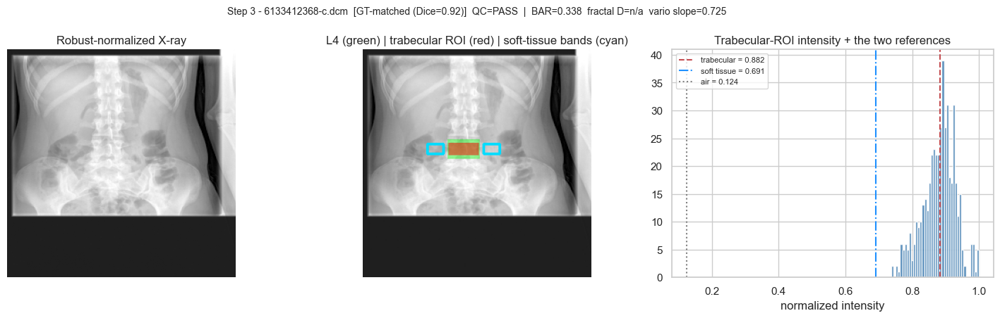


QC: PASS | no issues
detector response: log <- default (no DICOM tag)


In [14]:
# ===== Step 3 demo — (1) BAR really is exposure-invariant, (2) eye-check one L4 =====

# ---- (1) Numerical proof of the property that motivates BAR --------------------------------
# Any exposure / gain / window-level change acts on the attenuation image as A -> a*A + b.
# BAR is a ratio of two DIFFERENCES, so b cancels and a cancels. v15's bmd_rel (a ratio of
# raw means) does not survive an offset.
_rng = np.random.default_rng(0)
_A   = np.clip(_rng.normal(0.55, 0.08, (200, 160)), 0, 1).astype(np.float32)
_roi = np.zeros((200, 160), np.uint8); _roi[40:160, 30:130] = 1
_soft, _air = 0.30, 0.05
_bar  = lambda A, s, a: float((_trimmed_mean(A[_roi > 0]) - s) / (s - a))
_rel  = lambda A, s:    float(_trimmed_mean(A[_roi > 0]) / s)
_a, _b = 2.3, -0.11                                          # arbitrary gain & offset
print("exposure / gain / window-level change  A -> 2.30*A - 0.11")
print(f"  BAR      before={_bar(_A,_soft,_air):.6f}   after={_bar(_a*_A+_b, _a*_soft+_b, _a*_air+_b):.6f}"
      f"   -> invariant")
print(f"  bmd_rel  before={_rel(_A,_soft):.6f}   after={_rel(_a*_A+_b, _a*_soft+_b):.6f}"
      f"   -> drifts (v15)")

# ---- (2) Visual sanity check of the extractor on one real study -----------------------------
if eval_items:
    _p = eval_items[0]
    _rec, _art = measure_l4(_p, use_gt=True)
    _m, _roi2, _gl = _art["l4"], _art["roi"], _art["gray"]
    if _m is not None:
        _vis = cv2.cvtColor((_gl * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
        _vis[_m    > 0] = (0.6 * _vis[_m    > 0] + 0.4 * np.array([0, 255, 0])).astype(np.uint8)
        _vis[_roi2 > 0] = (0.5 * _vis[_roi2 > 0] + 0.5 * np.array([255, 0, 0])).astype(np.uint8)
        for (bx0, by0, bx1, by1) in soft_tissue_bands(_m, _gl.shape):
            cv2.rectangle(_vis, (bx0, by0), (bx1, by1), (0, 220, 255), 2)

        fig, ax = plt.subplots(1, 3, figsize=(15, 4.6))
        ax[0].imshow(_gl, cmap="gray"); ax[0].set_title("Robust-normalized X-ray"); ax[0].axis("off")
        ax[1].imshow(_vis); ax[1].axis("off")
        ax[1].set_title("L4 (green) | trabecular ROI (red) | soft-tissue bands (cyan)")
        _v = _gl[_roi2 > 0]
        ax[2].hist(_v.ravel(), bins=40, color="steelblue", alpha=0.85)
        ax[2].axvline(_rec["bmd_trimmed"], color="r", ls="--", label=f"trabecular = {_rec['bmd_trimmed']:.3f}")
        if _rec.get("soft_tissue_ref"):
            ax[2].axvline(_rec["soft_tissue_ref"], color="dodgerblue", ls="-.",
                          label=f"soft tissue = {_rec['soft_tissue_ref']:.3f}")
        if _rec.get("air_ref") is not None:
            ax[2].axvline(_rec["air_ref"], color="gray", ls=":", label=f"air = {_rec['air_ref']:.3f}")
        ax[2].set_title("Trabecular-ROI intensity + the two references"); ax[2].legend(fontsize=8)
        ax[2].set_xlabel("normalized intensity")
        _f = lambda k, d=3: ("n/a" if _rec.get(k) is None else f"{_rec[k]:.{d}f}")
        fig.suptitle(f"Step 3 - {os.path.basename(_p)[-16:]}  [{_rec['status']}]  QC={_rec['qc_status']}  |  "
                     f"BAR={_f('bar')}  fractal D={_f('fractal_dim')}  "
                     f"vario slope={_f('vario_slope')}", fontsize=10)
        plt.tight_layout(); savefig(fig, "step3_extractor_sanity.png"); plt.show()
        print("\nQC:", _rec["qc_status"], "|", "; ".join(_rec["qc_messages"]) or "no issues")
        print("detector response:", _rec["response"], "<-", _rec["response_source"])
    else:
        print("No L4 detected on the demo image; skipping Step 3 sanity plot.")
else:
    print("No eval_items available for the Step 3 demo.")


## Step 4 — Evaluation on the DICOM Test Set

Evaluated on `dataset-dcm/test/gather` against the **L4 ground-truth masks**, reported **two ways**:

- **(A) Deployed** — Dice / IoU / Precision / Recall of the mask the pipeline actually *names* `L4`
  (the honest real-world inference number; no ground truth used to pick the vertebra).
- **(B) Matched** — Dice of the *best-overlap* detected vertebra vs the GT L4 (isolates segmentation
  quality from *which* vertebra is labelled L4).

A large **(B − A) gap** is the signature of an **L4 naming / indexing** problem on the out-of-domain
DICOM field-of-view — **not** poor segmentation. Metrics CSV → `metrics/`, figures → `figures/`.

In [15]:
# ---- Dual-metric evaluation: (A) Deployed (named L4) vs (B) Matched (best-overlap) ----
# seg_scores / best_overlap now live in Step 3c so the measurement core can reuse them.
rows, idx_pred, idx_gt = [], [], []
cm_total = np.zeros((2, 2), dtype=np.int64)
n_fail = 0
INDEX_NAME = "BAR"          # v16 primary index; falls back to bmd_trimmed if BAR is unusable

for dp in eval_items:
    rgb, gray_lin, H, W = load_xray(dp)
    resp = xray_meta(dp)["response"]
    sel, status, inst, r = yolo_l4(rgb)
    gt = load_test_gt_l4(dp, H, W)
    if gt is None:
        continue
    if sel is None:
        sel = np.zeros((H, W), np.uint8); n_fail += 1
    d, i, p, rc, tp, fp, fn = seg_scores(sel, gt)            # (A) DEPLOYED
    bo_mask, d_match = best_overlap(inst, gt)                # (B) MATCHED
    tn = H*W - (tp + fp + fn)
    cm_total += np.array([[tn, fp], [fn, tp]], dtype=np.int64)
    rows.append({"file": os.path.basename(dp), "status": status, "n_inst": len(inst),
                 "dice": d, "iou": i, "precision": p, "recall": rc, "dice_matched": d_match})
    air = air_reference(gray_lin)
    bp = compute_bmd(gray_lin, trabecular_roi(sel), full_mask=sel, response=resp, air=air) if sel.sum() else None
    bg = compute_bmd(gray_lin, trabecular_roi(gt),  full_mask=gt,  response=resp, air=air)
    if bp and bg:
        vp = bp.get("bar") if bp.get("bar") is not None else bp["bmd_trimmed"]
        vg = bg.get("bar") if bg.get("bar") is not None else bg["bmd_trimmed"]
        idx_pred.append(vp); idx_gt.append(vg)

dfm = pd.DataFrame(rows)
print(f"Evaluated {len(dfm)} test images | L4 detection failures: {n_fail}\n")
print("=== (A) DEPLOYED - mask the model names 'L4'  (honest real-world inference) ===")
for c in ["dice", "iou", "precision", "recall"]:
    print(f"  {c.capitalize():10s}: {dfm[c].mean():.4f} +/- {dfm[c].std():.4f}")
print("\n=== (B) MATCHED - best-overlap vertebra vs GT  (segmentation quality, naming aside) ===")
print(f"  Dice      : {dfm['dice_matched'].mean():.4f} +/- {dfm['dice_matched'].std():.4f}")

n_zero = int((dfm['dice'] < 0.05).sum())
gap = dfm['dice_matched'].mean() - dfm['dice'].mean()
print(f"\n>> Indexing gap (Matched - Deployed Dice) = {gap:.4f}")
if n_zero:
    print(f">> {n_zero}/{len(dfm)} images have Deployed Dice ~ 0, yet best-overlap reaches mean Dice = "
          f"{dfm.loc[dfm['dice']<0.05, 'dice_matched'].mean():.3f} on those same images.")
dfm.to_csv(os.path.join(METRICS_DIR, "L4_test_segmetrics.csv"), index=False)
print("Saved ->", os.path.join(METRICS_DIR, "L4_test_segmetrics.csv"))


Evaluated 42 test images | L4 detection failures: 3

=== (A) DEPLOYED - mask the model names 'L4'  (honest real-world inference) ===
  Dice      : 0.3024 +/- 0.4166
  Iou       : 0.2677 +/- 0.3750
  Precision : 0.2963 +/- 0.4109
  Recall    : 0.3110 +/- 0.4274

=== (B) MATCHED - best-overlap vertebra vs GT  (segmentation quality, naming aside) ===
  Dice      : 0.7569 +/- 0.2128

>> Indexing gap (Matched - Deployed Dice) = 0.4545
>> 27/42 images have Deployed Dice ~ 0, yet best-overlap reaches mean Dice = 0.707 on those same images.
Saved -> ./l4_v7_output\metrics\L4_test_segmetrics.csv


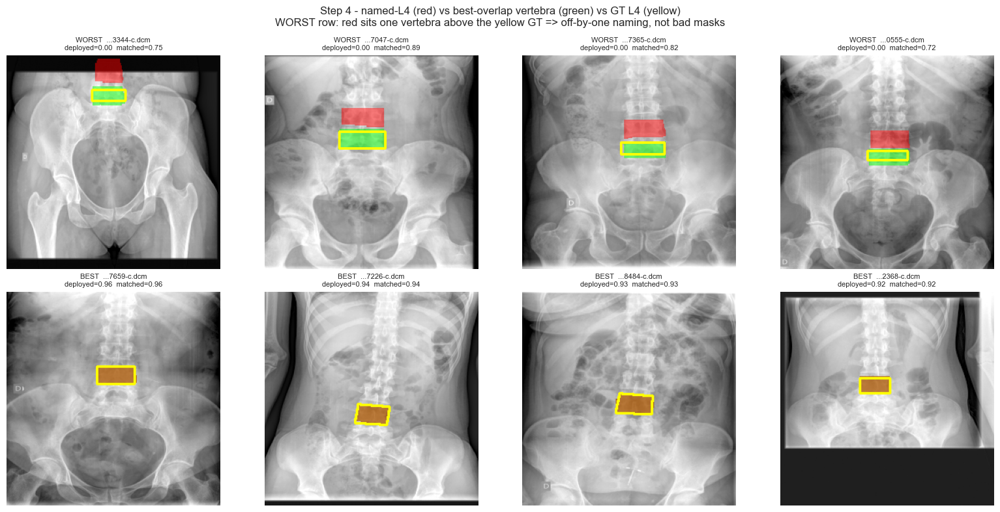

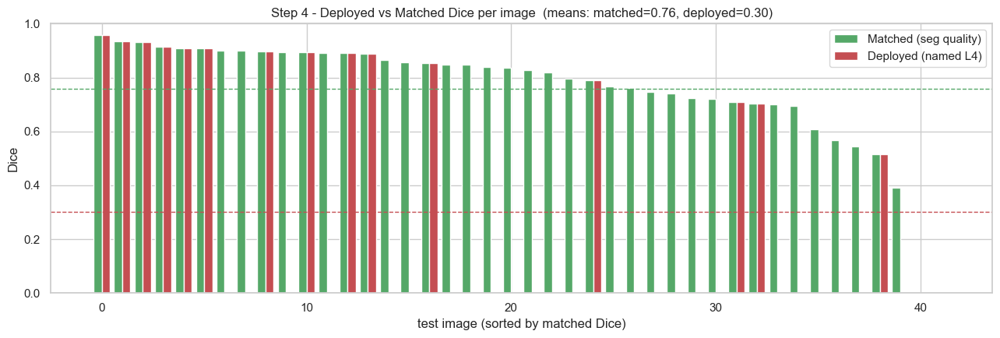

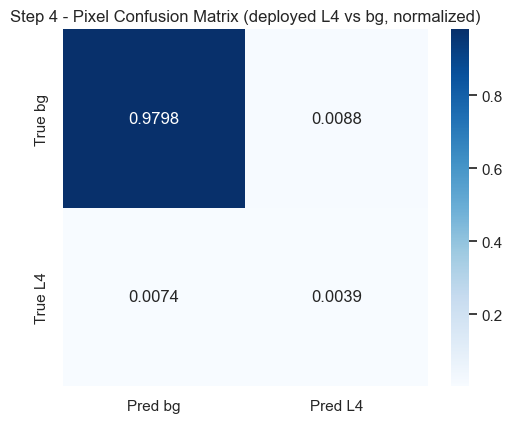

In [16]:
# ---- (1) Diagnostic overlays: where does the 'L4' name land vs the true L4? ----
# red = named 'L4' (deployed)   green = best-overlap vertebra (matched)   yellow = GT L4 contour
worst = dfm.sort_values("dice").head(4)["file"].tolist()
best  = dfm.sort_values("dice", ascending=False).head(4)["file"].tolist()
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for k, fname in enumerate(worst + best):
    dp = next(p for p in eval_items if os.path.basename(p) == fname)
    rgb, _, H, W = load_xray(dp)
    sel, status, inst, r = yolo_l4(rgb)
    gt = load_test_gt_l4(dp, H, W)
    bo_mask, d_match = best_overlap(inst, gt)
    vis = rgb.copy()
    if bo_mask is not None and bo_mask.sum():
        vis[bo_mask > 0] = (0.5*vis[bo_mask > 0] + 0.5*np.array([0, 255, 0])).astype(np.uint8)
    if sel is not None and sel.sum():
        vis[sel > 0]     = (0.5*vis[sel > 0]     + 0.5*np.array([255, 0, 0])).astype(np.uint8)
    if gt is not None:
        cnts, _ = cv2.findContours(gt, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(vis, cnts, -1, (255, 255, 0), 2)
    row = dfm[dfm.file == fname].iloc[0]
    ax = axes[k//4, k % 4]
    ax.imshow(vis); ax.axis("off")
    ax.set_title(f"{'WORST' if k < 4 else 'BEST'}  ...{fname[-10:]}\n"
                 f"deployed={row['dice']:.2f}  matched={row['dice_matched']:.2f}", fontsize=8)
fig.suptitle("Step 4 - named-L4 (red) vs best-overlap vertebra (green) vs GT L4 (yellow)\n"
             "WORST row: red sits one vertebra above the yellow GT => off-by-one naming, not bad masks",
             fontsize=12)
plt.tight_layout(); savefig(fig, "step4_overlays.png"); plt.show()

# ---- (2) Per-image Deployed vs Matched Dice ----
order = dfm.sort_values("dice_matched", ascending=False).reset_index(drop=True)
x = np.arange(len(order))
fig, ax = plt.subplots(figsize=(13, 4.5))
ax.bar(x - 0.2, order["dice_matched"], width=0.4, label="Matched (seg quality)", color="#55A868")
ax.bar(x + 0.2, order["dice"],         width=0.4, label="Deployed (named L4)",   color="#C44E52")
ax.axhline(order["dice_matched"].mean(), color="#55A868", ls="--", lw=1)
ax.axhline(order["dice"].mean(),         color="#C44E52", ls="--", lw=1)
ax.set_xlabel("test image (sorted by matched Dice)"); ax.set_ylabel("Dice"); ax.set_ylim(0, 1)
ax.set_title(f"Step 4 - Deployed vs Matched Dice per image  "
             f"(means: matched={order['dice_matched'].mean():.2f}, deployed={order['dice'].mean():.2f})")
ax.legend(); plt.tight_layout(); savefig(fig, "step4_deployed_vs_matched.png"); plt.show()

# ---- (3) Pixel confusion matrix (deployed L4 vs background) ----
fig, ax = plt.subplots(figsize=(5.2, 4.4))
sns.heatmap(cm_total / cm_total.sum(), annot=True, fmt=".4f", cmap="Blues",
            xticklabels=["Pred bg", "Pred L4"], yticklabels=["True bg", "True L4"], ax=ax)
ax.set_title("Step 4 - Pixel Confusion Matrix (deployed L4 vs bg, normalized)")
plt.tight_layout(); savefig(fig, "step4_confusion_matrix.png"); plt.show()

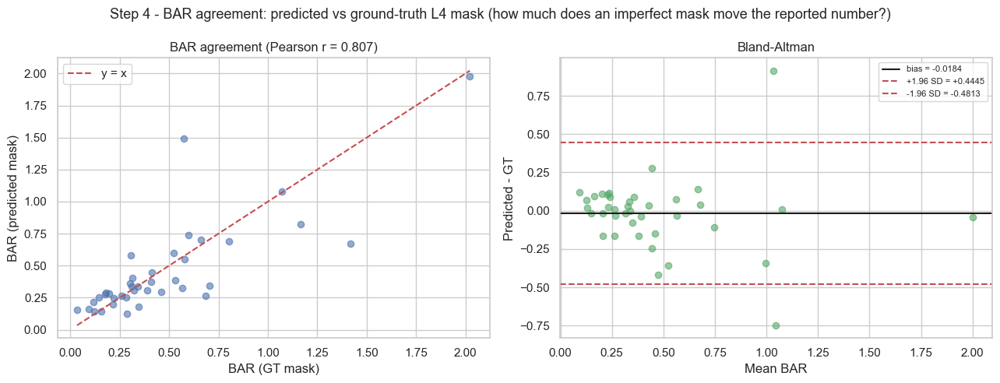

Segmentation-induced BAR bias = -0.0184, 95% limits of agreement = [-0.4813, +0.4445]


In [17]:
# ---- Bland-Altman + correlation of the PRIMARY index (predicted vs GT mask) ----
# v16: the agreement is now measured on BAR, the number a clinician actually reads.
idx_pred = np.array(idx_pred); idx_gt = np.array(idx_gt)
if len(idx_gt) >= 2:
    fig, ax = plt.subplots(1, 2, figsize=(13, 5))
    ax[0].scatter(idx_gt, idx_pred, alpha=0.6, color="#4C72B0")
    lims = [min(idx_gt.min(), idx_pred.min()), max(idx_gt.max(), idx_pred.max())]
    ax[0].plot(lims, lims, "r--", label="y = x")
    r = np.corrcoef(idx_gt, idx_pred)[0, 1]
    ax[0].set_title(f"{INDEX_NAME} agreement (Pearson r = {r:.3f})")
    ax[0].set_xlabel(f"{INDEX_NAME} (GT mask)"); ax[0].set_ylabel(f"{INDEX_NAME} (predicted mask)")
    ax[0].legend()

    mean_b = (idx_pred + idx_gt) / 2.0; diff_b = idx_pred - idx_gt
    mdv, sdv = diff_b.mean(), diff_b.std()
    ax[1].scatter(mean_b, diff_b, alpha=0.6, color="#55A868")
    ax[1].axhline(mdv, color="k", label=f"bias = {mdv:+.4f}")
    ax[1].axhline(mdv + 1.96*sdv, color="r", ls="--", label=f"+1.96 SD = {mdv+1.96*sdv:+.4f}")
    ax[1].axhline(mdv - 1.96*sdv, color="r", ls="--", label=f"-1.96 SD = {mdv-1.96*sdv:+.4f}")
    ax[1].set_xlabel(f"Mean {INDEX_NAME}"); ax[1].set_ylabel("Predicted - GT")
    ax[1].set_title("Bland-Altman"); ax[1].legend(fontsize=8)
    fig.suptitle(f"Step 4 - {INDEX_NAME} agreement: predicted vs ground-truth L4 mask "
                 f"(how much does an imperfect mask move the reported number?)", fontsize=13)
    plt.tight_layout(); savefig(fig, "step4_bland_altman.png"); plt.show()
    print(f"Segmentation-induced {INDEX_NAME} bias = {mdv:+.4f}, "
          f"95% limits of agreement = [{mdv-1.96*sdv:+.4f}, {mdv+1.96*sdv:+.4f}]")
else:
    print("Not enough paired samples for a Bland-Altman plot.")


## Step 5 — Modular Inference (pre-trained model)

`infer_l4(path)` accepts any raw X-ray (**JPG/PNG or DICOM**), runs YOLO segmentation, and returns +
plots the **L4 BMD and GLCM** metrics. Per-sample figures saved to `figures/step5_*`.

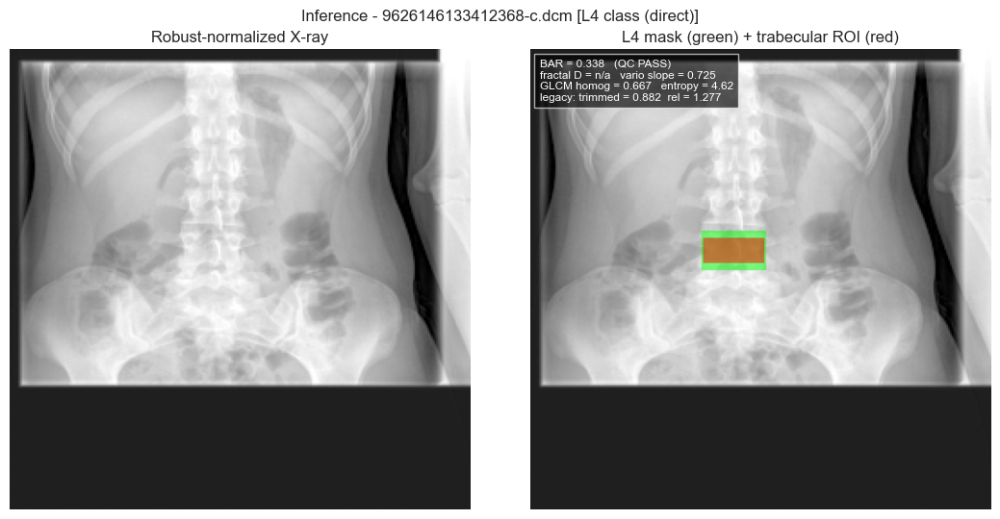

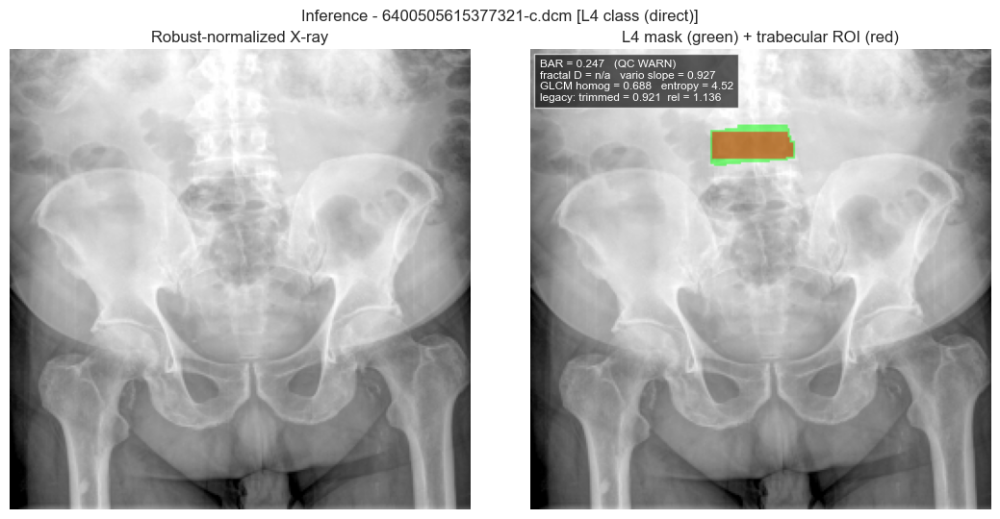

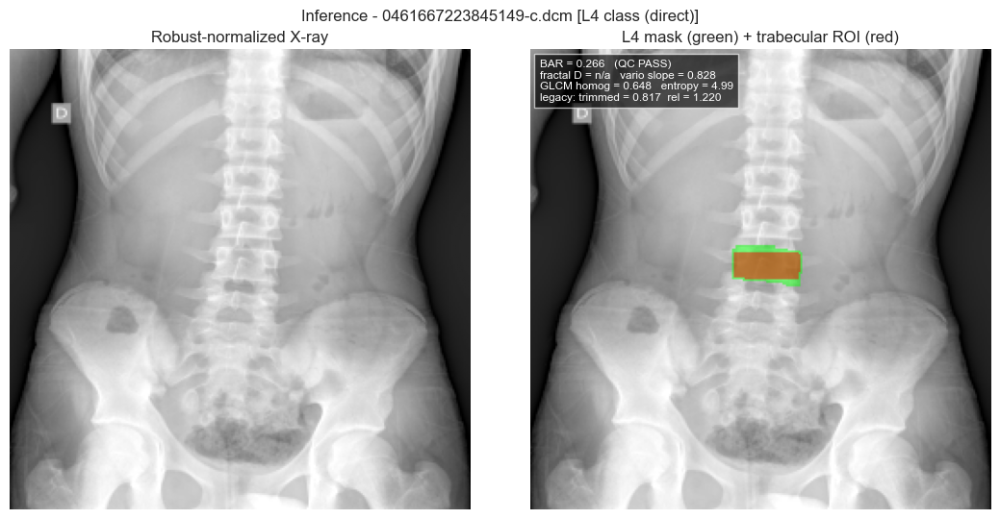

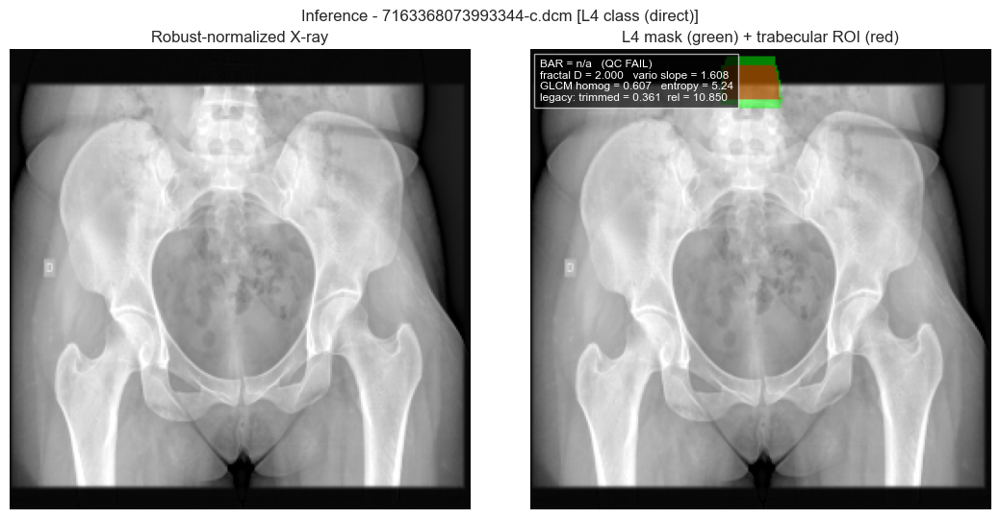

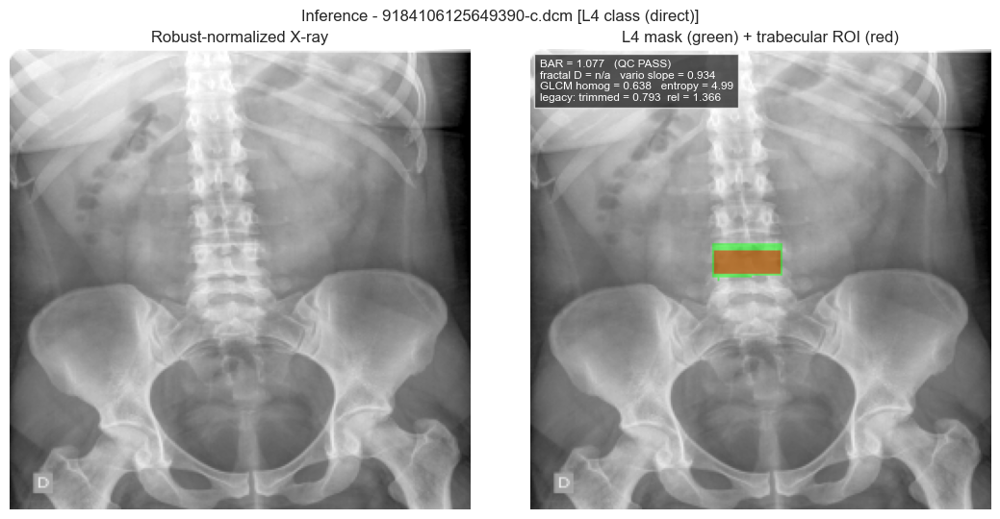

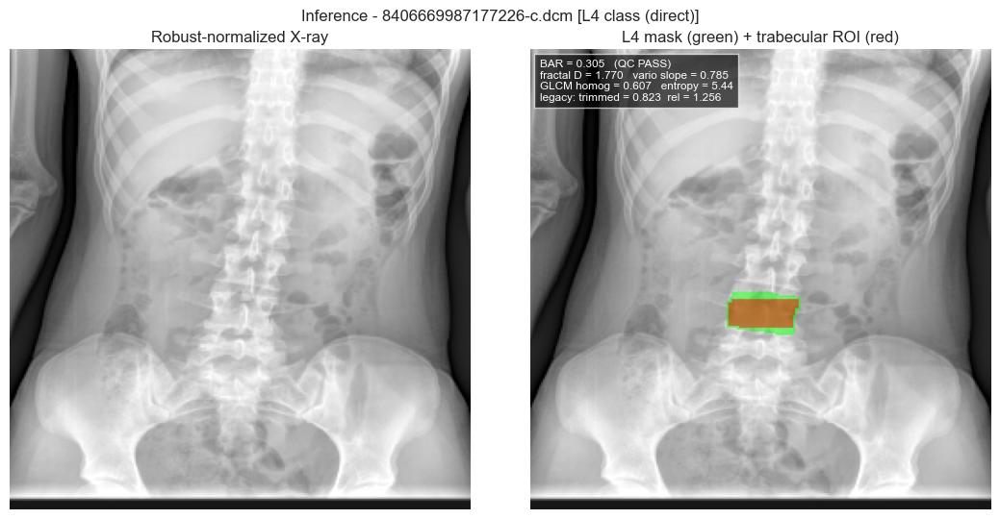

Saved metrics for 42 images -> ./l4_v7_output\metrics\L4_test_metrics.csv


,file,status,qc_status,bar,bmd_trimmed,fractal_dim,vario_slope
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,L4 class (direct),PASS,0.337532,0.882339,NaN,0.724590
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,L4 class (direct),WARN,0.247015,0.920837,NaN,0.927416
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,L4 class (direct),PASS,0.266042,0.816705,NaN,0.827649
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,L4 class (direct),FAIL,NaN,0.361196,2.000000,1.608331
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,L4 class (direct),PASS,1.077019,0.792571,NaN,0.933746
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,L4 class (direct),PASS,0.305124,0.822908,1.769579,0.784916
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,L4 class (direct),PASS,0.598302,0.825363,NaN,1.085866
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,L4 class (direct),PASS,0.373073,0.756871,NaN,0.811159
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,only 1 vertebrae,FAIL,NaN,NaN,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,L4 class (direct),WARN,0.550199,0.862935,NaN,0.881577


In [18]:
def infer_l4(path, show=True, savename=None, use_gt=False):
    """Thin visual wrapper over measure_l4(): the notebook, the CSV, the report card and the
       web export all consume the SAME record, so a number can never disagree with a figure."""
    rec, art = measure_l4(path, use_gt=use_gt)
    rec.update(score_record(rec))                       # no-op until the reference is fitted
    m, roi, rgb, gray_lin = art["l4"], art["roi"], art["rgb"], art["gray"]
    if not show:
        return rec
    if m is None:
        fig = plt.figure(figsize=(5, 5)); plt.imshow(rgb)
        plt.title(f"{rec['status']} (no L4)"); plt.axis("off")
        if savename: savefig(fig, savename)
        plt.show()
        return rec

    vis = rgb.copy()
    vis[m > 0]   = (0.5*vis[m > 0]   + 0.5*np.array([0, 255, 0])).astype(np.uint8)
    vis[roi > 0] = (0.5*vis[roi > 0] + 0.5*np.array([255, 0, 0])).astype(np.uint8)
    fig, ax = plt.subplots(1, 2, figsize=(11, 5.5))
    ax[0].imshow(gray_lin, cmap="gray"); ax[0].set_title("Robust-normalized X-ray"); ax[0].axis("off")
    ax[1].imshow(vis); ax[1].axis("off"); ax[1].set_title("L4 mask (green) + trabecular ROI (red)")
    f = lambda k, d=3: ("n/a" if rec.get(k) is None else f"{rec[k]:.{d}f}")
    txt = (f"BAR = {f('bar')}   (QC {rec['qc_status']})\n"
           f"fractal D = {f('fractal_dim')}   vario slope = {f('vario_slope')}\n"
           f"GLCM homog = {f('glcm_homogeneity')}   entropy = {f('glcm_entropy', 2)}\n"
           f"legacy: trimmed = {f('bmd_trimmed')}  rel = {f('bmd_rel')}")
    if rec.get("bar_pct") is not None:
        txt += f"\n{rec['bar_pct']:.0f}th pct - {rec.get('category','')}"
    ax[1].text(0.02, 0.98, txt, transform=ax[1].transAxes, va="top", fontsize=8.5,
               color="white", bbox=dict(facecolor="black", alpha=0.65))
    fig.suptitle(f"Inference - {os.path.basename(path)[-22:]} [{rec['status']}]", fontsize=12)
    plt.tight_layout()
    if savename: savefig(fig, savename)
    plt.show()
    return rec

results = [infer_l4(p, show=(k < 6), savename=f"step5_infer_{k:02d}.png" if k < 6 else None)
           for k, p in enumerate(eval_items)]
res_df = pd.DataFrame(results)
res_df.to_csv(os.path.join(METRICS_DIR, "L4_test_metrics.csv"), index=False)
print(f"Saved metrics for {len(res_df)} images -> {os.path.join(METRICS_DIR, 'L4_test_metrics.csv')}")
display(res_df[[c for c in ("file", "status", "qc_status", "bar", "bmd_trimmed",
                            "fractal_dim", "vario_slope") if c in res_df]].head(10))


## Step 6 — Measure every test study once

`measure_l4()` is called once per DICOM and the resulting `records` list is the **single source of
truth** for every step that follows (the reference fit, the precision experiment, the report cards,
the cohort dashboard, and the web export). Per-image artifacts land in `segmentation/`:

- `<id>_overlay.png` — all detected vertebrae (blue), L4 (green), trabecular ROI (red)
- `<id>_L4mask.png` — the binary L4 mask
- `L4_extraction_summary.csv` — status + **QC verdict** + BAR + microarchitecture, per image


Measured 42 studies -> ./l4_v7_output\segmentation (overlays + masks + summary CSV)
QC verdicts: {'PASS': 27, 'WARN': 10, 'FAIL': 5}
BAR available on 37/42 studies.


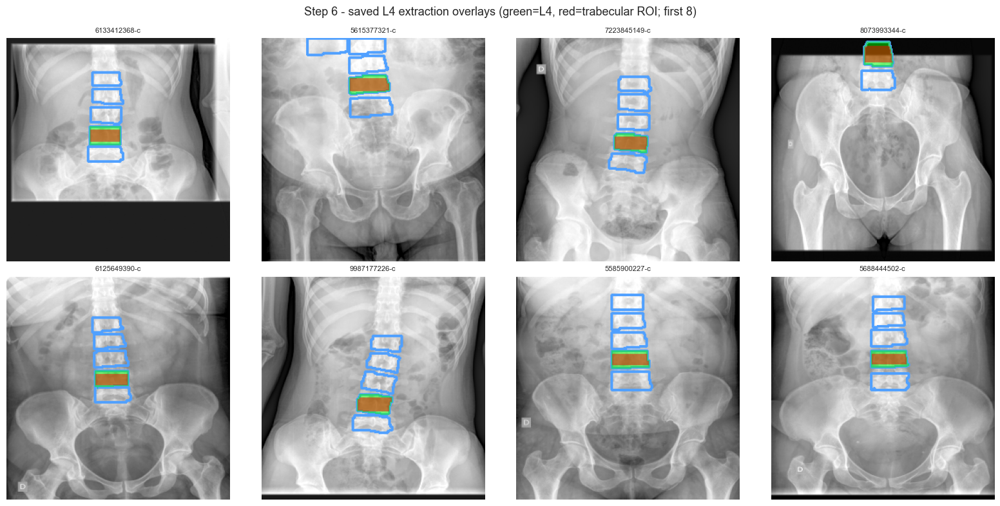

,file,status,qc_status,bar,bar_L1L4_mean,n_vert
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,L4 class (direct),PASS,0.337532,0.282953,4.0
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,L4 class (direct),WARN,0.247015,0.222479,3.0
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,L4 class (direct),PASS,0.266042,0.201384,4.0
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,L4 class (direct),FAIL,NaN,NaN,1.0
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,L4 class (direct),PASS,1.077019,0.729917,4.0
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,L4 class (direct),PASS,0.305124,0.272538,4.0
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,L4 class (direct),PASS,0.598302,0.426031,4.0
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,L4 class (direct),PASS,0.373073,0.475640,4.0
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,only 1 vertebrae,FAIL,NaN,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,L4 class (direct),WARN,0.550199,0.320029,4.0


In [19]:
# ---- Step 6 - measure EVERY test study once; this `records` list feeds everything after it ----
records, gallery = [], []
for dp in test_dcm_files:
    stem = os.path.splitext(os.path.basename(dp))[0]
    rec, art = measure_l4(dp)
    records.append(rec)
    m, roi, rgb = art["l4"], art["roi"], art["rgb"]
    if m is None:
        continue
    vis = rgb.copy()
    r = art["result"]
    if r.masks is not None:
        for poly in r.masks.xy:
            cv2.polylines(vis, [poly.astype(np.int32)], True, (80, 160, 255), 2)
    vis[m > 0]   = (0.5*vis[m > 0]   + 0.5*np.array([0, 255, 0])).astype(np.uint8)
    vis[roi > 0] = (0.5*vis[roi > 0] + 0.5*np.array([255, 0, 0])).astype(np.uint8)
    cv2.imwrite(os.path.join(SEG_DIR, stem + "_overlay.png"), cv2.cvtColor(vis, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(SEG_DIR, stem + "_L4mask.png"), (m * 255).astype(np.uint8))
    if len(gallery) < 8:
        gallery.append((stem, vis))

summary = pd.DataFrame(records)
summary["qc_messages"] = summary["qc_messages"].apply(lambda v: "; ".join(v) if isinstance(v, list) else v)
summary.to_csv(os.path.join(SEG_DIR, "L4_extraction_summary.csv"), index=False)
print(f"Measured {len(summary)} studies -> {SEG_DIR} (overlays + masks + summary CSV)")
print(f"QC verdicts: {summary['qc_status'].value_counts().to_dict()}")
n_bar = int(summary["bar"].notna().sum()) if "bar" in summary else 0
print(f"BAR available on {n_bar}/{len(summary)} studies.")
if n_bar == 0:
    print("[warn] no study produced a BAR -> the reference fit in Step 6c will be skipped.")

if gallery:
    ncol = 4; nrow = int(np.ceil(len(gallery) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=(4*ncol, 4*nrow))
    axes = np.atleast_1d(axes).ravel()
    for a in axes: a.axis("off")
    for a, (stem, vis) in zip(axes, gallery):
        a.imshow(vis); a.set_title(stem[-12:], fontsize=8); a.axis("off")
    fig.suptitle("Step 6 - saved L4 extraction overlays (green=L4, red=trabecular ROI; first 8)", fontsize=13)
    plt.tight_layout(); savefig(fig, "step6_extraction_gallery.png"); plt.show()
display(summary[[c for c in ("file", "status", "qc_status", "bar", "bar_L1L4_mean", "n_vert")
                 if c in summary]].head(10))


## Step 6b — L1~L4 averaged lumbar density (DXA convention)

Clinical lumbar DXA reports BMD as the **L1–L4 average**, not a single vertebra. We already segment
L1~L5, so each vertebra gets its own trabecular ROI and its own **BAR**, and we report their mean.
This is more robust than a lone L4: if one vertebra fails to segment, the rest still average, and
`n_vert` records how many contributed. Values come straight from the Step 6 `records` — no second
inference pass.


Saved L1~L4 spine density for 42 studies -> ./l4_v7_output\metrics\L1L4_spine_bmd.csv  (26/42 with all four vertebrae measurable).


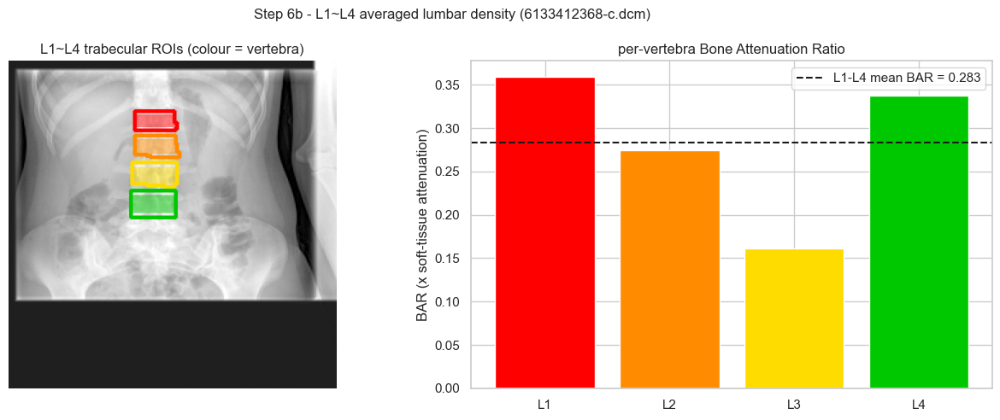

,file,n_vert,bmd_L1,bmd_L2,bmd_L3,bmd_L4,bar_L1,bar_L2,bar_L3,bar_L4,bmd_L1L4_mean,bar_L1L4_mean,bmd_rel_L1L4_mean
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,4.0,0.919612,0.899358,0.851294,0.882339,0.359355,0.274127,0.160797,0.337532,0.888151,0.282953,1.233806
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,3.0,NaN,0.966673,0.970400,0.920837,NaN,0.241696,0.178724,0.247015,0.952637,0.222479,1.126049
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,4.0,0.865238,0.850826,0.842922,0.816705,0.204515,0.149793,0.185188,0.266042,0.843923,0.201384,1.168905
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,1.0,NaN,NaN,NaN,0.361196,NaN,NaN,NaN,NaN,0.361196,NaN,10.849826
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,4.0,0.812911,0.785398,0.730823,0.792571,0.568372,0.512374,0.761902,1.077019,0.780426,0.729917,1.267975
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,4.0,0.829217,0.841826,0.802467,0.822908,0.329501,0.266074,0.189455,0.305124,0.824104,0.272538,1.229093
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,4.0,0.948357,0.886156,0.866027,0.825363,0.249707,0.473602,0.382513,0.598302,0.881476,0.426031,1.180865
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,4.0,0.913437,0.924873,0.867695,0.756871,0.628420,0.599495,0.301573,0.373073,0.865719,0.475640,1.287684
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,4.0,0.953224,0.943765,0.917451,0.862935,0.206596,0.381922,0.141399,0.550199,0.919344,0.320029,1.284796


In [20]:
# ---- Step 6b - clinical-style L1~L4 averaged density (DXA lumbar convention) ----
# Reuses the `records` measured in Step 6 -- no second YOLO pass.
spine_cols = (["file", "n_vert"]
              + [f"bmd_{CLASS_NAMES[c]}" for c in (0, 1, 2, 3)]
              + [f"bar_{CLASS_NAMES[c]}" for c in (0, 1, 2, 3)]
              + ["bmd_L1L4_mean", "bar_L1L4_mean", "bmd_rel_L1L4_mean"])
spine_df  = pd.DataFrame(records).reindex(columns=spine_cols)
spine_csv = os.path.join(METRICS_DIR, "L1L4_spine_bmd.csv")
spine_df.to_csv(spine_csv, index=False)
n_full = int((spine_df["n_vert"] == 4).sum())
print(f"Saved L1~L4 spine density for {len(spine_df)} studies -> {spine_csv}  "
      f"({n_full}/{len(spine_df)} with all four vertebrae measurable).")

if test_dcm_files:
    _p = test_dcm_files[0]
    _rec, _art = measure_l4(_p)
    _vis, _masks = _art["rgb"].copy(), _art["vmask"]
    palette = [(255, 0, 0), (255, 140, 0), (255, 220, 0), (0, 200, 0)]   # L1..L4
    for c in (0, 1, 2, 3):
        m = _masks.get(c)
        if m is None:
            continue
        roi = trabecular_roi(m)
        cnts, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        cv2.drawContours(_vis, cnts, -1, palette[c], 2)
        _vis[roi > 0] = (0.5 * _vis[roi > 0] + 0.5 * np.array(palette[c])).astype(np.uint8)
    vals = [_rec.get(f"bar_{CLASS_NAMES[c]}") for c in (0, 1, 2, 3)]

    fig, ax = plt.subplots(1, 2, figsize=(13, 5))
    ax[0].imshow(_vis); ax[0].set_title("L1~L4 trabecular ROIs (colour = vertebra)"); ax[0].axis("off")
    names = [CLASS_NAMES[c] for c in (0, 1, 2, 3)]
    ax[1].bar(names, [v if v is not None else 0 for v in vals],
              color=[np.array(palette[c]) / 255 for c in (0, 1, 2, 3)])
    if _rec.get("bar_L1L4_mean") is not None:
        ax[1].axhline(_rec["bar_L1L4_mean"], color="k", ls="--",
                      label=f"L1-L4 mean BAR = {_rec['bar_L1L4_mean']:.3f}")
        ax[1].legend()
    ax[1].set_title("per-vertebra Bone Attenuation Ratio")
    ax[1].set_ylabel("BAR (x soft-tissue attenuation)")
    fig.suptitle(f"Step 6b - L1~L4 averaged lumbar density ({os.path.basename(_p)[-16:]})", fontsize=12)
    plt.tight_layout(); savefig(fig, "step6b_spine_L1L4_bmd.png"); plt.show()

display(spine_df.head(10))


## Step 6c — Fit the reference cohort (what "normal" means here)

Every clinical score in this notebook is *relative to a reference*. We fit that reference on the
studies that passed QC, and we persist it to `metrics/bmd_reference.json` so the notebook, the
`bmd-viewer` backend, and any future run all score against **the same distribution**.

Two things are learned per feature: its **mean / SD** (for the z-score) and its **sign** — the
direction in which it moves as bone gets denser, estimated as `sign(corr(feature, BAR))`. BAR itself
is anchored at `+1` on physical grounds. The correlation table printed below is the audit trail: if a
texture feature has `|r| ≈ 0`, its polarity is arbitrary and its BHI weight should be dropped.

> ⚠️ This cohort is a mixed clinical test set, **not a healthy normative database**. `bar_z` is a
> *cohort* z-score and is **not a DXA T-score**. Re-fit against DXA T-scores as soon as labels exist.


In [21]:
# ---- Step 6c - fit (or load) the reference, then score every study ----
REFERENCE = fit_reference(records, name=f"BUU/DICOM test cohort (n={len(records)})")
if REFERENCE:
    save_reference(REFERENCE)
    print(f"Reference fitted on {REFERENCE['n']} QC-passing studies -> {REFERENCE_JSON}\n")
    ref_tbl = pd.DataFrame([
        {"feature": f, "clinical name": FEATURE_LABELS.get(f, f), "mean": st["mean"], "sd": st["sd"],
         "sign": int(st["sign"]), "r_with_BAR": st["r_with_bar"], "BHI weight": BHI_WEIGHTS.get(f, 0.0)}
        for f, st in REFERENCE["features"].items()])
    display(ref_tbl.round(4))
    weak = ref_tbl[(ref_tbl.feature != "bar") & (ref_tbl.r_with_BAR.abs() < 0.2)]
    if len(weak):
        print("[caution] polarity is weakly determined (|r| < 0.2) for: "
              + ", ".join(weak.feature) + " -> their BHI contribution is close to arbitrary.")
else:
    REFERENCE = load_reference()
    print("Using persisted reference." if REFERENCE else "No reference available -> scores skipped.")

# score every record in place (adds z_*, pct_*, bhi, bar_z, bar_pct, category)
for rec in records:
    rec.update(score_record(rec, REFERENCE))

scored = pd.DataFrame(records)
scored["qc_messages"] = scored["qc_messages"].apply(lambda v: "; ".join(v) if isinstance(v, list) else v)
scored.to_csv(os.path.join(METRICS_DIR, "L4_clinical_scores.csv"), index=False)
print(f"\nSaved clinical scores -> {os.path.join(METRICS_DIR, 'L4_clinical_scores.csv')}")
if "category" in scored:
    print("\nProxy categories (cohort-relative, NOT DXA T-scores):")
    print(scored["category"].value_counts().to_string())
display(scored[[c for c in ("file", "qc_status", "bar", "bar_z", "bar_pct", "bhi", "category")
                if c in scored]].head(10))


Reference fitted on 37 QC-passing studies -> ./l4_v7_output\metrics\bmd_reference.json



,feature,clinical name,mean,sd,sign,r_with_BAR,BHI weight
0,bar,Bone attenuation ratio (density),0.4610,0.3808,1,1.0000,0.500
1,vario_slope,Trabecular texture coarseness (TBS-like),0.9155,0.1264,1,0.1930,0.200
2,fractal_dim,Trabecular network complexity (fractal D),1.7304,0.0509,-1,-0.2514,0.150
3,glcm_homogeneity,Trabecular pattern smoothness,0.6220,0.0466,-1,-0.1118,0.075
4,glcm_entropy,Trabecular pattern disorder,5.2324,0.4668,1,0.1773,0.075


[caution] polarity is weakly determined (|r| < 0.2) for: vario_slope, glcm_homogeneity, glcm_entropy -> their BHI contribution is close to arbitrary.

Saved clinical scores -> ./l4_v7_output\metrics\L4_clinical_scores.csv

Proxy categories (cohort-relative, NOT DXA T-scores):
category
Within reference range    37


,file,qc_status,bar,bar_z,bar_pct,bhi,category
0,1.2.826.0.1.3680043.8.498.10406657579016312201...,PASS,0.337532,-0.324116,37.292503,22.741436,Within reference range
1,1.2.826.0.1.3680043.8.498.10947130043296900260...,WARN,0.247015,-0.561796,28.712736,28.502426,Within reference range
2,1.2.826.0.1.3680043.8.498.11121020226184051416...,PASS,0.266042,-0.511835,30.438313,28.781379,Within reference range
3,1.2.826.0.1.3680043.8.498.11207126462590105123...,FAIL,NaN,NaN,NaN,74.334982,NaN
4,1.2.826.0.1.3680043.8.498.11227155170490832168...,PASS,1.077019,1.617655,94.713151,81.825296,Within reference range
5,1.2.826.0.1.3680043.8.498.11430185427783861938...,PASS,0.305124,-0.409213,34.119158,31.961550,Within reference range
6,1.2.826.0.1.3680043.8.498.11479964994316715381...,PASS,0.598302,0.360625,64.080994,70.754715,Within reference range
7,1.2.826.0.1.3680043.8.498.11666143137939211262...,PASS,0.373073,-0.230790,40.873882,44.955793,Within reference range
8,1.2.826.0.1.3680043.8.498.12209232711532162247...,FAIL,NaN,NaN,NaN,NaN,NaN
9,1.2.826.0.1.3680043.8.498.12608809850577365286...,WARN,0.550199,0.234313,59.262901,62.217412,Within reference range


## Step 6d — Precision: how big must a change be before it is real?

A follow-up scan that reads 3% lower does **not** mean the patient lost 3% of bone — it may be the
same bone, repositioned. Following the ISCD convention we *measure* the pipeline's precision by
re-measuring each study under small rotations / shifts / scalings, then

$$\mathrm{RMS\text{-}CV}\% = \sqrt{\tfrac1n\sum_i \mathrm{CV}_i^2},\qquad
\mathrm{LSC}\% = 2.77 \times \mathrm{RMS\text{-}CV}\%.$$

`interpret_change(baseline, followup, lsc_pct)` then answers the only question a surgeon asks at a
post-operative visit: **is this real bone loss, or is it noise?**

> The perturbations model *repositioning*, not a true test–retest with re-acquisition, so this LSC is
> a **lower bound** on the clinical precision error. Treat it as the floor.


Re-measuring 12 studies x 5 perturbed repeats (+/-2.0 deg, +/-1% shift, +/-2% scale) ...
  [ 1/12] 33412368-c.dcm  n=5  BAR = 0.3461 +/- 0.0055
  [ 2/12] 15377321-c.dcm  n=5  BAR = 0.2665 +/- 0.0275
  [ 3/12] 23845149-c.dcm  n=5  BAR = 0.2683 +/- 0.0108
  [ 4/12] 73993344-c.dcm  skipped (fewer than 2 usable repeats)
  [ 5/12] 25649390-c.dcm  n=5  BAR = 1.0941 +/- 0.0293
  [ 6/12] 87177226-c.dcm  n=5  BAR = 0.3170 +/- 0.0159
  [ 7/12] 85900227-c.dcm  n=5  BAR = 0.5830 +/- 0.0119
  [ 8/12] 88444502-c.dcm  n=5  BAR = 0.4974 +/- 0.1679
  [ 9/12] 14969492-c.dcm  skipped (fewer than 2 usable repeats)
  [10/12] 64466891-c.dcm  n=5  BAR = 0.5915 +/- 0.0547
  [11/12] 25428484-c.dcm  n=5  BAR = 1.9650 +/- 0.1249
  [12/12] 16567047-c.dcm  n=5  BAR = 0.8065 +/- 0.0648

Precision on BAR: RMS-CV = 12.22%  over 10 studies
Least Significant Change (95%): LSC = 33.84%
  -> a follow-up BAR must move by more than 33.8% to be called real.


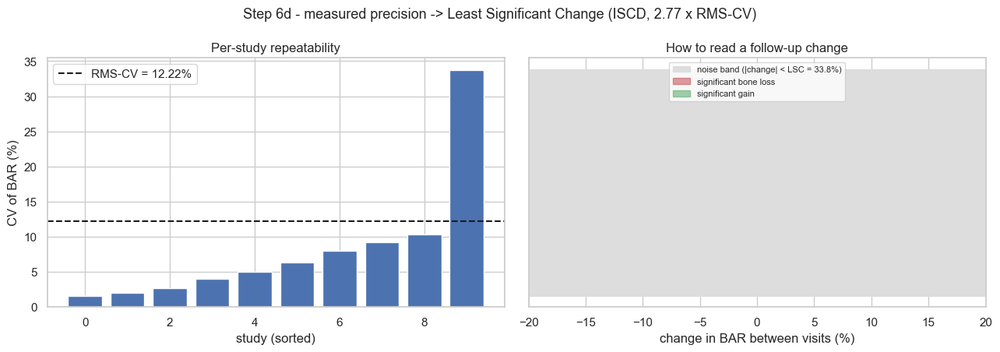


Worked example - interpret_change():
  3% drop  : no significant change (-3.0% is within the 33.8% precision error)
  15% drop : no significant change (-15.0% is within the 33.8% precision error)


In [22]:
# ---- Step 6d - measured precision error and Least Significant Change ----
lsc_studies = test_dcm_files[:LSC_N_STUDIES]
print(f"Re-measuring {len(lsc_studies)} studies x {LSC_REPEATS} perturbed repeats "
      f"(+/-{LSC_JITTER['deg']} deg, +/-{100*LSC_JITTER['shift_frac']:.0f}% shift, "
      f"+/-{100*LSC_JITTER['scale']:.0f}% scale) ...")

per_study = []
for k, dp in enumerate(lsc_studies):
    vals = repeat_measure(dp, metric="bar")
    tag = f"  [{k+1:2d}/{len(lsc_studies)}] {os.path.basename(dp)[-14:]}"
    if len(vals) >= 2:
        per_study.append(vals)
        print(f"{tag}  n={len(vals)}  BAR = {np.mean(vals):.4f} +/- {np.std(vals, ddof=1):.4f}")
    else:
        print(f"{tag}  skipped (fewer than 2 usable repeats)")

prec = precision_lsc(per_study)
if prec:
    LSC_PCT = prec["lsc_pct"]
    print(f"\nPrecision on BAR: RMS-CV = {prec['rms_cv_pct']:.2f}%  over {prec['n_studies']} studies")
    print(f"Least Significant Change (95%): LSC = {LSC_PCT:.2f}%")
    print(f"  -> a follow-up BAR must move by more than {LSC_PCT:.1f}% to be called real.")

    cvs = [100 * np.std(v, ddof=1) / abs(np.mean(v)) for v in per_study]
    fig, ax = plt.subplots(1, 2, figsize=(13, 4.6))
    ax[0].bar(range(len(cvs)), sorted(cvs), color="#4C72B0")
    ax[0].axhline(prec["rms_cv_pct"], color="k", ls="--", label=f"RMS-CV = {prec['rms_cv_pct']:.2f}%")
    ax[0].set_xlabel("study (sorted)"); ax[0].set_ylabel("CV of BAR (%)")
    ax[0].set_title("Per-study repeatability"); ax[0].legend()

    deltas = np.linspace(-20, 20, 400)
    ax[1].fill_between(deltas, 0, 1, where=np.abs(deltas) < LSC_PCT, color="#DDDDDD",
                       label=f"noise band (|change| < LSC = {LSC_PCT:.1f}%)")
    ax[1].fill_between(deltas, 0, 1, where=deltas <= -LSC_PCT, color="#C44E52", alpha=.55,
                       label="significant bone loss")
    ax[1].fill_between(deltas, 0, 1, where=deltas >= LSC_PCT, color="#55A868", alpha=.55,
                       label="significant gain")
    ax[1].set_xlim(-20, 20); ax[1].set_yticks([])
    ax[1].set_xlabel("change in BAR between visits (%)")
    ax[1].set_title("How to read a follow-up change"); ax[1].legend(fontsize=8, loc="upper center")
    fig.suptitle("Step 6d - measured precision -> Least Significant Change (ISCD, 2.77 x RMS-CV)", fontsize=13)
    plt.tight_layout(); savefig(fig, "step6d_precision_lsc.png"); plt.show()

    with open(os.path.join(METRICS_DIR, "precision_lsc.json"), "w", encoding="utf-8") as f:
        json.dump(prec, f, indent=2)

    # worked example: pre-op vs post-op on the two lowest/highest scoring studies
    _b = [r["bar"] for r in records if r.get("bar") is not None]
    if len(_b) >= 2:
        print("\nWorked example - interpret_change():")
        for base, foll, tag in [(_b[0], _b[0]*0.97, "3% drop"), (_b[0], _b[0]*0.85, "15% drop")]:
            print(f"  {tag:9s}: {interpret_change(base, foll, LSC_PCT)['verdict']}")
else:
    LSC_PCT = None
    print("Precision could not be estimated (no study produced >= 2 usable repeats).")


## Step 6e — The clinical report card

Everything above collapses into **one page per study**, laid out the way a clinician reads:

1. **Where we measured** — the L4 mask, the trabecular ROI, and the two reference regions (paraspinal
   soft tissue, air). If the ROI is on the wrong vertebra, that is visible immediately.
2. **What the bone looks like** — the ROI intensity map, so the number is traceable to pixels.
3. **How this patient compares** — a **z-score gauge** with the familiar green / amber / red bands at
   $z=-1$ and $z=-2.5$. The layout deliberately mirrors a DXA report so the reading habit transfers,
   while the caption keeps repeating that these are **cohort z-scores, not T-scores**.
4. **The verdict, in sentences** — QC status first (never interpret a `FAIL`), then density, category,
   BHI, microarchitecture, and the LSC threshold for the next visit.

The same record is written to `reports/<study>_report.json` for the **`bmd-viewer`** web project, so
the notebook and the web UI can never disagree about a value.


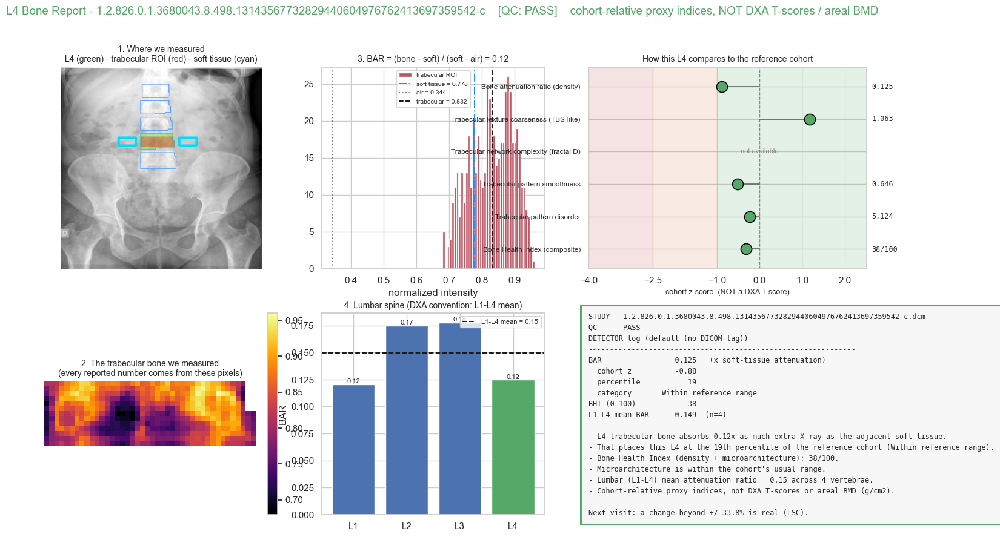

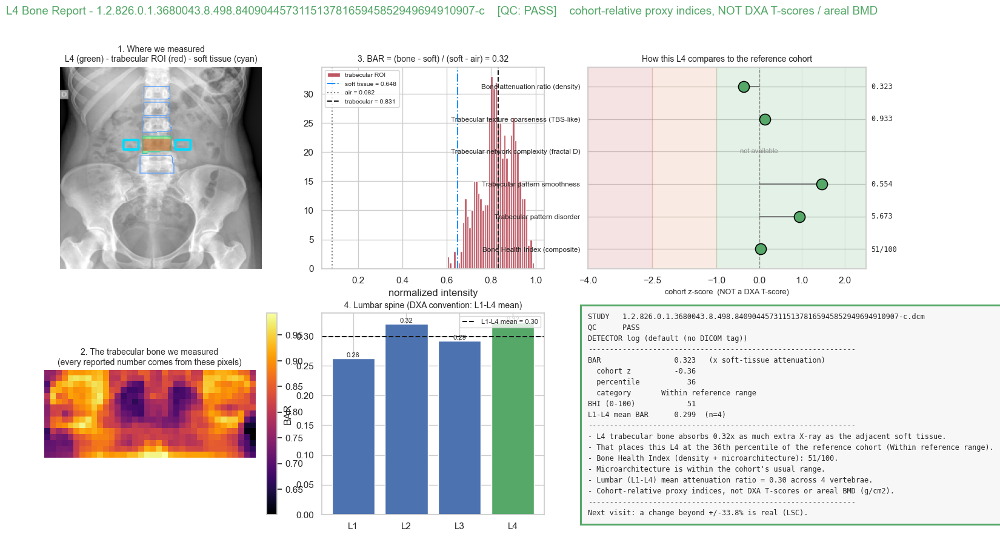

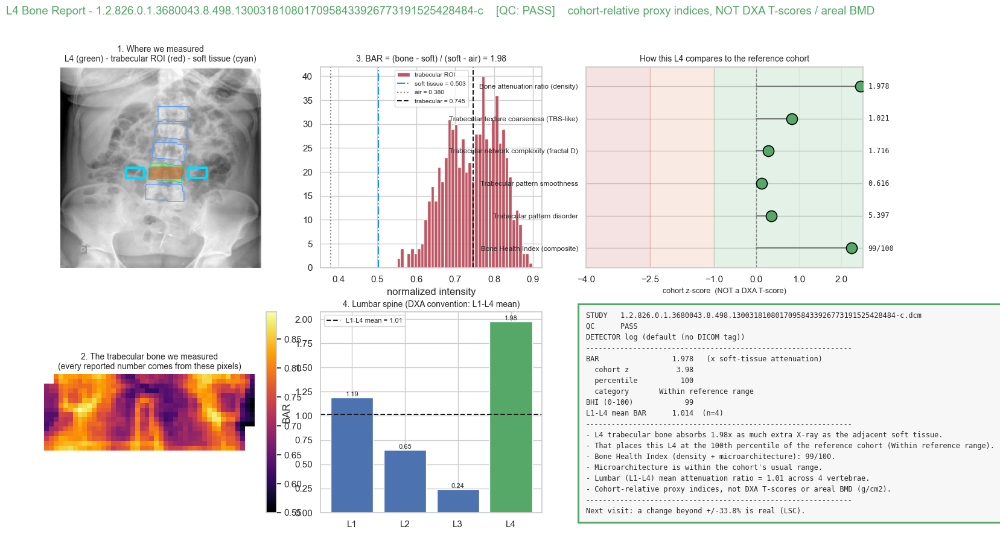


Wrote 42 report.json files + 3 report cards -> ./l4_v7_output\reports


In [23]:
# ---- Step 6e - one-page clinical report card + report.json for the web viewer ----
import matplotlib.gridspec as gridspec

Z_MIN, Z_MAX = -4.0, 2.5          # gauge axis, mirroring a DXA T-score axis

def _zcolor(z):
    return "#C44E52" if z <= CAT_VERYLOW else ("#DD8452" if z < CAT_LOW else "#55A868")

def _gauge(ax, items):
    """Green / amber / red z-score gauge. Bands at z=-1 and z=-2.5, exactly the cut-points
       score_record() uses for the proxy category -- the picture cannot disagree with the label."""
    ax.set_xlim(Z_MIN, Z_MAX); ax.set_ylim(-0.6, len(items) - 0.4)
    ax.axvspan(Z_MIN, CAT_VERYLOW, color="#C44E52", alpha=0.16)
    ax.axvspan(CAT_VERYLOW, CAT_LOW, color="#DD8452", alpha=0.16)
    ax.axvspan(CAT_LOW, Z_MAX, color="#55A868", alpha=0.16)
    ax.axvline(0, color="#888888", lw=1, ls="--")
    for i, (label, z, shown) in enumerate(items[::-1]):
        if z is None:
            ax.text(0, i, "not available", ha="center", va="center", fontsize=8, color="#888888")
            continue
        zc = float(np.clip(z, Z_MIN + 0.05, Z_MAX - 0.05))
        ax.plot([0, zc], [i, i], color="#666666", lw=1.2, zorder=2)
        ax.plot([zc], [i], marker="o", ms=13, color=_zcolor(z), mec="black", mew=1.2, zorder=3)
        ax.text(Z_MAX + 0.12, i, shown, va="center", ha="left", fontsize=8.5, family="monospace")
    ax.set_yticks(range(len(items)))
    ax.set_yticklabels([l for l, _, _ in items[::-1]], fontsize=8.5)
    ax.set_xlabel("cohort z-score  (NOT a DXA T-score)", fontsize=9)
    ax.set_xticks([-4, -2.5, -1, 0, 1, 2])
    ax.set_title("How this L4 compares to the reference cohort", fontsize=10)
    ax.grid(axis="x", alpha=0.25); ax.set_axisbelow(True)

def _jsonable(o):
    if isinstance(o, dict):
        return {k: _jsonable(v) for k, v in o.items()}
    if isinstance(o, (list, tuple)):
        return [_jsonable(v) for v in o]
    if isinstance(o, (np.floating, np.integer)):
        o = o.item()
    if isinstance(o, float) and not math.isfinite(o):
        return None
    return o

def export_report_json(rec, lsc_pct=None, out_dir=REPORT_DIR):
    """The contract with the bmd-viewer web project. One study -> one JSON."""
    stem = os.path.splitext(rec["file"])[0]
    payload = {
        "schema_version": "bmd-report/1.0",
        "study": rec["file"],
        "quality_control": {"status": rec.get("qc_status"), "messages": rec.get("qc_messages", [])},
        "acquisition": {"detector_response": rec.get("response"),
                        "response_source": rec.get("response_source"),
                        "pixel_spacing_mm": rec.get("pixel_spacing_mm")},
        "primary_index": {
            "name": "BAR", "long_name": "Bone Attenuation Ratio",
            "unit": "x soft-tissue attenuation (dimensionless)",
            "value": rec.get("bar"), "z": rec.get("bar_z"), "percentile": rec.get("bar_pct"),
            "category": rec.get("category"),
        },
        "composite": {"bhi": rec.get("bhi"), "bhi_z": rec.get("bhi_z"), "scale": "0-100 cohort percentile"},
        "microarchitecture": {k: rec.get(k) for k in
                              ("vario_slope", "fractal_dim", "glcm_contrast", "glcm_correlation",
                               "glcm_energy", "glcm_homogeneity", "glcm_entropy")},
        "lumbar": {"bar_L1L4_mean": rec.get("bar_L1L4_mean"),
                   "bmd_L1L4_mean": rec.get("bmd_L1L4_mean"),
                   "n_vertebrae": rec.get("n_vert"),
                   "per_vertebra": {CLASS_NAMES[c]: rec.get(f"bar_{CLASS_NAMES[c]}") for c in (0, 1, 2, 3)}},
        "legacy_indices": {k: rec.get(k) for k in ("bmd_trimmed", "bmd_rel", "bmd_mean",
                                                   "bmd_median", "soft_tissue_ref", "air_ref")},
        "precision": {"lsc_pct": lsc_pct,
                      "note": "A follow-up change smaller than lsc_pct is measurement noise."},
        "reference": {"name": (REFERENCE or {}).get("name"), "n": (REFERENCE or {}).get("n")},
        "interpretation": interpret(rec),
        "disclaimer": ("Cohort-relative radiographic proxy indices. NOT areal BMD (g/cm2) and NOT "
                       "DXA T-scores. For research and methodological demonstration only."),
    }
    path = os.path.join(out_dir, f"{stem}_report.json")
    with open(path, "w", encoding="utf-8") as f:
        json.dump(_jsonable(payload), f, indent=2)
    return path

def clinical_report(path, lsc_pct=None, save=True, show=True):
    """One page a clinician can read in ten seconds."""
    rec, art = measure_l4(path)
    rec.update(score_record(rec))
    m, roi, gray, rgb = art["l4"], art["roi"], art["gray"], art["rgb"]
    stem = os.path.splitext(os.path.basename(path))[0]
    fnum = lambda k, d=3: ("n/a" if rec.get(k) is None else f"{rec[k]:.{d}f}")

    fig = plt.figure(figsize=(17.5, 9.6))
    gs  = gridspec.GridSpec(2, 3, figure=fig, width_ratios=[1.05, 1.0, 1.25], hspace=0.22, wspace=0.18)
    qc  = rec.get("qc_status", "?")
    qc_col = {"PASS": "#55A868", "WARN": "#DD8452", "FAIL": "#C44E52"}.get(qc, "#888888")

    # ---------- (0,0) where we measured ----------
    ax = fig.add_subplot(gs[0, 0]); ax.axis("off")
    if m is None:
        ax.imshow(gray, cmap="gray"); ax.set_title("no L4 detected", fontsize=10)
    else:
        vis = cv2.cvtColor((np.clip(gray, 0, 1) * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
        for c, vm in art["vmask"].items():
            cnts, _ = cv2.findContours(vm.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            cv2.drawContours(vis, cnts, -1, (90, 160, 255), 1)
        vis[m > 0]   = (0.68 * vis[m > 0]   + 0.32 * np.array([0, 255, 0])).astype(np.uint8)
        vis[roi > 0] = (0.55 * vis[roi > 0] + 0.45 * np.array([255, 40, 40])).astype(np.uint8)
        for (bx0, by0, bx1, by1) in soft_tissue_bands(m, gray.shape):
            cv2.rectangle(vis, (bx0, by0), (bx1, by1), (0, 220, 255), 2)
        ax.imshow(vis)
        ax.set_title("1. Where we measured\nL4 (green) - trabecular ROI (red) - soft tissue (cyan)",
                     fontsize=10)

    # ---------- (1,0) what the bone looks like ----------
    ax = fig.add_subplot(gs[1, 0]); ax.axis("off")
    if roi is not None and roi.sum():
        ys, xs = np.where(roi > 0)
        patch = gray[ys.min():ys.max()+1, xs.min():xs.max()+1].astype(np.float32).copy()
        patch[roi[ys.min():ys.max()+1, xs.min():xs.max()+1] == 0] = np.nan
        im = ax.imshow(patch, cmap="inferno")
        plt.colorbar(im, ax=ax, fraction=0.046)
        ax.set_title("2. The trabecular bone we measured\n(every reported number comes from these pixels)",
                     fontsize=10)

    # ---------- (0,1) the two references, on the histogram ----------
    ax = fig.add_subplot(gs[0, 1])
    if roi is not None and roi.sum():
        ax.hist(gray[roi > 0].ravel(), bins=40, color="#B23A48", alpha=0.85, label="trabecular ROI")
        if rec.get("soft_tissue_ref") is not None:
            ax.axvline(rec["soft_tissue_ref"], color="dodgerblue", ls="-.",
                       label=f"soft tissue = {rec['soft_tissue_ref']:.3f}")
        if rec.get("air_ref") is not None:
            ax.axvline(rec["air_ref"], color="gray", ls=":", label=f"air = {rec['air_ref']:.3f}")
        if rec.get("bmd_trimmed") is not None:
            ax.axvline(rec["bmd_trimmed"], color="k", ls="--",
                       label=f"trabecular = {rec['bmd_trimmed']:.3f}")
        ax.legend(fontsize=7.5); ax.set_xlabel("normalized intensity")
        ax.set_title(f"3. BAR = (bone - soft) / (soft - air) = {fnum('bar', 2)}", fontsize=10)

    # ---------- (1,1) lumbar L1-L4 ----------
    ax = fig.add_subplot(gs[1, 1])
    names = [CLASS_NAMES[c] for c in (0, 1, 2, 3)]
    vals  = [rec.get(f"bar_{n}") for n in names]
    cols  = ["#4C72B0"] * 3 + ["#55A868"]
    ax.bar(names, [v if v is not None else 0 for v in vals], color=cols)
    for i, v in enumerate(vals):
        ax.text(i, (v or 0), "n/a" if v is None else f"{v:.2f}", ha="center", va="bottom", fontsize=8)
    if rec.get("bar_L1L4_mean") is not None:
        ax.axhline(rec["bar_L1L4_mean"], color="k", ls="--",
                   label=f"L1-L4 mean = {rec['bar_L1L4_mean']:.2f}")
        ax.legend(fontsize=8)
    ax.set_ylabel("BAR"); ax.set_title("4. Lumbar spine (DXA convention: L1-L4 mean)", fontsize=10)

    # ---------- (0,2) z-score gauge ----------
    ax = fig.add_subplot(gs[0, 2])
    items = [(FEATURE_LABELS.get(f, f), rec.get(f"z_{f}"), fnum(f, 3)) for f in BHI_WEIGHTS]
    if rec.get("bhi_z") is not None:
        items.append(("Bone Health Index (composite)", rec["bhi_z"], f"{rec['bhi']:.0f}/100"))
    _gauge(ax, items)

    # ---------- (1,2) the verdict ----------
    ax = fig.add_subplot(gs[1, 2]); ax.axis("off")
    lsc_line = (f"Next visit: a change beyond +/-{lsc_pct:.1f}% is real (LSC)."
                if lsc_pct else "Next visit: run Step 6d to obtain the LSC threshold.")
    body = "\n".join(f"- {s}" if not s.startswith(" ") else s for s in interpret(rec))
    txt = (f"STUDY   {rec['file']}\n"
           f"QC      {qc}\n"
           f"DETECTOR {rec.get('response')} ({rec.get('response_source')})\n"
           f"{'-'*62}\n"
           f"BAR              {fnum('bar', 3):>8}   (x soft-tissue attenuation)\n"
           f"  cohort z       {fnum('bar_z', 2):>8}\n"
           f"  percentile     {fnum('bar_pct', 0):>8}\n"
           f"  category       {rec.get('category', 'n/a')}\n"
           f"BHI (0-100)      {fnum('bhi', 0):>8}\n"
           f"L1-L4 mean BAR   {fnum('bar_L1L4_mean', 3):>8}  (n={rec.get('n_vert', 0)})\n"
           f"{'-'*62}\n{body}\n{'-'*62}\n{lsc_line}")
    ax.text(0.0, 1.0, txt, va="top", ha="left", family="monospace", fontsize=8.6,
            transform=ax.transAxes, linespacing=1.5,
            bbox=dict(facecolor="#f7f7f7", edgecolor=qc_col, linewidth=2.2, pad=9))

    fig.suptitle(f"L4 Bone Report - {stem}    [QC: {qc}]    "
                 f"cohort-relative proxy indices, NOT DXA T-scores / areal BMD",
                 fontsize=13.5, color=qc_col, y=0.985)
    if save:
        savefig(fig, f"step6e_report_{stem[-12:]}.png")
        fig.savefig(os.path.join(REPORT_DIR, f"{stem}_report.png"), dpi=150, bbox_inches="tight")
        export_report_json(rec, lsc_pct)
    if show:
        plt.show()
    else:
        plt.close(fig)
    return rec

# ---- render report cards: worst, median and best BAR in the cohort (the informative extremes) ----
_ok = [r for r in records if r.get("bar") is not None]
_ok.sort(key=lambda r: r["bar"])
_pick = [_ok[0], _ok[len(_ok)//2], _ok[-1]] if len(_ok) >= 3 else _ok
_LSC = globals().get("LSC_PCT")
for _r in _pick:
    _p = next(p for p in test_dcm_files if os.path.basename(p) == _r["file"])
    clinical_report(_p, lsc_pct=_LSC)

# ---- export a report.json for EVERY study (the bmd-viewer contract) ----
for _r in records:
    export_report_json(_r, _LSC)
print(f"\nWrote {len(records)} report.json files + {len(_pick)} report cards -> {REPORT_DIR}")


## Step 6f — Cohort dashboard

Where each patient sits inside the reference, and whether the pipeline is behaving. The
**BAR vs. texture** panel is the honesty check: it shows the correlation whose *sign* Step 6c used to
orient each texture feature. A near-vertical cloud there means the polarity was essentially a coin
flip, and that feature's BHI weight should go to zero.


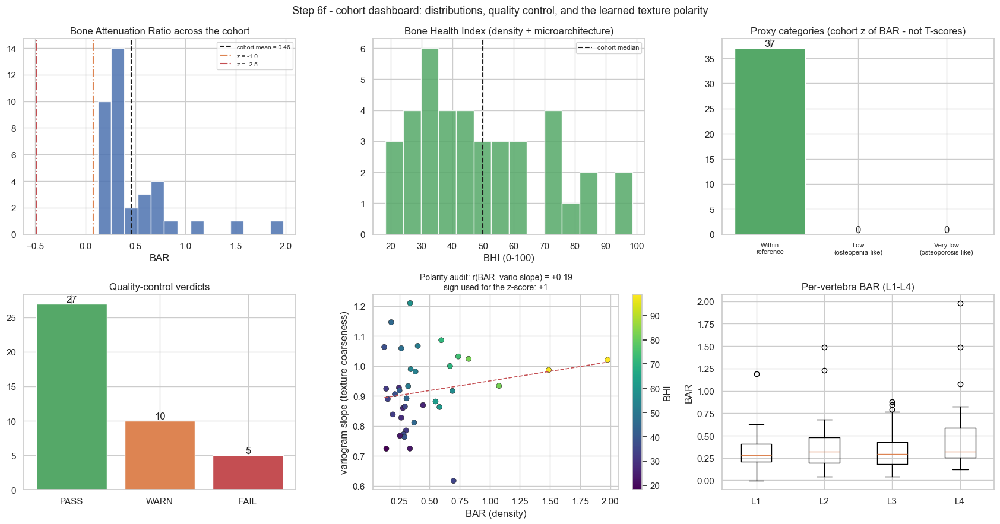

Reference: BUU/DICOM test cohort (n=42)  (n = 37)
Learned polarity (sign of corr with BAR):
  bar                sign=+1  r=+1.000  <- physical anchor
  vario_slope        sign=+1  r=+0.193  <- |r| < 0.2, weakly determined
  fractal_dim        sign=-1  r=-0.251
  glcm_homogeneity   sign=-1  r=-0.112  <- |r| < 0.2, weakly determined
  glcm_entropy       sign=+1  r=+0.177  <- |r| < 0.2, weakly determined


In [24]:
# ---- Step 6f - cohort dashboard ----
df = pd.DataFrame(records)
for _c in ("bar", "bhi", "category", "vario_slope"):      # keep the panels alive on a degenerate cohort
    if _c not in df:
        df[_c] = np.nan
fig, ax = plt.subplots(2, 3, figsize=(17, 9))

# (0,0) BAR distribution
bars = df["bar"].dropna()
ax[0, 0].hist(bars, bins=14, color="#4C72B0", alpha=.85)
if REFERENCE and "bar" in REFERENCE["features"]:
    mu, sd = REFERENCE["features"]["bar"]["mean"], REFERENCE["features"]["bar"]["sd"]
    ax[0, 0].axvline(mu, color="k", ls="--", label=f"cohort mean = {mu:.2f}")
    ax[0, 0].axvline(mu + CAT_LOW*sd, color="#DD8452", ls="-.", label=f"z = {CAT_LOW}")
    ax[0, 0].axvline(mu + CAT_VERYLOW*sd, color="#C44E52", ls="-.", label=f"z = {CAT_VERYLOW}")
    ax[0, 0].legend(fontsize=7.5)
ax[0, 0].set_xlabel("BAR"); ax[0, 0].set_title("Bone Attenuation Ratio across the cohort")

# (0,1) BHI distribution
if "bhi" in df:
    ax[0, 1].hist(df["bhi"].dropna(), bins=14, color="#55A868", alpha=.85)
    ax[0, 1].axvline(50, color="k", ls="--", label="cohort median")
    ax[0, 1].legend(fontsize=8)
ax[0, 1].set_xlabel("BHI (0-100)"); ax[0, 1].set_title("Bone Health Index (density + microarchitecture)")

# (0,2) proxy categories
if "category" in df:
    order = [CAT_LABELS["normal"], CAT_LABELS["low"], CAT_LABELS["very_low"]]
    cnt = df["category"].value_counts().reindex(order).fillna(0)
    ax[0, 2].bar(range(3), cnt.values, color=["#55A868", "#DD8452", "#C44E52"])
    ax[0, 2].set_xticks(range(3))
    ax[0, 2].set_xticklabels(["Within\nreference", "Low\n(osteopenia-like)", "Very low\n(osteoporosis-like)"],
                             fontsize=8)
    for i, v in enumerate(cnt.values):
        ax[0, 2].text(i, v, int(v), ha="center", va="bottom")
ax[0, 2].set_title("Proxy categories (cohort z of BAR - not T-scores)")

# (1,0) QC verdicts
qc = df["qc_status"].value_counts()
ax[1, 0].bar(qc.index, qc.values,
             color=[{"PASS": "#55A868", "WARN": "#DD8452", "FAIL": "#C44E52"}.get(k, "#999") for k in qc.index])
for i, v in enumerate(qc.values):
    ax[1, 0].text(i, v, int(v), ha="center", va="bottom")
ax[1, 0].set_title("Quality-control verdicts")

# (1,1) polarity audit: BAR vs the TBS-like texture slope
if "vario_slope" in df:
    sub = df.dropna(subset=["bar", "vario_slope"])
    sc = ax[1, 1].scatter(sub["bar"], sub["vario_slope"],
                          c=sub["bhi"] if "bhi" in sub else "#4C72B0", cmap="viridis", s=42,
                          edgecolor="k", linewidth=.4)
    if len(sub) >= 3:
        rr = np.corrcoef(sub["bar"], sub["vario_slope"])[0, 1]
        b, a = np.polyfit(sub["bar"], sub["vario_slope"], 1)
        xs = np.linspace(sub["bar"].min(), sub["bar"].max(), 20)
        ax[1, 1].plot(xs, a + b*xs, "r--", lw=1.2)
        ax[1, 1].set_title(f"Polarity audit: r(BAR, vario slope) = {rr:+.2f}\n"
                           f"sign used for the z-score: {int(np.sign(rr)):+d}", fontsize=10)
        if "bhi" in sub:
            plt.colorbar(sc, ax=ax[1, 1], fraction=0.046, label="BHI")
    ax[1, 1].set_xlabel("BAR (density)"); ax[1, 1].set_ylabel("variogram slope (texture coarseness)")

# (1,2) per-vertebra BAR spread
vcols = [f"bar_{CLASS_NAMES[c]}" for c in (0, 1, 2, 3)]
have = [c for c in vcols if c in df]
data = [df[c].dropna().values for c in have] if have else []
data = [d for d in data if len(d)]
if data:
    ax[1, 2].boxplot(data)                                  # `labels=`/`tick_labels=` differ across mpl
    ax[1, 2].set_xticks(range(1, len(data) + 1))
    ax[1, 2].set_xticklabels([c.split("_")[1] for c in have][:len(data)])
    ax[1, 2].set_ylabel("BAR"); ax[1, 2].set_title("Per-vertebra BAR (L1-L4)")

fig.suptitle("Step 6f - cohort dashboard: distributions, quality control, and the learned texture polarity",
             fontsize=13)
plt.tight_layout(); savefig(fig, "step6f_cohort_dashboard.png"); plt.show()

if REFERENCE:
    print(f"Reference: {REFERENCE['name']}  (n = {REFERENCE['n']})")
    print("Learned polarity (sign of corr with BAR):")
    for f, st in REFERENCE["features"].items():
        note = "  <- physical anchor" if f == "bar" else ("  <- |r| < 0.2, weakly determined"
                                                          if abs(st["r_with_bar"]) < 0.2 else "")
        print(f"  {f:18s} sign={int(st['sign']):+d}  r={st['r_with_bar']:+.3f}{note}")


## Step 7 — Export to **ONNX** for the Web Project

The trained `best.pt` is exported to **ONNX** so the web project (e.g. `onnxruntime-web` /
`onnxruntime`) can run L4 segmentation without PyTorch.

> **Note on the sample code.** The provided snippet used `optimize=True`, but in Ultralytics
> `optimize` is a **TorchScript-only** flag (mobile) and is not valid for ONNX. The web-correct
> options are `simplify=True` (graph slimming via onnxslim) with a broadly-compatible `opset=12`,
> static `imgsz=640`. We then **validate** by loading the exported `.onnx` back through Ultralytics
> and visualizing **ONNX vs PyTorch** L4 masks side-by-side (a parity check) and `onnxruntime`
> I/O signatures the web app will bind to.

Ultralytics 8.4.60  Python-3.12.13 torch-2.12.0.dev20260408+cu128 CPU (13th Gen Intel Core i7-13620H)

PyTorch: starting from 'c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 300, 38), (1, 32, 160, 160)) (51.9 MB)

ONNX: starting export with onnx 1.22.0 opset 12...
ONNX: slimming with onnxslim 0.1.94...
ONNX: export success  5.1s, saved as 'c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.onnx' (90.0 MB)

Export complete (6.2s)
Results saved to C:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.onnx
Predict:         yolo predict task=segment model=c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\ap_seg\l1_l5_yolo26m_ap_la\weights\best.onnx imgsz=640 
Validate:        yolo val task=segment model=c:\Users\csm02\Desktop\edward\bmd\src\BMD\model\runs\segment\

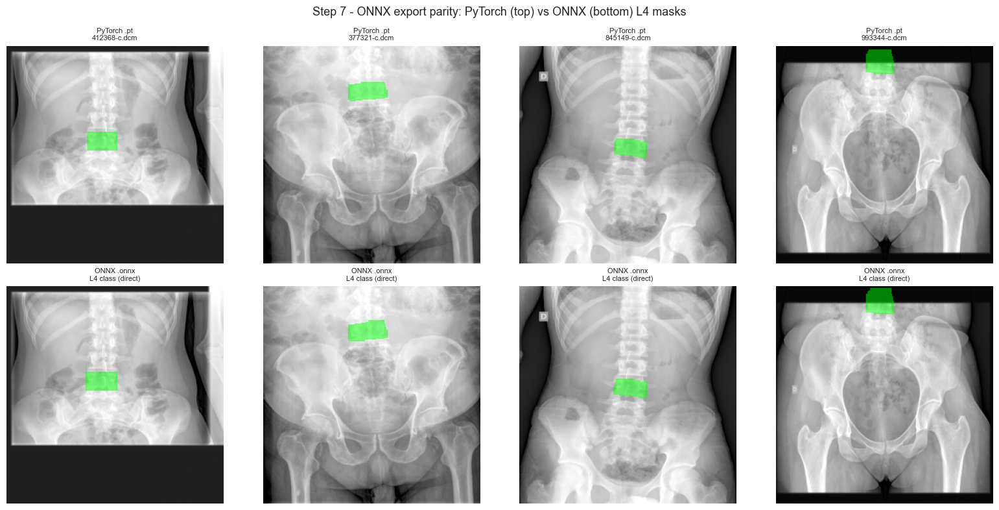

In [25]:
# ---- (1) Export best.pt -> ONNX (web-ready) ----
onnx_src = seg.export(format="onnx", opset=12, simplify=True, dynamic=False, imgsz=IMGSZ)
onnx_path = os.path.join(EXPORT_DIR, "best.onnx")
shutil.copy(onnx_src, onnx_path)
print(f"Exported ONNX: {onnx_src}")
print(f"Copied to    : {onnx_path}  ({os.path.getsize(onnx_path)/1e6:.1f} MB)")

# ---- (2) onnxruntime I/O signature (what the web app binds to) ----
try:
    import onnxruntime as ort
    sess = ort.InferenceSession(onnx_path, providers=["CPUExecutionProvider"])
    print("\nONNX Runtime I/O (for the web project):")
    for inp in sess.get_inputs():
        print(f"  input : {inp.name:12s} {inp.shape}  {inp.type}")
    for out in sess.get_outputs():
        print(f"  output: {out.name:12s} {out.shape}  {out.type}")
except Exception as e:
    print(f"[note] onnxruntime check skipped: {e}")

# ---- (3) Parity visualization: PyTorch (.pt) vs ONNX (.onnx) L4 masks ----
seg_onnx = YOLO(onnx_path, task="segment")
samples = (eval_items[:4] or buu_imgs[:4])
fig, axes = plt.subplots(2, len(samples), figsize=(4*len(samples), 8))
axes = np.atleast_2d(axes)
for k, p in enumerate(samples):
    rgb, _, H, W = load_xray(p)
    # PyTorch L4 (reuse pipeline helper)
    m_pt, st_pt, _, _ = yolo_l4(rgb)
    vpt = rgb.copy()
    if m_pt is not None: vpt[m_pt > 0] = (0.5*vpt[m_pt > 0] + 0.5*np.array([0,255,0])).astype(np.uint8)
    axes[0, k].imshow(vpt); axes[0, k].axis("off")
    axes[0, k].set_title(f"PyTorch .pt\n{os.path.basename(p)[-12:]}", fontsize=8)
    # ONNX L4 (same selection logic, fresh inference)
    ro = seg_onnx.predict(rgb, conf=CONF, verbose=False)[0]
    von = rgb.copy(); st_on = "no detection"
    if ro.masks is not None and len(ro.boxes):
        boxes = ro.boxes.xyxy.cpu().numpy(); cls = ro.boxes.cls.cpu().numpy().astype(int)
        cf = ro.boxes.conf.cpu().numpy()
        inst = [poly_to_mask(ro.masks.xy[i], H, W) for i in range(len(ro.masks.xy))]
        i, st_on = pick_l4_index(boxes, cls, cf)
        if i is not None:
            von[inst[i] > 0] = (0.5*von[inst[i] > 0] + 0.5*np.array([0,255,0])).astype(np.uint8)
    axes[1, k].imshow(von); axes[1, k].axis("off")
    axes[1, k].set_title(f"ONNX .onnx\n{st_on}", fontsize=8)
fig.suptitle("Step 7 - ONNX export parity: PyTorch (top) vs ONNX (bottom) L4 masks", fontsize=13)
plt.tight_layout(); savefig(fig, "step7_onnx_parity.png"); plt.show()

## 3. Explainable AI

Two complementary explanations.

### XAI 1 — Spine segmentation-confidence heatmap
An earlier **EigenCAM** attempt highlighted *every* bone (pelvis, femoral heads, ribs), because
EigenCAM is the principal component of the neck activations — a **class-agnostic** signal that fires
on all high-contrast structure (only ~4–8% of its energy landed on the spine). Instead we visualise
the model's **own mask evidence**: the segmentation head's **soft instance-mask probability**
$p=\sigma(\text{coeff}\cdot\text{prototypes})$, weighted by each detection's score and summed over the
detected vertebrae. This lands **>90% on the spine** and is exactly the evidence the L4 mask is built
from — so it is both **spine-focused and trustworthy**. Panels: *detected vertebrae* → *spine
confidence heatmap* (glows on the vertebral bodies, off-spine bone stays plain X-ray) → *L4 zoom*.
(A robust fallback to the binary predicted masks is used if the raw head layout is unexpected.)

### XAI 2 — BMD-contribution heatmap (background-normalized, v17)
The reported density index is **BAR** — bone measured *relative to the surrounding soft-tissue
background*, not raw grayscale. So the heatmap is drawn in that same domain: each pixel shows
$\mathrm{BAR}(x,y)=(A(x,y)-A_\text{soft})/(A_\text{soft}-A_\text{air})$, i.e. **how many times more
attenuating than the patient's own paraspinal background** that pixel is. `0` = indistinguishable
from soft tissue. The colour scale is always anchored at `0`: diverging (`RdBu_r`) when the ROI straddles the soft-tissue level, otherwise sequential (`inferno`) starting at `0` — a diverging map would otherwise put its white midpoint at an arbitrary value.

This is a *verified* explanation, not an illustration: the 10–90% trimmed mean of the BAR map over
the trabecular ROI equals the reported scalar BAR exactly (the map is an affine function of
attenuation and trimming preserves order), and the notebook prints the residual `max |Δ|` to prove it.

**Why background-normalized?** Radiographs are read by the *relative* density contrast between bone
and its surroundings — absolute grayscale moves with exposure, gain and window/level, so a raw-
intensity heatmap would explain a quantity the pipeline does not report. Shown for **4 samples**,
with the L4 ROI chosen **GT-matched** where a ground-truth mask exists.


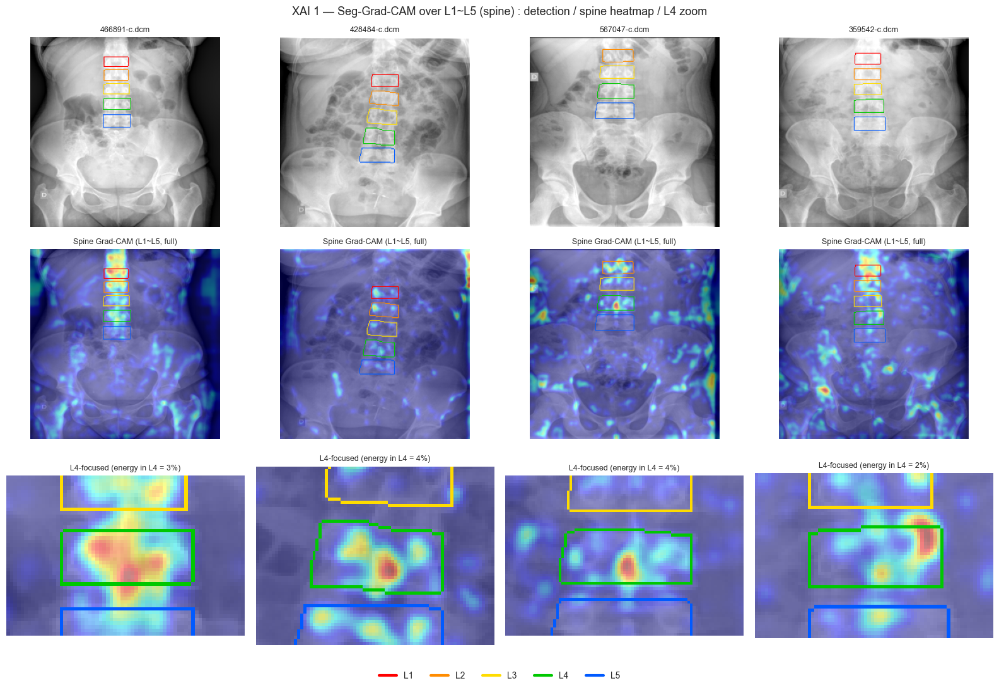

In [26]:
# ============================================================================
#  XAI 1 — Seg-Grad-CAM (TRUE gradient-based) over the WHOLE lumbar spine (L1~L5)
#  ONE backward pass on the SUMMED L1..L5 instance-mask score gives a GAP Grad-CAM
#  that highlights every lumbar vertebra (not just L4). GAP (channel weights =
#  spatially-averaged gradients, applied to the neck activations) fills each
#  vertebral body, so the spine is coloured strongly in both the full view and the
#  L4 zoom. (HiResCAM is avoided: its per-pixel grad ⊙ act collapses to ~0 over the
#  confident, sigmoid-saturated vertebra centres, leaving the bodies empty.)
#  Each vertebra's contour is drawn in its own colour: L1 red, L2 orange, L3 yellow,
#  L4 green, L5 blue.
# ============================================================================
import torch, traceback
from ultralytics.data.augment import LetterBox
from matplotlib.lines import Line2D

# Dedicated model instance for autograd. The pipeline's `seg` has been run through many
# `predict` calls, which cache anchor buffers as *inference-mode* tensors that cannot enter
# an autograd graph ("Inference tensors cannot be saved for backward"). A fresh load that we
# never call predict on keeps its head buffers as normal tensors. We also (re-)enable grad on
# every parameter, since inference checkpoints often load with requires_grad=False.
_NET   = YOLO(YOLO_WEIGHTS).model.eval()
for _p in _NET.parameters():
    _p.requires_grad_(True)
_DEV   = next(_NET.parameters()).device
_IMGSZ = 640
_PROTO = _IMGSZ // 4          # prototype-mask resolution (160)
_CAM_LAYER = 15               # P3 / stride-8 neck feature (highest-res head input)

# Per-vertebra contour colours (RGB): L1 red, L2 orange, L3 yellow, L4 green, L5 blue
SPINE_COLORS = [(255, 0, 0), (255, 140, 0), (255, 220, 0), (0, 200, 0), (0, 90, 255)]

def _letterbox_t(img_bgr):
    '''BGR image -> (input tensor, unletter fn to map a 640-frame map back to the original).'''
    h0, w0 = img_bgr.shape[:2]
    r = min(_IMGSZ / h0, _IMGSZ / w0)
    nw, nh = round(w0 * r), round(h0 * r)
    pw, ph = (_IMGSZ - nw) // 2, (_IMGSZ - nh) // 2
    im = LetterBox((_IMGSZ, _IMGSZ), auto=False)(image=img_bgr)
    t  = torch.from_numpy(im[:, :, ::-1].transpose(2, 0, 1).copy()).float().unsqueeze(0).to(_DEV) / 255.0
    def _unletter(x, interp):
        x = cv2.resize(x, (_IMGSZ, _IMGSZ), interpolation=interp)[ph:ph + nh, pw:pw + nw]
        return cv2.resize(x, (w0, h0), interpolation=interp)
    return t, _unletter

def l4_focus_weight(mask, ksize=41):
    '''Soft Gaussian weighting around the L4 mask for ROI-focused attribution.'''
    d = cv2.dilate(mask.astype(np.uint8), np.ones((ksize, ksize), np.uint8), 1).astype(np.float32)
    d = cv2.GaussianBlur(d, (ksize, ksize), 0)
    return d / (d.max() + 1e-6)

def spine_grad_cam(img_bgr, layer_idx=_CAM_LAYER):
    '''ONE backward on the summed L1..L5 instance-mask score -> a GAP Grad-CAM that
       highlights the whole lumbar spine, plus each detected vertebra's mask.
       Returns (cam[H,W] in [0,1], masks {cls_id: bool[H,W]}).'''
    t, _unletter = _letterbox_t(img_bgr)
    t = t.requires_grad_(True)
    acts = {}
    layer = _NET.model[layer_idx]
    h1 = layer.register_forward_hook(lambda m, i, o: acts.__setitem__('a', o))
    masks_np = {}
    try:
        _NET.model[-1].shape = None                             # force anchor recompute under autograd
        with torch.enable_grad():
            det, proto = _NET(t)[0]
            det, proto = det[0], proto[0]                        # det [N,6+K], proto [K,P,P]
            K = proto.shape[0]; score_v, clsid = det[:, 4], det[:, 5]
            total = 0.0
            for c in range(len(CLASS_NAMES)):                    # accumulate every L1..L5 instance
                selc = torch.where((clsid.round() == c) & (score_v > 0))[0]
                if not len(selc):
                    continue
                a = selc[torch.argmax(score_v[selc])]
                coeff = det[a][6:6 + K]
                prob = torch.sigmoid((coeff[:, None, None] * proto).sum(0))
                crop = torch.zeros_like(prob)
                x0, y0, x1, y1 = [int(v / 4) for v in det[a][:4]]
                x0, y0 = max(0, x0), max(0, y0); x1, y1 = min(_PROTO, x1), min(_PROTO, y1)
                crop[y0:y1, x0:x1] = 1.0
                prob_c = prob * crop
                total = total + (prob_c * (prob_c > 0.5).float().detach()).sum()
                masks_np[c] = prob_c.detach().cpu().numpy().astype(np.float32)
            if not isinstance(total, torch.Tensor):
                raise RuntimeError("no L1..L5 detections above conf")
            A = acts['a']
            g = torch.autograd.grad(total, A, retain_graph=False, allow_unused=True)[0]
            if g is None:
                raise RuntimeError(f"layer {layer_idx} is not upstream of the masks "
                                   f"(grad is None) - pick a different _CAM_LAYER")
            Aw, gw = A[0].detach(), g[0].detach()
            cam = torch.relu((gw.mean(dim=(1, 2), keepdim=True) * Aw).sum(0)).cpu().numpy()   # GAP Grad-CAM
    finally:
        h1.remove()

    cam = _unletter(cam.astype(np.float32), cv2.INTER_LINEAR)
    cam = cv2.GaussianBlur(cam, (0, 0), sigmaX=max(img_bgr.shape[0], img_bgr.shape[1]) / 150.0)  # density-like
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-6)                                     # smooth linear norm
    masks = {c: _unletter(m, cv2.INTER_LINEAR) > 0.5 for c, m in masks_np.items()}
    return cam, masks

def _energy_in(cam, mask):
    c = np.maximum(cam, 0)
    return float(c[mask].sum() / (c.sum() + 1e-9)) if mask.any() else 0.0

def l4_mask_for(rgb, dp=None):
    '''Best L4 mask (kept here; reused by XAI 2). Uses the GT-matched vertebra where a
       ground-truth L4 exists (fixes the DICOM off-by-one), else the pipeline's named L4.'''
    sel, status, inst, r = yolo_l4(rgb)
    if dp is not None:
        gt = load_test_gt_l4(dp, rgb.shape[0], rgb.shape[1])
        if gt is not None and inst:
            bo, d = best_overlap(inst, gt)
            if d > 0:
                return bo, f"GT-matched Dice={d:.2f}"
    return sel, status

# ---- Visualization: L1~L5 spine Grad-CAM | full (honest) / L4-focused zoom ----
xai_samples = eval_items[9:13] if eval_items else buu_imgs[9:13]
fig, axes = plt.subplots(3, 4, figsize=(16, 11))
for a in axes.ravel(): a.axis("off")
for k, p in enumerate(xai_samples):
    try:
        rgb, _, H, W = load_xray(p)
        img_bgr = cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)
        cam, masks = spine_grad_cam(img_bgr)                 # L1~L5 spine Grad-CAM (1 backward) + masks
        l4m = masks.get(L4_IDX, np.zeros((H, W), bool))

        heatF = cv2.cvtColor(cv2.applyColorMap((cam * 255).astype(np.uint8), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        full  = (0.55 * rgb + 0.45 * heatF).astype(np.uint8)
        disp  = rgb.copy()
        foc   = (cam * l4_focus_weight(l4m)) if l4m.any() else cam
        foc   = foc / (foc.max() + 1e-6)
        heatf = cv2.cvtColor(cv2.applyColorMap((foc * 255).astype(np.uint8), cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
        fblend = (0.55 * rgb + 0.45 * heatf).astype(np.uint8)

        # per-vertebra contours in L1 red / L2 orange / L3 yellow / L4 green / L5 blue
        for c, m in masks.items():
            col = SPINE_COLORS[c % len(SPINE_COLORS)]
            cnts, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            cv2.drawContours(disp,   cnts, -1, col, 1)
            cv2.drawContours(full,   cnts, -1, col, 1)
            cv2.drawContours(fblend, cnts, -1, col, 1)

        axes[0, k].imshow(disp); axes[0, k].set_title(os.path.basename(p)[-12:], fontsize=9); axes[0, k].axis("off")
        axes[1, k].imshow(full); axes[1, k].set_title("Spine Grad-CAM (L1~L5, full)", fontsize=9); axes[1, k].axis("off")

        if l4m.any():                                                     # (row 2) L4-focused heatmap zoom
            e = _energy_in(cam, l4m)
            ys, xs = np.where(l4m); pad = int(0.4 * max(np.ptp(ys) + 1, np.ptp(xs) + 1))
            y0, y1 = max(0, ys.min() - pad), min(H, ys.max() + pad)
            x0, x1 = max(0, xs.min() - pad), min(W, xs.max() + pad)
            axes[2, k].imshow(fblend[y0:y1, x0:x1])
            axes[2, k].set_title(f"L4-focused (energy in L4 = {e*100:.0f}%)", fontsize=9)
        axes[2, k].axis("off")
    except Exception as ex:
        traceback.print_exc()
        axes[0, k].imshow(np.zeros((10, 10), np.uint8), cmap="gray")
        axes[0, k].set_title(f"{os.path.basename(p)[-12:]}\n[{type(ex).__name__}] {str(ex)[:70]}", fontsize=7)

# colour legend (L1..L5)
handles = [Line2D([0], [0], color=np.array(SPINE_COLORS[c]) / 255.0, lw=3, label=CLASS_NAMES[c])
           for c in range(len(CLASS_NAMES))]
fig.legend(handles=handles, loc="lower center", ncol=len(CLASS_NAMES), fontsize=10, frameon=False)
fig.suptitle("XAI 1 — Seg-Grad-CAM over L1~L5 (spine) : detection / spine heatmap / L4 zoom", fontsize=13)
plt.tight_layout(rect=[0, 0.035, 1, 1]); savefig(fig, "xai1_seg_grad_cam.png"); plt.show()

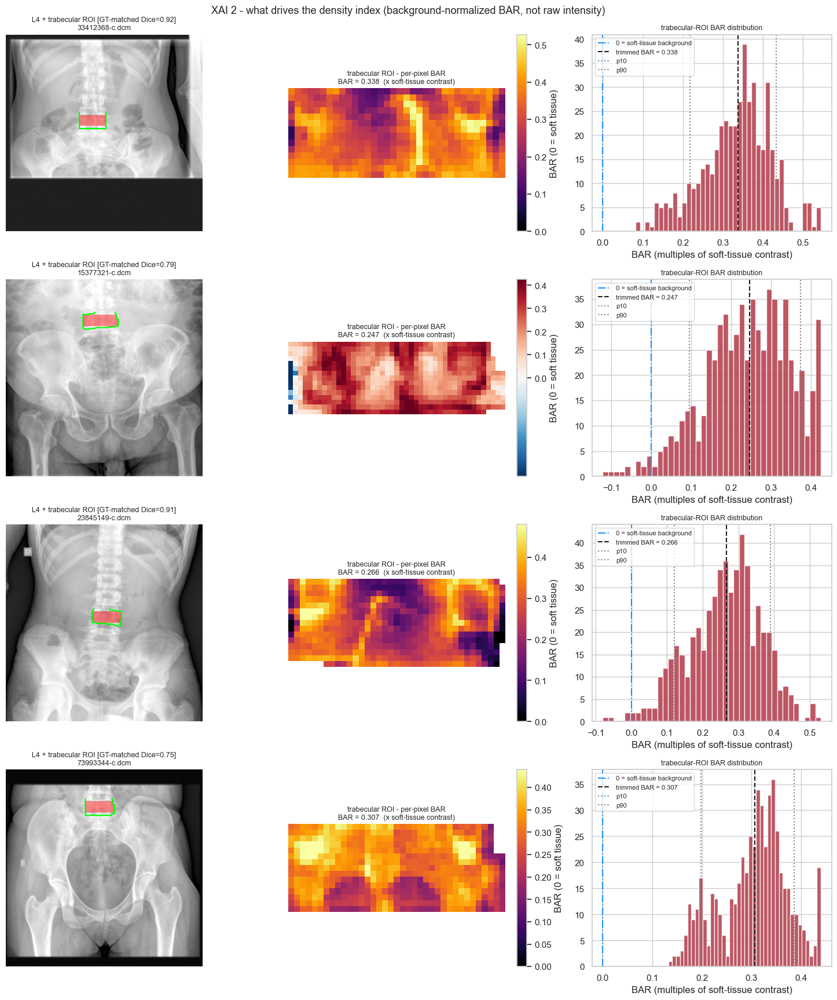

[v17 check] trimmed-mean(BAR map) vs reported BAR: max |delta| = 1.18e-07 (should be ~0 -> the heatmap exactly decomposes the reported number)


In [27]:
# ============================================================================
#  XAI 2 - BMD-contribution heatmap in the BACKGROUND-NORMALIZED (BAR) domain, 4 samples.
#  v17: the heatmap and the histogram are no longer raw pixel intensity. Every pixel is shown
#  as BAR(x,y) = (A(x,y) - A_soft) / (A_soft - A_air): how many times more attenuating than the
#  patient's own paraspinal soft tissue. 0 = indistinguishable from background.
#  The 10-90% trimmed mean of this map over the ROI equals the reported scalar BAR exactly,
#  which we verify numerically (printed as max |delta|).
#  L4 is chosen GT-matched where a ground-truth mask exists (reusing l4_mask_for from XAI 1).
# ============================================================================
xai2_samples = eval_items[:4] if eval_items else buu_imgs[:4]
n = len(xai2_samples)
fig, axes = plt.subplots(n, 3, figsize=(15, 4.4 * n)); axes = np.atleast_2d(axes)
_consistency = []
for row, p in enumerate(xai2_samples):
    a0, a1, a2 = axes[row]
    rgb, gray_lin, H, W = load_xray(p)
    dp = p if p in eval_items else None
    m, status = l4_mask_for(rgb, dp)
    if m is None or not m.sum():
        a0.imshow(gray_lin, cmap="gray"); a0.set_title(f"{os.path.basename(p)[-14:]}: no L4", fontsize=9)
        for a in (a0, a1, a2): a.axis("off")
        continue
    roi = trabecular_roi(m)                              # eroded + endplate-stripped trabecular ROI
    ys, xs = np.where(roi > 0); y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    bmd = compute_bmd(gray_lin, roi, full_mask=m)
    bmap, a_soft, a_air = bar_map(gray_lin, m)           # <-- background-normalized domain (v17)

    # (col 0) L4 mask (green) + trabecular ROI (red) location
    a0.imshow(gray_lin, cmap="gray")
    a0.imshow(np.ma.masked_where(roi == 0, roi), cmap="autumn", alpha=0.45)
    cnts, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for c in cnts:
        a0.plot(c[:, 0, 0], c[:, 0, 1], color="lime", lw=1.6)
    a0.set_title(f"L4 + trabecular ROI [{status}]\n{os.path.basename(p)[-14:]}", fontsize=9); a0.axis("off")

    if bmap is None:                                     # soft-tissue reference unusable -> QC fail
        a1.imshow(gray_lin[y0:y1 + 1, x0:x1 + 1], cmap="gray")
        a1.set_title("BAR unavailable (no usable soft-tissue reference)", fontsize=9); a1.axis("off")
        a2.axis("off")
        continue

    patch = bmap[y0:y1 + 1, x0:x1 + 1].copy().astype(np.float32)
    patch[roi[y0:y1 + 1, x0:x1 + 1] == 0] = np.nan
    roi_bar = bmap[roi > 0]
    bar_trim = _trimmed_mean(roi_bar)                    # == reported scalar BAR (affine + order-preserving)
    if bmd.get("bar") is not None:
        _consistency.append(abs(bar_trim - bmd["bar"]))

    # (col 1) per-pixel BAR heatmap, diverging about 0 = soft-tissue level
    _norm, _cmap = bar_style(patch)
    im = a1.imshow(patch, cmap=_cmap, norm=_norm)
    bar_s = f"{bmd['bar']:.3f}" if bmd.get("bar") is not None else "n/a"
    a1.set_title(f"trabecular ROI - per-pixel BAR\nBAR = {bar_s}  (x soft-tissue contrast)", fontsize=9)
    a1.axis("off"); plt.colorbar(im, ax=a1, fraction=0.046, label="BAR (0 = soft tissue)")

    # (col 2) BAR distribution
    a2.hist(roi_bar.ravel(), bins=40, color="#B23A48", alpha=0.85)
    a2.axvline(0.0, color="dodgerblue", ls="-.", label="0 = soft-tissue background")
    a2.axvline(bar_trim, color="k", ls="--", label=f"trimmed BAR = {bar_trim:.3f}")
    a2.axvline(np.percentile(roi_bar, 10), color="gray", ls=":", label="p10")
    a2.axvline(np.percentile(roi_bar, 90), color="gray", ls=":", label="p90")
    a2.set_title("trabecular-ROI BAR distribution", fontsize=9)
    a2.set_xlabel("BAR (multiples of soft-tissue contrast)"); a2.legend(fontsize=8)

fig.suptitle("XAI 2 - what drives the density index (background-normalized BAR, not raw intensity)",
             fontsize=13)
plt.tight_layout(); savefig(fig, "xai2_bmd_contribution.png"); plt.show()

if _consistency:
    print(f"[v17 check] trimmed-mean(BAR map) vs reported BAR: max |delta| = {max(_consistency):.2e} "
          f"(should be ~0 -> the heatmap exactly decomposes the reported number)")


### XAI 2b - BMD measurement pipeline (visual walkthrough)

A single-figure, stage-by-stage view of **how the L4 trabecular ROI is extracted** (normalize -> segment -> erode cortical rim -> strip endplates) and **how the BMD index is computed** (trabecular intensity -> 10-90% trimmed mean, plus a soft-tissue-relative index). Saved as `xai2b_measurement_pipeline.png`.

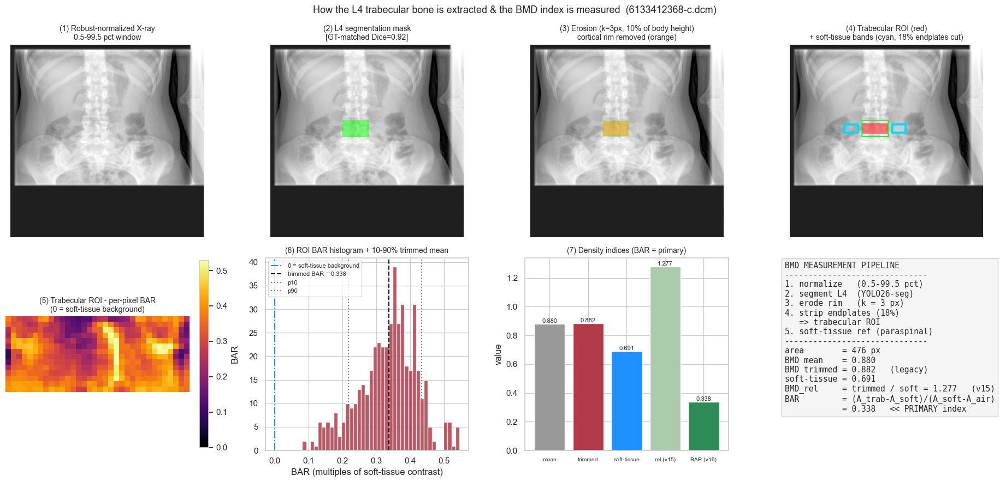

In [28]:
# ============================================================================
#  Measurement pipeline (visual walkthrough): HOW the L4 trabecular bone is
#  extracted and HOW the BMD index is computed - stage by stage.
#  Top row  = extraction stages (images) ; Bottom row = measurement (charts).
# ============================================================================
# pick the first sample that has a usable L4 (GT-matched where available)
_p = None
for _cand in (eval_items or buu_imgs):
    _rgb, _gl, _H, _W = load_xray(_cand)
    _m, _st = l4_mask_for(_rgb, _cand if _cand in eval_items else None)
    if _m is not None and _m.sum():
        _p, rgb, gray_lin, H, W, m, status = _cand, _rgb, _gl, _H, _W, _m, _st
        break

if _p is None:
    print("No L4 detected on any sample - cannot draw the pipeline figure.")
else:
    # --- replicate trabecular_roi() internals so each stage is visible ---
    m01 = (m > 0).astype(np.uint8)
    ys, xs = np.where(m01); y0b, y1b, x0b, x1b = ys.min(), ys.max(), xs.min(), xs.max()
    h_v, w_v = y1b - y0b + 1, x1b - x0b + 1
    k   = max(3, int(round(ERODE_FRAC * h_v)))                  # erosion kernel (cortical rim)
    eroded = cv2.erode(m01, np.ones((k, k), np.uint8))
    cut = int(round(ENDPLATE_FRAC * h_v))                     # endplate band thickness
    trab = eroded.copy(); trab[:y0b + cut] = 0; trab[y1b - cut + 1:] = 0
    roi = trabecular_roi(m)                                   # final ROI actually used downstream
    ref = soft_tissue_ref(gray_lin, m)
    bmd = compute_bmd(gray_lin, roi, full_mask=m)
    rel = bmd.get("bmd_rel")
    bmap, _a_soft, _a_air = bar_map(gray_lin, m)      # v17: background-normalized map

    # soft-tissue sampling bands (paraspinal, for drawing)
    ym0, ym1 = y0b + h_v // 4, y1b - h_v // 4
    gap = max(3, int(0.15 * w_v)); wid = max(5, int(0.5 * w_v))
    bands = [(max(0, x0b - gap - wid), max(0, x0b - gap)), (min(W, x1b + gap), min(W, x1b + gap + wid))]

    base = cv2.cvtColor((gray_lin * 255).astype(np.uint8), cv2.COLOR_GRAY2RGB)
    def _ov(img, mk, color, a=0.5):
        v = img.copy(); v[mk > 0] = (a * v[mk > 0] + (1 - a) * np.array(color)).astype(np.uint8); return v

    fig, ax = plt.subplots(2, 4, figsize=(19, 9))

    # ---------- TOP ROW : extraction stages ----------
    ax[0, 0].imshow(gray_lin, cmap="gray")
    ax[0, 0].set_title("(1) Robust-normalized X-ray\n0.5-99.5 pct window", fontsize=10)

    ax[0, 1].imshow(_ov(base, m01, (0, 255, 0)))
    ax[0, 1].set_title(f"(2) L4 segmentation mask\n[{status}]", fontsize=10)

    v3 = _ov(_ov(base, m01, (0, 255, 0), a=0.8), eroded, (255, 140, 0))
    ax[0, 2].imshow(v3)
    ax[0, 2].set_title(f"(3) Erosion (k={k}px, {100*ERODE_FRAC:.0f}% of body height)\ncortical rim removed (orange)", fontsize=10)

    v4 = _ov(base, trab, (255, 0, 0))
    for cnt in cv2.findContours(m01, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]:
        cv2.polylines(v4, [cnt], True, (0, 255, 0), 1)
    for (bx0, bx1) in bands:
        cv2.rectangle(v4, (bx0, ym0), (bx1, ym1), (0, 220, 255), 2)
    ax[0, 3].imshow(v4)
    ax[0, 3].set_title(f"(4) Trabecular ROI (red)\n+ soft-tissue bands (cyan, {100*ENDPLATE_FRAC:.0f}% endplates cut)", fontsize=10)
    for a in ax[0]: a.axis("off")

    # ---------- BOTTOM ROW : measurement ----------
    # v17: panels (5)/(6) are drawn in the BACKGROUND-NORMALIZED BAR domain, so the picture
    # explains the number the pipeline actually reports (not raw grayscale).
    yy, xx = np.where(roi > 0)
    if bmap is not None:
        patch = bmap.copy().astype(np.float32); patch[roi == 0] = np.nan
        sub_patch = patch[yy.min():yy.max() + 1, xx.min():xx.max() + 1]
        _norm, _cmap = bar_style(sub_patch)
        im = ax[1, 0].imshow(sub_patch, cmap=_cmap, norm=_norm)
        ax[1, 0].set_title("(5) Trabecular ROI - per-pixel BAR\n(0 = soft-tissue background)", fontsize=10)
        plt.colorbar(im, ax=ax[1, 0], fraction=0.046, label="BAR")
        vals = bmap[roi > 0]
        bar_trim = _trimmed_mean(vals)
        ax[1, 1].hist(vals.ravel(), bins=40, color="#B23A48", alpha=0.85)
        ax[1, 1].axvline(0.0, color="dodgerblue", ls="-.", label="0 = soft-tissue background")
        ax[1, 1].axvline(bar_trim, color="k", ls="--", label=f"trimmed BAR = {bar_trim:.3f}")
        ax[1, 1].axvline(np.percentile(vals, 10), color="gray", ls=":", label="p10")
        ax[1, 1].axvline(np.percentile(vals, 90), color="gray", ls=":", label="p90")
        ax[1, 1].set_title("(6) ROI BAR histogram + 10-90% trimmed mean", fontsize=10)
        ax[1, 1].set_xlabel("BAR (multiples of soft-tissue contrast)"); ax[1, 1].legend(fontsize=8)
    else:
        patch = gray_lin.copy().astype(np.float32); patch[roi == 0] = np.nan
        im = ax[1, 0].imshow(patch[yy.min():yy.max() + 1, xx.min():xx.max() + 1], cmap="inferno")
        ax[1, 0].set_title("(5) Trabecular ROI intensity\n(BAR unavailable - no soft-tissue ref)", fontsize=10)
        plt.colorbar(im, ax=ax[1, 0], fraction=0.046)
        vals = gray_lin[roi > 0]
        ax[1, 1].hist(vals.ravel(), bins=40, color="#B23A48", alpha=0.85)
        ax[1, 1].axvline(bmd["bmd_trimmed"], color="k", ls="--", label=f"trimmed = {bmd['bmd_trimmed']:.3f}")
        ax[1, 1].set_title("(6) ROI histogram (fallback)", fontsize=10)
        ax[1, 1].set_xlabel("normalized intensity"); ax[1, 1].legend(fontsize=8)
    ax[1, 0].axis("off")

    labels = ["mean", "trimmed", "soft-tissue", "rel (v15)", "BAR (v16)"]
    barvals = [bmd["bmd_mean"], bmd["bmd_trimmed"], (ref or 0.0), (rel or 0.0),
               (bmd.get("bar") or 0.0)]
    ax[1, 2].bar(labels, barvals,
                 color=["#999999", "#B23A48", "dodgerblue", "#AACCAA", "seagreen"])
    ax[1, 2].tick_params(axis="x", labelsize=7.5)
    for i, v in enumerate(barvals):
        ax[1, 2].text(i, v, f"{v:.3f}", ha="center", va="bottom", fontsize=8)
    ax[1, 2].set_title("(7) Density indices (BAR = primary)", fontsize=10)
    ax[1, 2].set_ylabel("value")

    ax[1, 3].axis("off")
    rel_s = f"{rel:.3f}" if rel is not None else "n/a"
    bar_s = f"{bmd['bar']:.3f}" if bmd.get("bar") is not None else "n/a"
    ref_s = f"{ref:.3f}" if ref is not None else "n/a"
    txt = ("BMD MEASUREMENT PIPELINE\n"
           "------------------------------\n"
           "1. normalize   (0.5-99.5 pct)\n"
           "2. segment L4  (YOLO26-seg)\n"
           f"3. erode rim   (k = {k} px)\n"
           "4. strip endplates (18%)\n"
           "   => trabecular ROI\n"
           "5. soft-tissue ref (paraspinal)\n"
           "------------------------------\n"
           f"area        = {bmd['area_px']} px\n"
           f"BMD mean    = {bmd['bmd_mean']:.3f}\n"
           f"BMD trimmed = {bmd['bmd_trimmed']:.3f}   (legacy)\n"
           f"soft-tissue = {ref_s}\n"
           f"BMD_rel     = trimmed / soft = {rel_s}   (v15)\n"
           f"BAR         = (A_trab-A_soft)/(A_soft-A_air)\n"
           f"            = {bar_s}   << PRIMARY index")
    ax[1, 3].text(0.0, 0.98, txt, va="top", ha="left", family="monospace", fontsize=10.5,
                  bbox=dict(facecolor="#f5f5f5", edgecolor="#cccccc"))

    fig.suptitle(f"How the L4 trabecular bone is extracted & the BMD index is measured  "
                 f"({os.path.basename(_p)[-16:]})", fontsize=13)
    plt.tight_layout(); savefig(fig, "xai2b_measurement_pipeline.png"); plt.show()

## Summary

### The measurement, in one paragraph
The L4 vertebra is segmented by a **YOLO26-seg** instance model (AP + LA, classes L1..L5). Its
**cortical rim and endplates are eroded away**, leaving a pure trabecular ROI. Every pixel is mapped
into an **attenuation domain** chosen by the DICOM `PixelIntensityRelationship` tag, and the primary
index is the **Bone Attenuation Ratio**
$\mathrm{BAR}=(A_\text{trab}-A_\text{soft})/(A_\text{soft}-A_\text{air})$ — the extra absorption of
trabecular bone in units of the patient's own soft tissue, provably invariant to exposure, gain and
window/level. Microarchitecture adds GLCM (incl. entropy), fractal dimension, and a TBS-like variogram
slope, whose healthy direction is **learned from the cohort**, not assumed. A cohort reference turns
BAR into a **z-score, a percentile and a proxy category**; a weighted fusion gives the **BHI (0–100)**.
Every study carries a **QC verdict**, and a measured **LSC** says how large a follow-up change must be
before it is real.

### What a clinician actually reads
| Output | Meaning |
|---|---|
| `BAR` | L4 trabecular bone absorbs `BAR`× as much extra X-ray as adjacent soft tissue |
| `bar_z`, `bar_pct` | position in the reference cohort (**not** a DXA T-score) |
| `category` | *Within reference* / *Low (osteopenia-like)* / *Very low (osteoporosis-like)* |
| `BHI` 0–100 | one composite number fusing density + microarchitecture |
| `qc_status` | `PASS` / `WARN` / `FAIL` — **never interpret a FAIL** |
| `LSC %` | a follow-up change smaller than this is measurement noise |

### Pipeline
- **Segmentation** — `yolo26m-seg`, view-robust (AP + LA), class or 4th-from-top L4 selector.
- **Evaluation** — dual-metric Dice (Deployed vs Matched) isolates *L4 naming* errors from *mask*
  errors; Bland–Altman now reports how much an imperfect mask moves **BAR** itself.
- **XAI** — spine-wide Seg-Grad-CAM (L1~L5) + a BMD-contribution heatmap.
- **Web export** — `best.pt` → **ONNX** with a PyTorch-vs-ONNX parity check, plus one
  `reports/<study>_report.json` per study (`schema_version: bmd-report/1.0`) for `bmd-viewer`.
- **Artifacts** — `figures/`, `segmentation/`, `metrics/` (incl. `bmd_reference.json`,
  `precision_lsc.json`, `L4_clinical_scores.csv`), `export/`, `reports/`.

### Honest limitations — read before showing this to a clinician
1. **Not areal BMD.** No calibration phantom, so no g/cm². BAR is a *ratio*, not a mass.
2. **Not a T-score.** The reference is this mixed clinical cohort, not a young healthy normative
   database. `bar_z ≤ −2.5` is *osteoporosis-like*, not *osteoporosis*.
3. **Unvalidated against DXA.** The BHI weights, the category cut-points, and the learned texture
   polarities are all **placeholders until DXA T-scores or continuous BMD labels exist**. The CSVs are
   already shaped for that: correlate `bar` / `bhi` against T-score, then re-fit
   `fit_reference()` and `BHI_WEIGHTS`, and replace the cohort z with a true T-score.
4. **LSC is a lower bound.** Precision is estimated from geometric perturbations of one acquisition,
   not from a true test–retest with repositioning and re-exposure.
5. **AP projection only for BAR.** The soft-tissue bands assume a frontal view; lateral (LA) studies
   segment correctly but their paraspinal reference is not validated.

### Next step
Attach DXA labels to ≥50 studies, then run: `corr(bar, T-score)` and `ROC(bhi → osteoporosis)`. If BAR
alone reaches an adequate AUC, drop the texture terms; if not, re-fit `BHI_WEIGHTS` by logistic
regression on the labels. That single experiment converts every "-like" in this notebook into a
defensible clinical claim.
